In [22]:
import time
import os
import math
import cv2
import numpy as np
import pandas as pd
import pyautogui as pa
import shutil
import imageio
import re  # regex
from PIL import Image, ImageDraw
import random
from scipy.stats import sem, ttest_ind, norm
from scipy.optimize import curve_fit
import seaborn as sns
import matplotlib.cm as cm
import pickle

from lib.analysis.trace_metrics import TraceMetrics
from lib.analysis.false_discovery_control import false_discovery_control
from lib.auto_GUI.auto_PhotoZ import AutoPhotoZ
from lib.analysis.laminar_dist import *
from lib.file.TIF import *
from lib.analysis.align import ImageAlign
from lib.utilities import *
from lib.file.ROI_writer import ROIFileWriter
from lib.file.ROI_reader import ROIFileReader
from lib.analysis.barrel_roi import Barrel_ROI_Creator
from lib.analysis.cell_roi import RandomROISample, OverlapCounterROI
from lib.analysis.baseline_correction import BaselineCorrection
from lib.analysis.correlation import FunctionalConnectivityMatrix

from statsmodels.formula.api import ols
from statsmodels.stats.anova import anova_lm
import statsmodels.api as sm
from scipy.stats import linregress
import networkx as nx


In [23]:
# load trace files from the following directory
data_dir = "C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR/"
ppr_coronal_df = data_dir + "export_summary_backup_coronal.csv"
ppr_sagittal_df = data_dir + "export_summary_backup_sagittal.csv"
data_dir = "C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR_single_pixel/"
ppr_single_px_df = data_dir + "export_summary_backup_single_px.csv"

camera_program = 4
um_per_px = 6.0 #um

# load the CSVs
ppr_coronal_df = pd.read_csv(ppr_coronal_df)
ppr_sagittal_df = pd.read_csv(ppr_sagittal_df)
ppr_single_px_df = pd.read_csv(ppr_single_px_df)

# add column for Coronal/Sagittal
ppr_coronal_df['Section'] = 'Coronal'
ppr_sagittal_df['Section'] = 'Sagittal'

# merge ppr_coronal_df and ppr_sagittal_df into barrel_ppr_df
ppr_barrel_df =  ppr_coronal_df.append(ppr_sagittal_df)

# combine the dataframes or use single px only
ppr_df = ppr_single_px_df #ppr_coronal_df.append(ppr_sagittal_df)

output_fig_dir = 'P:/John/crossing-paper/input/'
ppr_barrel_df

,ROI,amp,latency,halfwidth,X_Center,Y_Center,ROI_Set,Date,Slice,Location,Recording,trace,trace_non_polyfit,amp_array,Medial/Lateral,Section,Rostral/Caudal
0,1,0.479013,120.492,18.61820,51.660221,53.138122,1_rois pulse1,1/2/2025,1,3,1,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,Home,Coronal,NaN
1,2,0.330619,120.585,30.66020,44.112853,28.366771,1_rois pulse1,1/2/2025,1,3,1,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,Lateral,Coronal,NaN
2,1,0.176925,182.307,3.53397,51.660221,53.138122,1_rois pulse2,1/2/2025,1,3,1,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,Home,Coronal,NaN
3,2,0.078507,182.489,7.29899,44.112853,28.366771,1_rois pulse2,1/2/2025,1,3,1,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,Lateral,Coronal,NaN
4,1,0.590332,120.014,12.29530,51.660221,53.138122,1_rois pulse1,1/2/2025,1,3,2,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,Home,Coronal,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1213,2,5.388340,142.602,5.38834,24.504732,41.558360,3_rois pulse1,4/16/2025,3,2,25,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,NaN,Sagittal,Rostral
1214,1,5.504880,143.043,5.50488,58.472131,43.518033,3_rois pulse1,4/16/2025,3,2,26,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,NaN,Sagittal,Home
1215,2,7.391860,141.078,7.39186,24.504732,41.558360,3_rois pulse1,4/16/2025,3,2,26,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,NaN,Sagittal,Rostral
1216,1,7.935810,185.029,7.93581,58.472131,43.518033,3_rois pulse2,4/16/2025,3,2,26,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,NaN,Sagittal,Home


In [24]:
# load PPR catalog
ppr_catalog = data_dir + "ppr_catalog_backup-both.csv"
ppr_catalog_df = pd.read_csv(ppr_catalog)

# only keep zda_file, IPI, and is_single_pulse_control columns
#ppr_catalog_df = ppr_catalog_df[['zda_file', 'IPI', 'is_single_pulse_control']]

# parse slice, location, and recording numbers from zda_file and store in new columns
ppr_catalog_df['zda_id'] = ppr_catalog_df['zda_file'].apply(lambda x: x.split('/')[-1].split('.')[0])
ppr_catalog_df['Slice'] = ppr_catalog_df['zda_id'].apply(lambda x: int(x.split('_')[0]))
ppr_catalog_df['Location'] = ppr_catalog_df['zda_id'].apply(lambda x: int(x.split('_')[1]))
ppr_catalog_df['Recording'] = ppr_catalog_df['zda_id'].apply(lambda x: int(x.split('_')[2]))

# parse date from zda_file column. It is in format "/mm-dd-yy/", use pattern matching to extract date (regex)
# Function to extract date using regex
def extract_date(filename):
    match = re.search(r'(\d{2}-\d{2}-\d{2})', filename)
    if match:
        # remove zero padding from day and month
        m,d,y = match.group(0).split('-')
        d = str(int(d))
        m = str(int(m))
        return f"{m}/{d}/20{y}"
    return None

ppr_catalog_df['Date'] = ppr_catalog_df['zda_file'].apply(extract_date)
ppr_catalog_df


,zda_file,pulse1_start,pulse1_width,pulse2_start,pulse2_width,baseline_start,baseline_width,IPI,is_single_pulse_control,done,Coronal/Sagittal,zda_id,Slice,Location,Recording,Date
0,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,236,70,356.0,70.0,236,220,60,0,1.0,Coronal,01_03_01,1,3,1,1/2/2025
1,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,236,70,NaN,NaN,236,100,60,1,1.0,Coronal,01_03_02,1,3,2,1/2/2025
2,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,276,70,NaN,NaN,276,100,40,1,1.0,Coronal,01_03_03,1,3,3,1/2/2025
3,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,276,70,356.0,70.0,276,180,40,0,1.0,Coronal,01_03_04,1,3,4,1/2/2025
4,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,336,20,356.0,70.0,336,120,10,0,1.0,Coronal,01_03_05,1,3,5,1/2/2025
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
669,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,116,70,NaN,NaN,116,100,120,1,NaN,Sagittal,03_02_22,3,2,22,4/16/2025
670,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,176,70,356.0,70.0,176,280,90,0,NaN,Sagittal,03_02_23,3,2,23,4/16/2025
671,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,176,70,NaN,NaN,176,100,90,1,NaN,Sagittal,03_02_24,3,2,24,4/16/2025
672,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,276,70,NaN,NaN,276,100,40,1,NaN,Sagittal,03_02_25,3,2,25,4/16/2025


In [25]:
def read_array_file(filename): 
    data_arr = pd.read_csv(filename,
                                 sep='\t',
                                 header=None,
                                 names=['Index',  'Values'])
    return np.array(data_arr['Values']).reshape((80, 80))

def read_dat_trace_file(filename):
    data_arr = pd.read_csv(filename,
                                 sep='\t',
                                 header=0)  # change me to traces?
    data_arr = data_arr.apply(pd.to_numeric, errors='coerce')
    return data_arr

# merge the two dataframes, using date, slice, location, and recording as keys
ppr_df = ppr_df.merge(ppr_catalog_df, on=['Date', 'Slice', 'Location', 'Recording'])

# drop the zda_file column
ppr_df.drop('zda_file', axis=1, inplace=True)

ppr_df

,ROI_File,ROI_Set,Date,Slice,Location,Recording,trace,pulse1_start,pulse1_width,pulse2_start,pulse2_width,baseline_start,baseline_width,IPI,is_single_pulse_control,done,Coronal/Sagittal,zda_id
0,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,01_rois_output__rand_0,1/2/2025,1,3,1,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,236,70,356.0,70.0,236,220,60,0,1.0,Coronal,01_03_01
1,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,01_rois_output__rand_1,1/2/2025,1,3,1,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,236,70,356.0,70.0,236,220,60,0,1.0,Coronal,01_03_01
2,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,01_rois_output__rand_0,1/2/2025,1,3,2,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,236,70,NaN,NaN,236,100,60,1,1.0,Coronal,01_03_02
3,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,01_rois_output__rand_1,1/2/2025,1,3,2,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,236,70,NaN,NaN,236,100,60,1,1.0,Coronal,01_03_02
4,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,01_rois_output__rand_0,1/2/2025,1,3,3,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,276,70,NaN,NaN,276,100,40,1,1.0,Coronal,01_03_03
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1529,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,04_rois_output__rand_1,4/9/2025,4,2,25,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,216,70,356.0,70.0,216,240,70,0,NaN,Sagittal,04_02_25
1530,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,04_rois_output__rand_2,4/9/2025,4,2,25,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,216,70,356.0,70.0,216,240,70,0,NaN,Sagittal,04_02_25
1531,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,04_rois_output__rand_0,4/9/2025,4,2,26,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,216,70,NaN,NaN,216,100,70,1,NaN,Sagittal,04_02_26
1532,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,04_rois_output__rand_1,4/9/2025,4,2,26,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,216,70,NaN,NaN,216,100,70,1,NaN,Sagittal,04_02_26


In [33]:
no_plots = False
# set matplotlib font to size 22
plt.rcParams.update({'font.size': 22})
skip_home_barrel = True
optimal_lag = 0
max_lag = 10
lags = [l for l in range(0, max_lag)]

In [6]:
# now use the StaticFC class to calculate the functional connectivity matrix
# of the PPR data.
# Use the ppr_catalog_df to get the measure window(s) for each recording
# and pass that to the StaticFC class as the measure_window argument,
# per the StaticFC class docstring.
# The measure window is the time window in which to calculate the functional connectivity matrix.
# It is a tuple of the form (start_time, end_time) in ms.



missing_files = []

total_rdm_distances = [{0: [], 1: [], 2: []} for _ in lags]
corr_matrices = {}
corr_matrices_by_slice = {}
trace_sets_dict = {}
for date in ppr_df['Date'].unique():
    date_df = ppr_df[ppr_df['Date'] == date]
    for slic in date_df['Slice'].unique():
        slic_df = date_df[date_df['Slice'] == slic]
        for loc in slic_df['Location'].unique():
            loc_df = slic_df[slic_df['Location'] == loc]
            slic_loc_id = f"{slic}_{loc}"
            
            n_ipis = len(loc_df['IPI'].unique())
            
            
            for ipi in loc_df['IPI'].unique():
                ipi_df = loc_df[loc_df['IPI'] == ipi]
                
                for control_or_ppr_type in ipi_df['is_single_pulse_control'].unique():
                    if control_or_ppr_type == 1:
                        continue  # skip single pulse controls
                    control_df = ipi_df[ipi_df['is_single_pulse_control'] == control_or_ppr_type]
                    trace_dict = {}
                    # get the measure windows for this recording
                    measure_windows = ppr_catalog_df[(ppr_catalog_df['Slice'] == slic) & 
                                                    (ppr_catalog_df['Location'] == loc) & 
                                                    (ppr_catalog_df['Date'] == date) & 
                                                    (ppr_catalog_df['IPI'] == ipi) &
                                                    (ppr_catalog_df['is_single_pulse_control'] 
                                == control_or_ppr_type)][['pulse1_start', 
                                                            'pulse1_width', 
                                                            'pulse2_start', 
                                                            'pulse2_width']].values
                    pulse1_start = int(measure_windows[0][0])
                    pulse1_width = int(measure_windows[0][1])
                    pulse2_start = measure_windows[0][2]
                    pulse2_width = measure_windows[0][3]

                    m_windows = []
                    measure_window1 = (pulse1_start, pulse1_start + pulse1_width)
                    # if pulse2_start is nan, don't use the second measure window
                    if not np.isnan(pulse2_start):
                        measure_window2 = (int(pulse2_start), 
                                           int(pulse2_start) + int(pulse2_width))
                        m_windows.append(measure_window1)
                        m_windows.append(measure_window2)
                    else:
                        m_windows.append(measure_window1)

                    # grab the trace files from the ppr_df for this recording
                    # there should be at least 2 trace files, one for each ROI
                    trace_files = control_df['trace'].values
                    if len(trace_files) < 2:
                        print("Not enough traces for this recording")
                        continue
                    
                    # we can tell which barrel it is by the trace filename last digit before .dat 
                    for trace_file in trace_files:
                        if '_rand_' not in trace_file:
                            continue
                        i_barrel = int(trace_file.split('_rand_')[1][0])
                        
                        try:
                            traces = read_dat_trace_file(trace_file)
                        except FileNotFoundError:
                            missing_files.append(trace_file)
                            continue
                        if i_barrel not in trace_dict:
                            trace_dict[i_barrel] = []
                        # traces is a pandas dataframe, with columns ['Pt', 'ROI1', 'ROI2', ...]
                        # where each ROI is a time series for a pixel.
                        # convert this to a List of time series (e.g., pixels) from the first set.
                        trace_dict[i_barrel] += ([traces[r] 
                                                for r in traces.columns if r != 'Pt'])

                    # store the trace_dict in the trace_sets_dict
                    if date not in trace_sets_dict:
                        trace_sets_dict[date] = {}
                    if slic_loc_id not in trace_sets_dict[date]:
                        trace_sets_dict[date][slic_loc_id] = {}
                    if ipi not in trace_sets_dict[date][slic_loc_id]:
                        trace_sets_dict[date][slic_loc_id][ipi] = {0: trace_dict}
                    #if control_or_ppr_type not in trace_sets_dict[date][slic_loc_id][ipi]:
                    #    trace_sets_dict[date][slic_loc_id][ipi][control_or_ppr_type] = {}
                    #trace_sets_dict[date][slic_loc_id][ipi][control_or_ppr_type] = trace_dict

                    barrels = list(trace_dict.keys())
                    for i in range(len(barrels)):

                        # if skipping home barrel
                        if skip_home_barrel and i == 0:
                            continue

                        if i not in barrels:
                            continue
                        #for i in range(len(barrels)):
                            #for j in range(i+1, len(barrels)):
                        for i_pulse, m_window in enumerate(m_windows):
                            print('Pulse:', i_pulse, 'Measure window:', m_window)

                            fc = FunctionalConnectivityMatrix(measure_windows=[m_window])
                            print("Date:", date, "Slice:", slic, "Location:", loc, "IPI:", ipi,
                                    "Control or PPR type:", control_or_ppr_type, "barrel:", i)
                            print("Barrels ", barrels[i], #"set:", trace_dict[barrels[i]],
                                'len:', len(trace_dict[barrels[i]]))
                            print("Trace files: ", trace_files)

                            for lag in lags:
                                print("\tLag: ", lag)

                                static_matrix = fc.compute_correlation(trace_dict[barrels[i]][:100],
                                                                trace_dict[barrels[i]][:100],
                                                                method='pearson',
                                                                lag=lag,
                                                                plot_rate=0.000)

                                # store correlation matrix in the corr_matrices dict
                                if date not in corr_matrices_by_slice:
                                    corr_matrices_by_slice[date] = {}
                                if slic_loc_id not in corr_matrices_by_slice[date]:
                                    corr_matrices_by_slice[date][slic_loc_id] = {}
                                if ipi not in corr_matrices_by_slice[date][slic_loc_id]:
                                    corr_matrices_by_slice[date][slic_loc_id][ipi] = {}
                                if i_pulse not in corr_matrices_by_slice[date][slic_loc_id][ipi]:
                                    corr_matrices_by_slice[date][slic_loc_id][ipi][i_pulse] = {}
                                if lag not in corr_matrices_by_slice[date][slic_loc_id][ipi][i_pulse]:
                                    corr_matrices_by_slice[date][slic_loc_id][ipi][i_pulse][lag] = {}
                                if i not in corr_matrices_by_slice[date][slic_loc_id][ipi][i_pulse][lag]:
                                    corr_matrices_by_slice[date][slic_loc_id][ipi][i_pulse][lag][i] = []
                                corr_matrices_by_slice[date][slic_loc_id][ipi][i_pulse][lag][i].append(static_matrix)
                                
                                if ipi not in corr_matrices:
                                    corr_matrices[ipi] = {}
                                if i_pulse not in corr_matrices[ipi]:
                                    corr_matrices[ipi][i_pulse] = {}
                                if lag not in corr_matrices[ipi][i_pulse]:
                                    corr_matrices[ipi][i_pulse][lag] = {}
                                if i not in corr_matrices[ipi][i_pulse][lag]:
                                    corr_matrices[ipi][i_pulse][lag][i] = []
                                corr_matrices[ipi][i_pulse][lag][i].append(static_matrix)
            i_ipi = -1
            for ipi in corr_matrices.keys():
                i_ipi += 1

                for i_pulse in range(len(m_windows)):

                    for i in range(len(barrels)):
                        # if skipping home barrel
                        if skip_home_barrel and i == 0:
                            continue
                        if i not in barrels:
                            continue

                        static_matrix = corr_matrices[ipi][i_pulse][optimal_lag][i][-1]  # optimal lag 2 ms = 4 pt

                        i_plot = i_ipi * 2 + i_pulse

                        if no_plots:
                            continue
                        '''fig, ax = plt.subplots(n_ipis * 2, 3, figsize=(30, 10 * n_ipis * 2))

                        # visualize the static matrix
                        # make 3 subplots
                        ax[i_plot][0].imshow(static_matrix, cmap='hot', interpolation='nearest',
                            vmin=0, vmax=1)
                        
                        # in the other subplot, show histogram of strengths of the connections
                        ax[i_plot][1].hist(static_matrix[np.isfinite(static_matrix)].flatten(), bins=100, color='blue', alpha=0.5)
                        ax[i_plot][1].set_xlabel('Correlation')
                                                    
                        #plt.show()

                        # in the 3rd subplot, plot some example trace pairs (one from each barrel)
                        # and annotate with the correlation value
                        baseline = 0
                        for k in range(5):
                            
                            i_rand = random.randint(0, 99)
                            j_rand = random.randint(0, 99)
                            ax[i_plot][2].plot(trace_dict[barrels[i]][i_rand] + baseline, color='blue', alpha=0.5)
                            
                            # annotate the plot with the correlation value near the baseline value
                            # get the correlation value from the static_matrix
                            # the correlation value is the value at (i_rand, j_rand) in the static_matrix
                            corr = static_matrix[i_rand, j_rand]
                            ax[i_plot][2].annotate(f"Corr: {corr:.2f}", 
                                        xy=(0, baseline), 
                                        xytext=(0, baseline + 0.5),
                                        arrowprops=dict(facecolor='black', shrink=0.05),
                                        fontsize=12)
                            baseline += max(trace_dict[barrels[i]][i_rand].max(), 
                                            trace_dict[barrels[i]][j_rand].max()) * 1.1

                        # legend shows that blue is barrel i and red is barrel j
                        # if i,j == 0 label home barrel, else label barrel neighbor
                        ax[0][2].legend(["Home Barrel" if k_r == 0 else "Barrel Neighbor" 
                                    for k_r in [i]], loc='upper right')

                        if not (i in barrels):
                            plt.close(fig)
                            continue

                        plt.savefig(f"{output_fig_dir}/{date.replace('/', '-')}_{slic_loc_id}_"
                                    f"static_fc_intrabarrel_{str(i)}-xcorr.png")   

                        plt.tight_layout()
                        #plt.show()
                        plt.close(fig)'''

            # Now, for each pair of (ipi1, is_single_pulse_control1) and (ipi2, is_single_pulse_control2),
            # calculate the dissimiarity of the static FC matrices.
            # Store that value in a representational dissimilarity matrix (RDM).
            # The RDM is a square matrix of size n x n, where n is the number of pairs of (ipi, is_single_pulse_control).
            # The first n/2 values are the (ipi1, is_single_pulse_control1) values for which is_single_pulse_control == 0,
            # and the second n/2 values are the (ipi2, is_single_pulse_control2) values for which is_single_pulse_control == 1.
            
            ipi_list = list(corr_matrices.keys())
            rdm = np.zeros((len(ipi_list) * 2, len(ipi_list) * 2))
            # sort
            ipi_list.sort()
            for i in range(len(barrels)):
                # if skipping home barrel
                if skip_home_barrel and i == 0:
                    continue
                if i not in barrels:
                    continue
                
                for lag in lags:
                    any_data_to_plot = False
                    for i_ipi in range(len(ipi_list)):
                        ipi = ipi_list[i]
                        for i_pulse in corr_matrices[ipi].keys():
                            if len(corr_matrices[ipi][i_pulse][lag][i]) == 0:
                                continue
                            i_rdm = i_ipi + (len(ipi_list) * i_pulse)
                            fc1 = corr_matrices[ipi][i_pulse][lag][i][-1]

                            for j_ipi in range(i_ipi + 1, len(ipi_list)):
                                ipi2 = ipi_list[j_ipi]
                                for i_pulse2 in corr_matrices[ipi2].keys():
                                    if len(corr_matrices[ipi2][i_pulse2][lag][i]) == 0:
                                        continue
                                    j_rdm = j_ipi + (len(ipi_list) * i_pulse2)
                                    fc2 = corr_matrices[ipi2][i_pulse2][lag][i][-1]

                                    # calculate the dissimilarity between the two matrices (sum of squared differences)
                                    rdm[i_rdm][j_rdm] = np.sum((fc1 - fc2) ** 2)
                                    rdm[j_rdm][i_rdm] = rdm[i_rdm][j_rdm]
                                    any_data_to_plot = True
                                    
                    total_rdm_distances[lag][i].append(np.sum(rdm))

                # show the RDM as a heatmap
                if any_data_to_plot and not no_plots:
                    fig, ax = plt.subplots(figsize=(10, 10))
                    plt.imshow(rdm, cmap='hot', interpolation='nearest', vmin=0, vmax=7000)
                    plt.colorbar()
                    plt.title(f"RDM: {date} {slic_loc_id} ")
                    
                    # label IPIs ticks where is_single_pulse_control == 0
                    #plt.xticks(np.arange(len(ipi_list) * 2), 
                    #            [f"{ipi} ms" for ipi in ipi_list] + [f"{ipi} ms Pulse 2" for ipi in ipi_list], rotation=45)
                    plt.yticks(np.arange(len(ipi_list) * 2),
                                [f"{ipi} ms" for ipi in ipi_list] + [f"{ipi} ms Pulse 2" for ipi in ipi_list])
                    plt.xlabel('Recording')
                    plt.ylabel('Recording')
                    plt.title(f"RDM: {date} {slic_loc_id} Barrel {i} ")
                    plt.tight_layout()
                    date_formatted = date.replace('/', '-')
                    plt.savefig(f"{output_fig_dir}/{date_formatted}_{slic_loc_id}_"
                                f"rdm-xcorr_intrabarrel_{str(i)}_pulse2.png")
                    #plt.show()
                    plt.close(fig)

# save total_rdm_distances and corr_matrices and corr_matrices_by_slice to a pickle file
with open(f"{output_fig_dir}/total_rdm_distances_intrabarrel_pulse2.pkl", 'wb') as f:
    pickle.dump(total_rdm_distances, f)
with open(f"{output_fig_dir}/corr_matrices_intrabarrel_pulse2.pkl", 'wb') as f:
    pickle.dump(corr_matrices, f)
with open(f"{output_fig_dir}/corr_matrices_by_slice_intrabarrel_pulse2.pkl", 'wb') as f:
    pickle.dump(corr_matrices_by_slice, f)
                        
print(len(missing_files), "missing files")
for missing_file in missing_files:
    print("\t", missing_file)

Pulse: 0 Measure window: (96, 166)
Date: 12/23/2024 Slice: 1 Location: 3 IPI: 130 Control or PPR type: 0 barrel: 1
Barrels  1 len: 100
Trace files:  ['C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR_single_pixel/PPR_coronal_annotated\\12-23-24\\converted_zda/_01_03_02_trace_01_rois_output__rand_0.dat'
 'C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR_single_pixel/PPR_coronal_annotated\\12-23-24\\converted_zda/_01_03_02_trace_01_rois_output__rand_1.dat']
	Lag:  0
	Lag:  1
	Lag:  2
	Lag:  3
	Lag:  4
	Lag:  5
	Lag:  6
	Lag:  7
	Lag:  8
	Lag:  9
Pulse: 1 Measure window: (356, 426)
Date: 12/23/2024 Slice: 1 Location: 3 IPI: 130 Control or PPR type: 0 barrel: 1
Barrels  1 len: 100
Trace files:  ['C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR_single_pixel/PPR_coronal_annotated\\12-23-24\\converted_zda/_01_03_02_trace_01_rois_output__rand_0.dat'
 'C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR_single_pixel/PPR_coronal_annotated\\12-23-24\\converted_zda/_01_03_02_trace_01_rois_output__rand_1.dat

In [27]:
# pull from pickle files
with open(f"{output_fig_dir}/total_rdm_distances_intrabarrel_pulse2.pkl", 'rb') as f:
    total_rdm_distances = pickle.load(f)
with open(f"{output_fig_dir}/corr_matrices_intrabarrel_pulse2.pkl", 'rb') as f:
    corr_matrices = pickle.load(f)
with open(f"{output_fig_dir}/corr_matrices_by_slice_intrabarrel_pulse2.pkl", 'rb') as f:
    corr_matrices_by_slice = pickle.load(f)

one of the date/slice/locations does not have the IPI/pulse_number requested
one of the date/slice/locations does not have the IPI/pulse_number requested
one of the date/slice/locations does not have the IPI/pulse_number requested
No correlation matrices found
one of the date/slice/locations does not have the IPI/pulse_number requested
one of the date/slice/locations does not have the IPI/pulse_number requested
one of the date/slice/locations does not have the IPI/pulse_number requested
No correlation matrices found
one of the date/slice/locations does not have the IPI/pulse_number requested
one of the date/slice/locations does not have the IPI/pulse_number requested
one of the date/slice/locations does not have the IPI/pulse_number requested
one of the date/slice/locations does not have the IPI/pulse_number requested
one of the date/slice/locations does not have the IPI/pulse_number requested
one of the date/slice/locations does not have the IPI/pulse_number requested
one of the date/

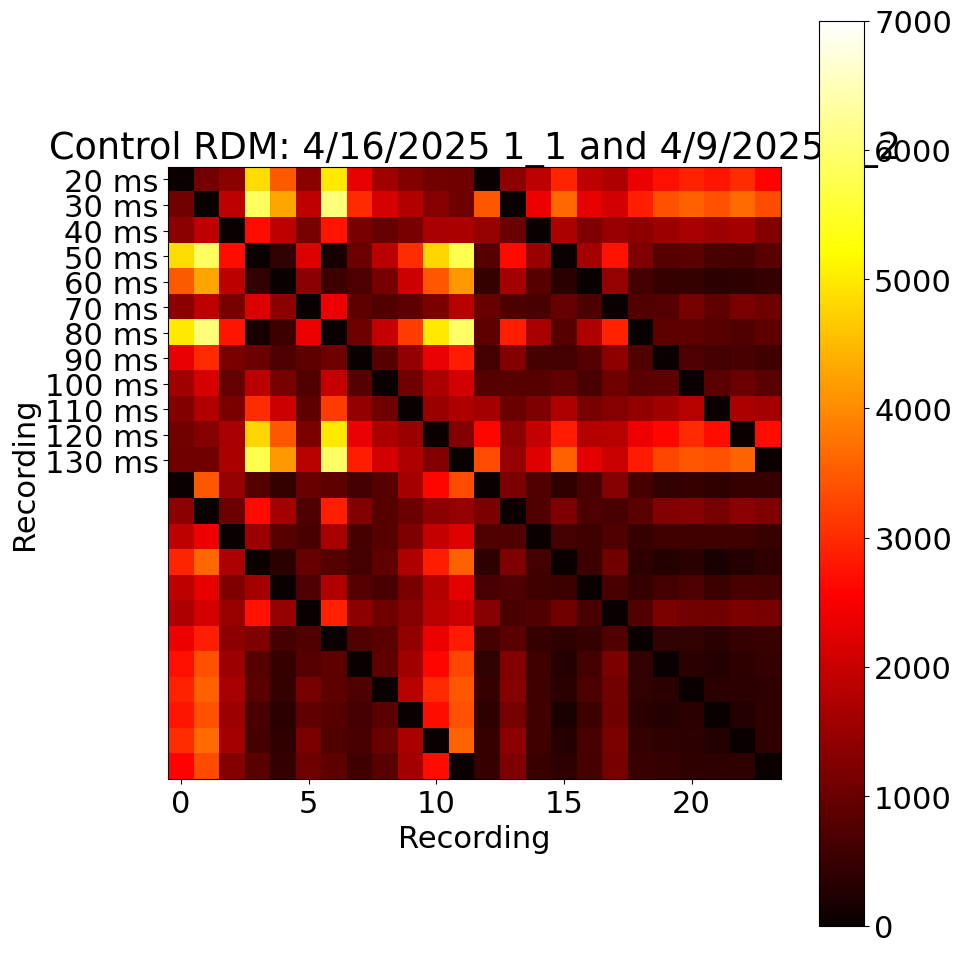

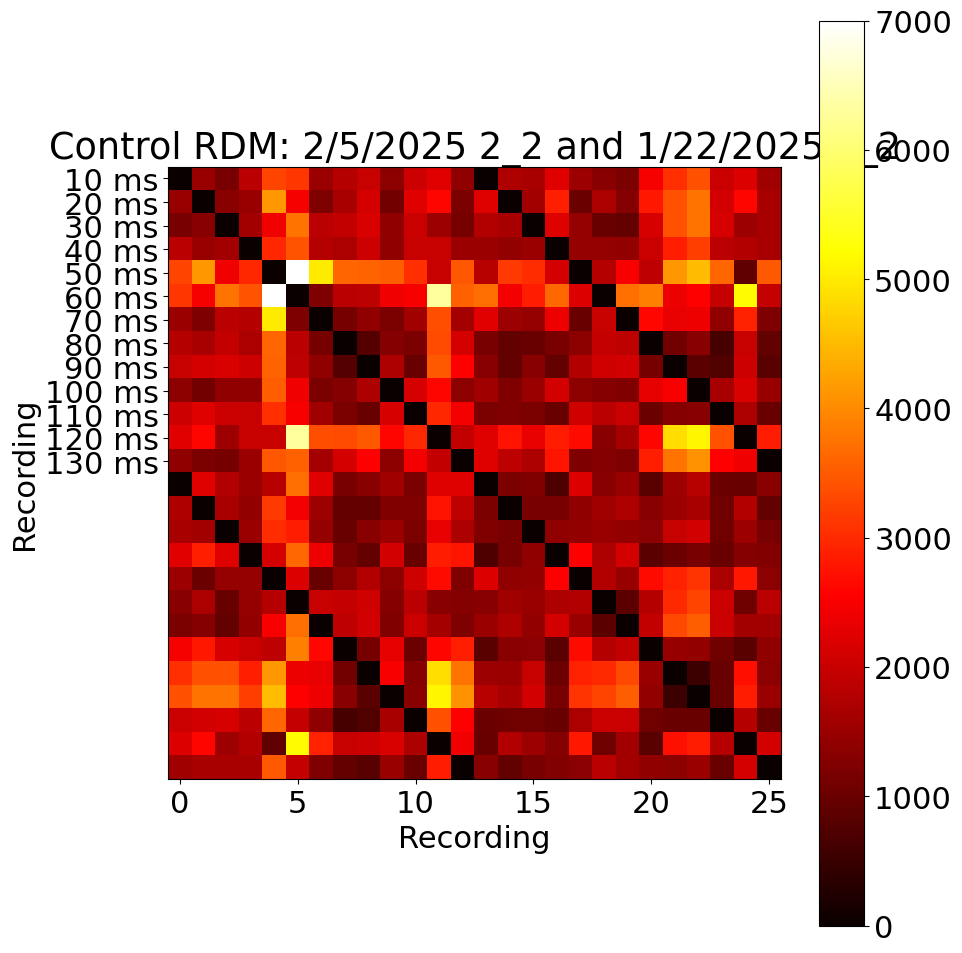

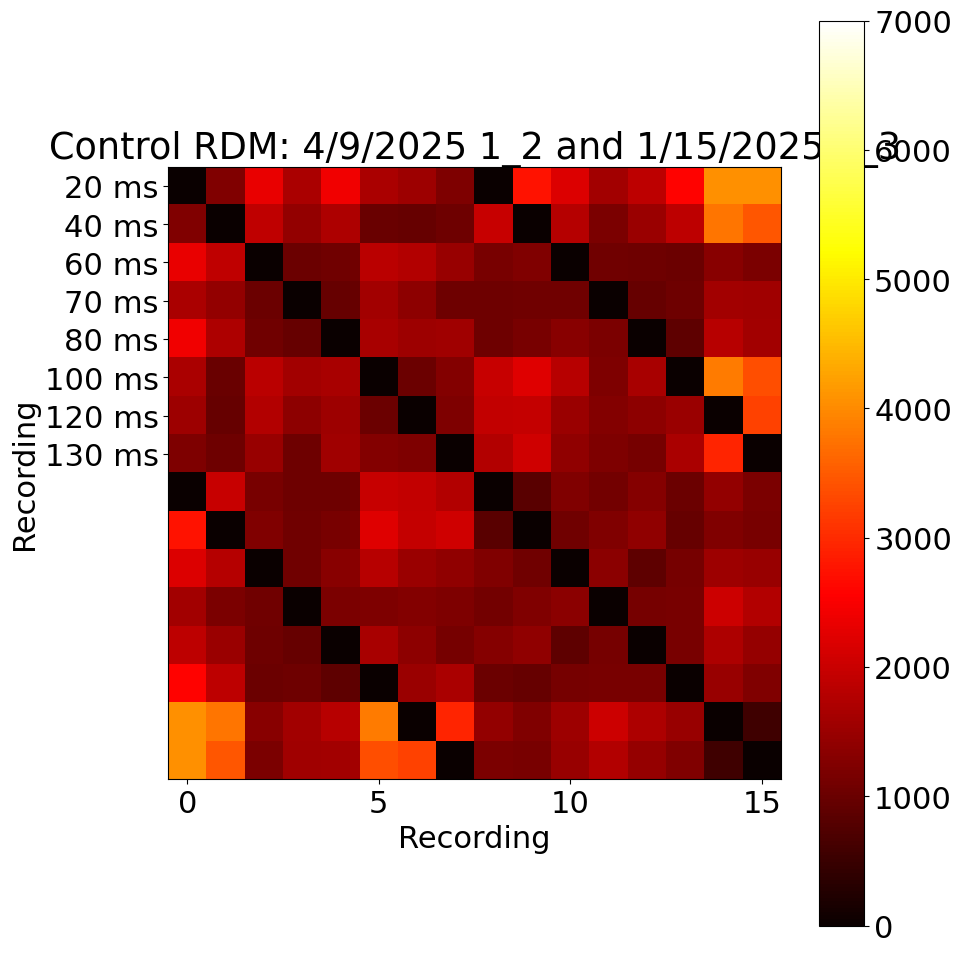

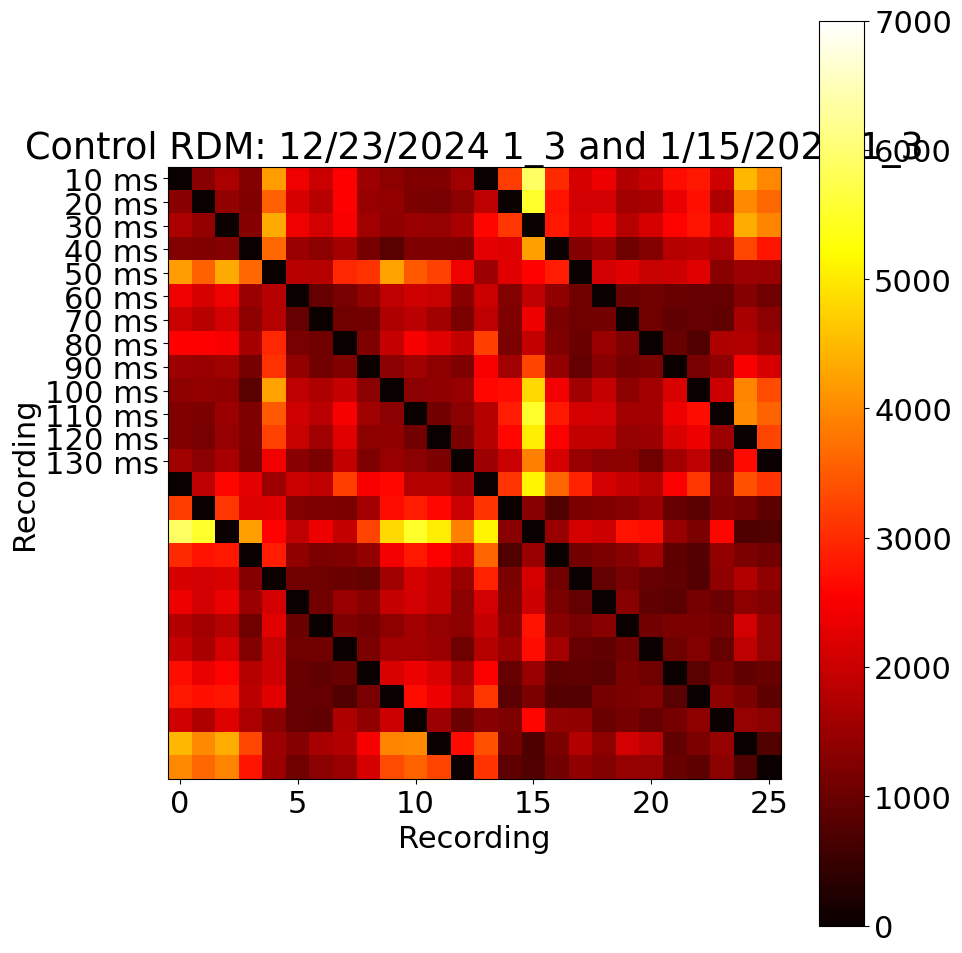

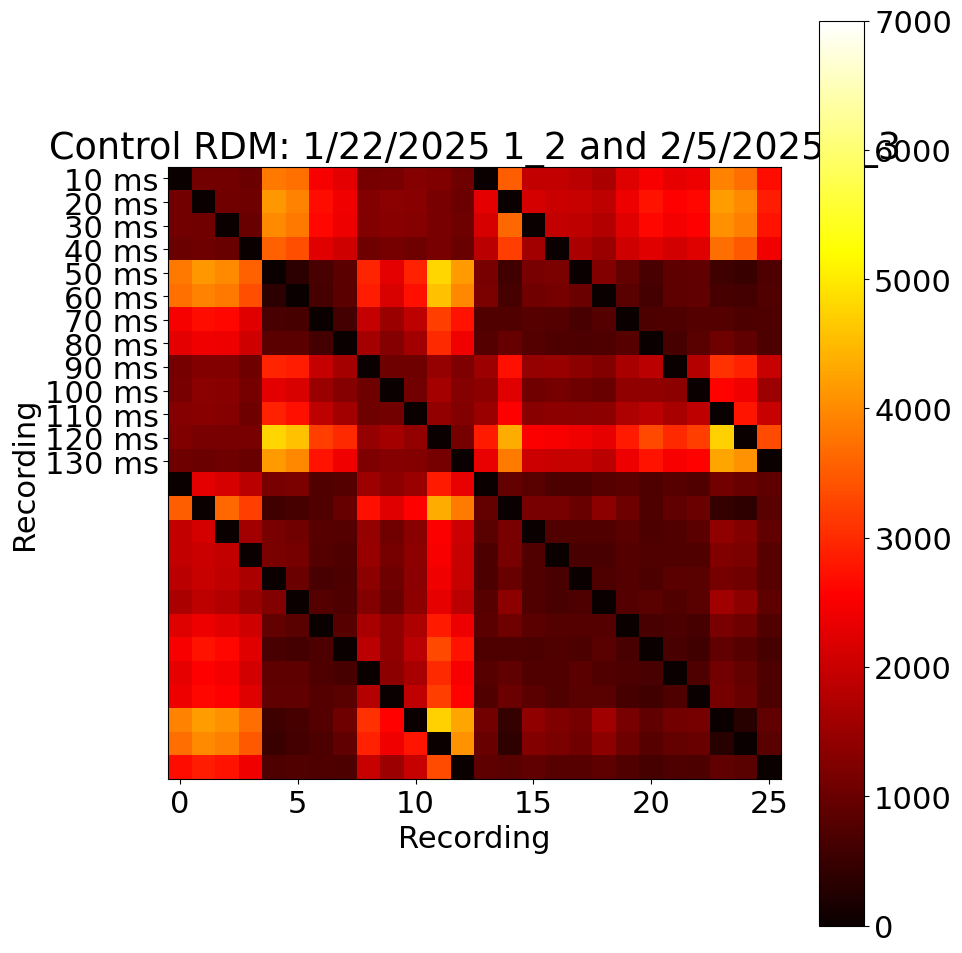

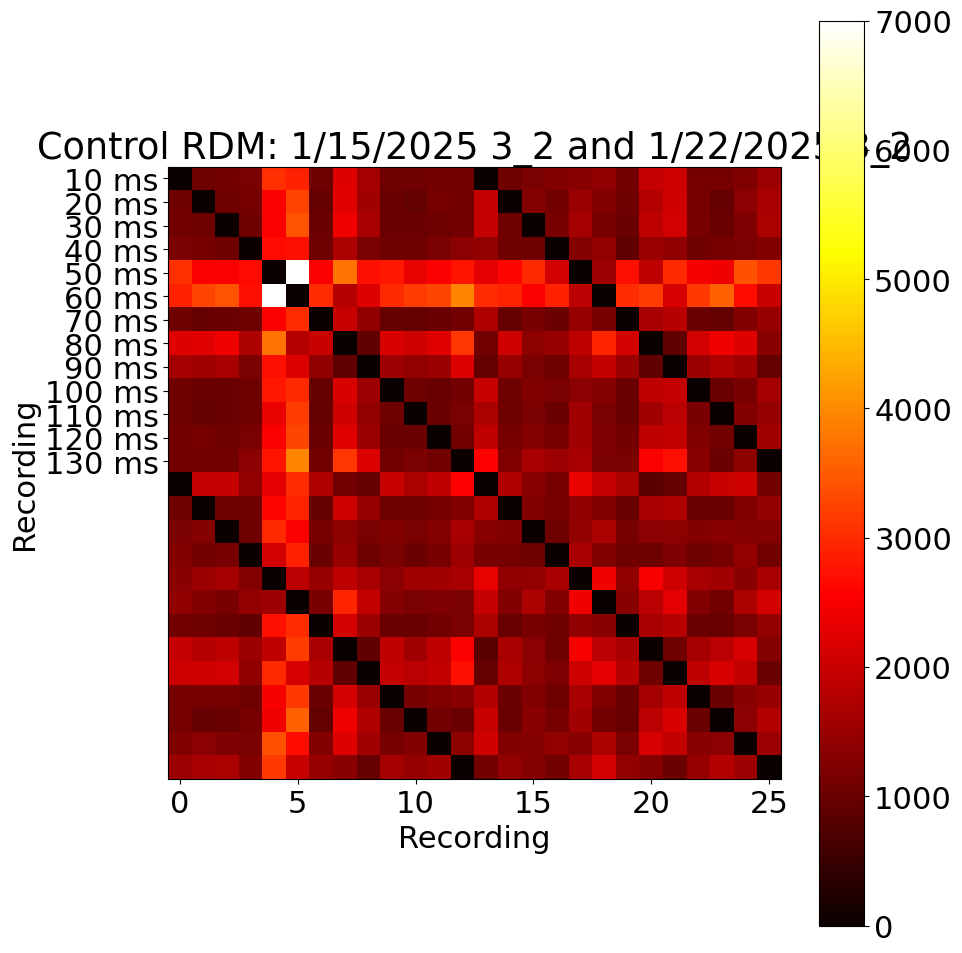

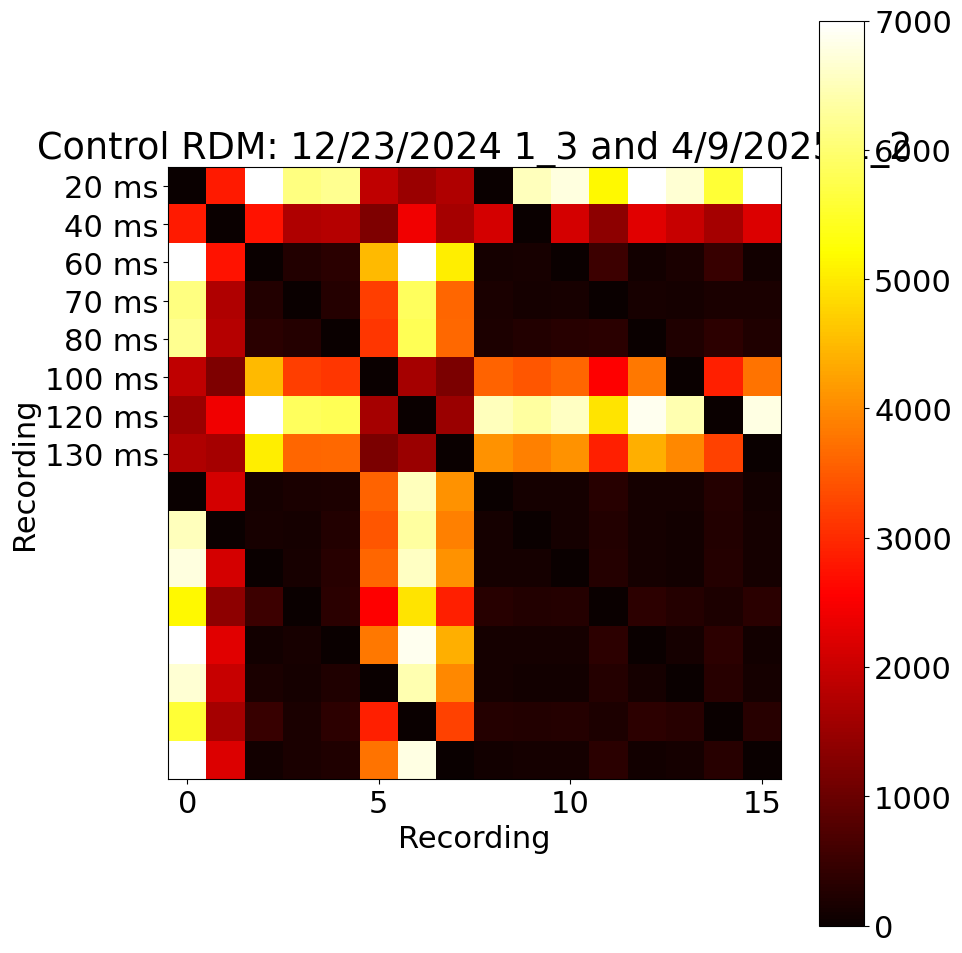

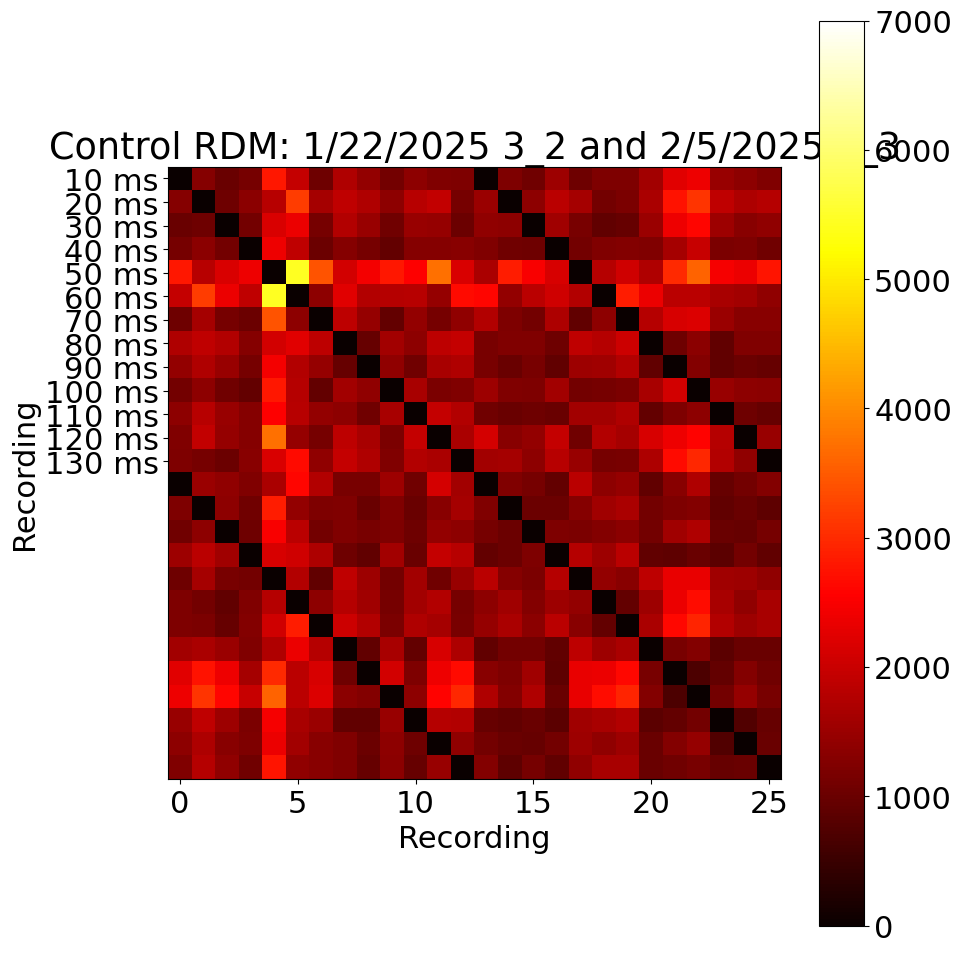

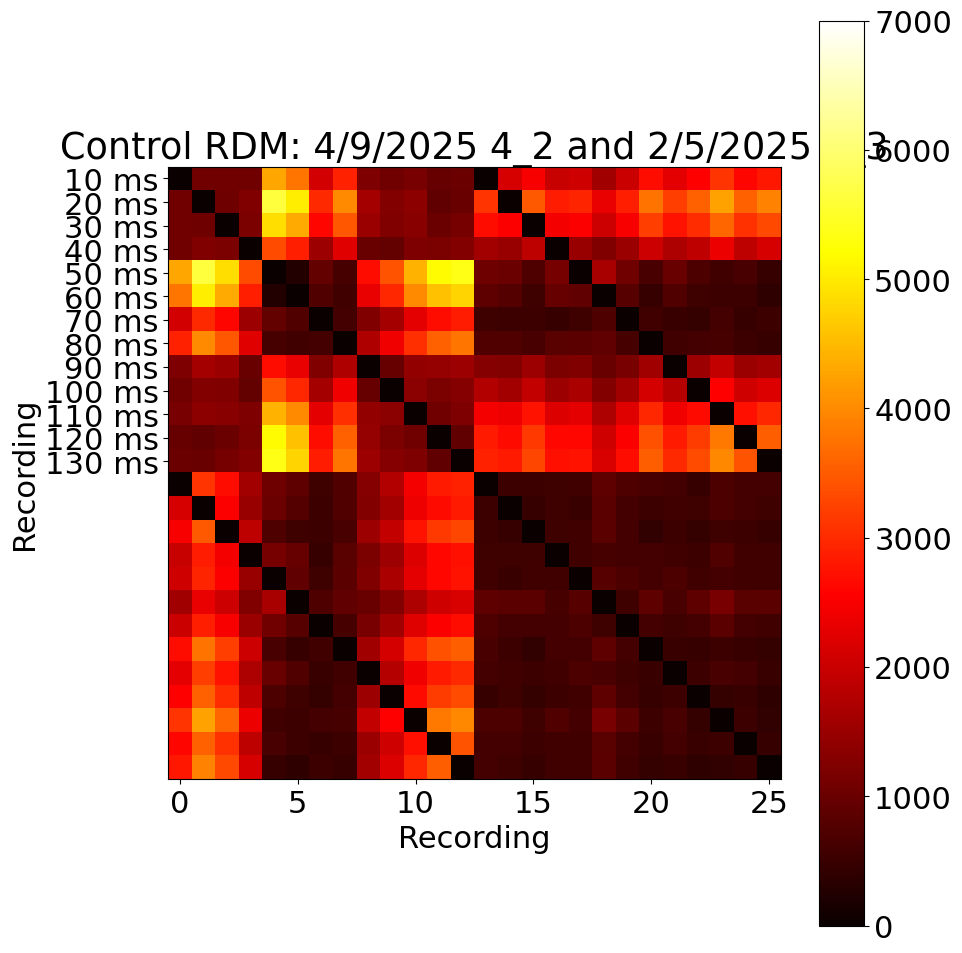

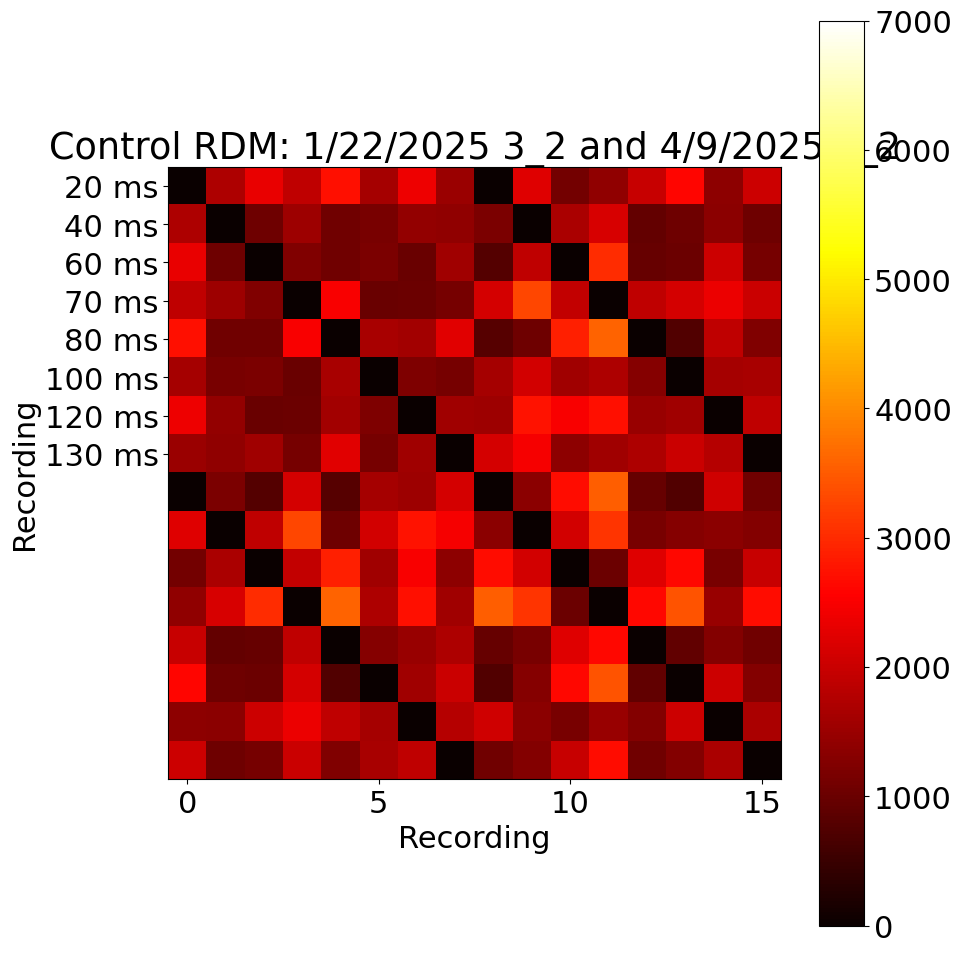

In [32]:
# Control FCMs: use 2 barrels of same IPI and is_single_pulse_control,
# but different date, slice, and/or location.
# choose several examples and create the FCM and histogram for each.
# use the stored examples in trace_sets_dict to create the control examples.
control_rdm_distances = []
num_control_examples = 10
max_rows = 12
while num_control_examples > 0:
    # choose a random date, slice, and location from the trace_sets_dict
    date1 = random.choice(list(trace_sets_dict.keys()))
    slic_loc_id1 = random.choice(list(trace_sets_dict[date1].keys()))
    date2 = random.choice(list(trace_sets_dict.keys()))
    slic_loc_id2 = random.choice(list(trace_sets_dict[date2].keys()))

    # ensure they are not the same date, slice, and location
    while slic_loc_id1 == slic_loc_id2 and date1 == date2:
        date2 = random.choice(list(trace_sets_dict.keys()))
        slic_loc_id2 = random.choice(list(trace_sets_dict[date2].keys()))

    ipi_choices = list(trace_sets_dict[date1][slic_loc_id1].keys())
    ipi_choices = list(set(ipi_choices) & set(trace_sets_dict[date2][slic_loc_id2].keys()))
    if len(ipi_choices) == 0:
        print("No IPI choices for this date/slice/location pair")
        continue
    n_ipis = len(ipi_choices)
    fig, ax = plt.subplots(min(max_rows, n_ipis * 2), 3, figsize=(30, 10 * min(max_rows, n_ipis * 2)))
    i_ipi = -1
    control_corr_matrices = {}
    for ipi in ipi_choices:
        i_ipi += 1

        pulses_choices = list(trace_sets_dict[date1][slic_loc_id1][ipi].keys())
        pulses_choices = list(set(pulses_choices) &
            set(trace_sets_dict[date2][slic_loc_id2][ipi].keys()))
                
        try:
            barrels1 = trace_sets_dict[date1][slic_loc_id1][ipi][0]
            barrels2 = trace_sets_dict[date2][slic_loc_id2][ipi][0]
            traces1 = barrels1[1]
            traces2 = barrels2[1]
        except KeyError:
            print("one of the date/slice/locations does not have the IPI/pulse_number requested")
            #print(f"Date1: {date1}, SlicLoc1: {slic_loc_id1}, IPI: {ipi}", 
            #      trace_sets_dict[date1][slic_loc_id1][ipi])
            #print(f"Date2: {date2}, SlicLoc2: {slic_loc_id2}, IPI: {ipi}", 
            #      trace_sets_dict[date2][slic_loc_id2][ipi])

            continue

        for pulse_number in [0, 1]:

            i_plot = 2 * i_ipi + pulse_number


            # create the functional connectivity matrix
            m_window = m_windows[pulse_number] 
            fc = FunctionalConnectivityMatrix(measure_windows=[m_window])
            static_matrix = fc.compute_correlation(traces1[:100], traces2[:100],
                                        method='pearson', plot_rate=0.000, lag=optimal_lag)

            # store correlation matrix in the corr_matrices dict
            if ipi not in control_corr_matrices:
                control_corr_matrices[ipi] = {}
            control_corr_matrices[ipi][pulse_number] = static_matrix

            print("Static matrix shape: ", static_matrix.shape)

            # visualize the static matrix
            # make 2 subplots
            
            if i_plot < max_rows:
                ax[i_plot][0].imshow(static_matrix, cmap='hot', interpolation='nearest',
                    vmin=0, vmax=1)

                ax[i_plot][1].set_title(f"Control FC: {date1} {slic_loc_id1} Neighbor Barrel and "
                            f"{date2} {slic_loc_id2} Neighbor Barrel " + (f" for IPI {ipi} ms " if pulse_number == 0 else ""))

                
                # in the other subplot, show histogram of strengths of the connections
                ax[i_plot][1].hist(static_matrix.flatten(), bins=100, color='blue', alpha=0.5)
                ax[i_plot][1].set_xlabel('Correlation')
            
                # show random trace pairs (one from each barrel)
                '''baseline = 0
                for k in range(5):
                    i_rand = random.randint(0, len(traces1) - 1)
                    j_rand = random.randint(0, len(traces2) - 1)
                    ax[i_plot][2].plot(traces1[i_rand] + baseline, color='blue', alpha=0.5)
                    ax[i_plot][2].plot(traces2[j_rand] + baseline, color='red', alpha=0.5)
                    
                    # annotate the plot with the correlation value near the baseline value
                    # get the correlation value from the static_matrix
                    # the correlation value is the value at (i_rand, j_rand) in the static_matrix
                    corr = static_matrix[i_rand, j_rand]
                    ax[i_plot][2].annotate(f"Corr: {corr:.2f}", 
                                xy=(0, baseline), 
                                xytext=(0, baseline + 0.5),
                                arrowprops=dict(facecolor='black', shrink=0.05),
                                fontsize=12)
                    baseline += max(traces1[i_rand].max(), traces2[j_rand].max()) * 1.1'''
            
    if len(control_corr_matrices.keys()) == 0:
        print("No correlation matrices found")
        plt.close(fig)
        continue
    plt.savefig(f"{output_fig_dir}/{slic_loc_id}_"
                f"static_fc_control-xcorr_intrabarrel_pulse2.png")
    #plt.show()
    plt.close(fig)

    # compute RDM for the control examples
    # The RDM is a square matrix of size n x n, where n is the number of pairs of (ipi, is_single_pulse_control).
    # The first n/2 values are the (ipi1, is_single_pulse_control1) values for which is_single_pulse_control == 0,
    # and the second n/2 values are the (ipi2, is_single_pulse_control2) values for which is_single_pulse_control == 1.
    # The RDM is a square matrix of size n x n, where n is the number of pairs of (ipi, is_single_pulse_control).
    # The first n/2 values are the (ipi1, is_single_pulse_control1) values for which is_single_pulse_control == 0,
    # and the second n/2 values are the (ipi2, is_single_pulse_control2) values for which is_single_pulse_control == 1.
    ipi_list = list(control_corr_matrices.keys())
    ipi_list.sort()
    rdm = np.zeros((len(ipi_list)*2, len(ipi_list)*2))

    for i_ipi in range(len(ipi_list)):
        ipi = ipi_list[i_ipi]
        for pulse_number in control_corr_matrices[ipi].keys():
            i_rdm = i_ipi + (len(ipi_list) * pulse_number)
            fc1 = control_corr_matrices[ipi][pulse_number]

            for j_ipi in range(i_ipi + 1, len(ipi_list)):
                ipi2 = ipi_list[j_ipi]
                for pulse_number2 in control_corr_matrices[ipi2].keys():
                    j_rdm = j_ipi + (len(ipi_list) * pulse_number2)
                    fc2 = control_corr_matrices[ipi2][pulse_number2]

                    # calculate the dissimilarity between the two matrices (sum of squared differences)
                    print(i_rdm, j_rdm, "IPI:", ipi, "Pulse:", pulse_number,)
                    rdm[i_rdm][j_rdm] = np.sum((fc1 - fc2) ** 2)
                    rdm[j_rdm][i_rdm] = rdm[i_rdm][j_rdm]
    # show the RDM as a heatmap
    fig, ax = plt.subplots(figsize=(10, 10))
    plt.imshow(rdm, cmap='hot', interpolation='nearest', vmin=0, vmax=7000)
    plt.colorbar()
    plt.title(f"Control RDM: {date1} {slic_loc_id1} and {date2} {slic_loc_id2}")

    # label IPIs ticks where is_single_pulse_control == 0
    #plt.xticks(np.arange(len(ipi_list)), 
    #            [f"{ipi} ms" for ipi in ipi_list], rotation=45)
    plt.yticks(np.arange(len(ipi_list)),
                [f"{ipi} ms" for ipi in ipi_list])
    plt.xlabel('Recording')
    plt.ylabel('Recording')
    plt.title(f"Control RDM: {date1} {slic_loc_id1} and {date2} {slic_loc_id2}")
    plt.tight_layout()
    formatted_date1 = date1.replace('/', '-')
    formatted_date2 = date2.replace('/', '-')
    plt.savefig(f"{output_fig_dir}/{formatted_date1}_{slic_loc_id1}_{formatted_date2}_{slic_loc_id2}_"
                f"rdm_control-xcorr_intrabarrel_pulse2.png")
    #plt.show()
    control_rdm_distances.append(np.sum(rdm))
    num_control_examples -= 1

# save control_rdm_distances to a pickle file
with open(f"{output_fig_dir}/control_rdm_distances_intrabarrel_pulse2.pkl", 'wb') as f:
    pickle.dump(control_rdm_distances, f)

In [9]:
# pull from pickle file
with open(f"{output_fig_dir}/control_rdm_distances_intrabarrel.pkl", 'rb') as f:
    control_rdm_distances = pickle.load(f)

t-statistic: -2.7922015677851335, p-value: 0.010918831374863363
The two groups are significantly different


C:\Users\jjudge3\AppData\Local\Temp\ipykernel_15808\3382501338.py:29: MatplotlibDeprecationWarning: Passing the minor parameter of set_ticks() positionally is deprecated since Matplotlib 3.2; the parameter will become keyword-only two minor releases later.
  ax.set_xticks([0, 1], ['Data', 'Control'])


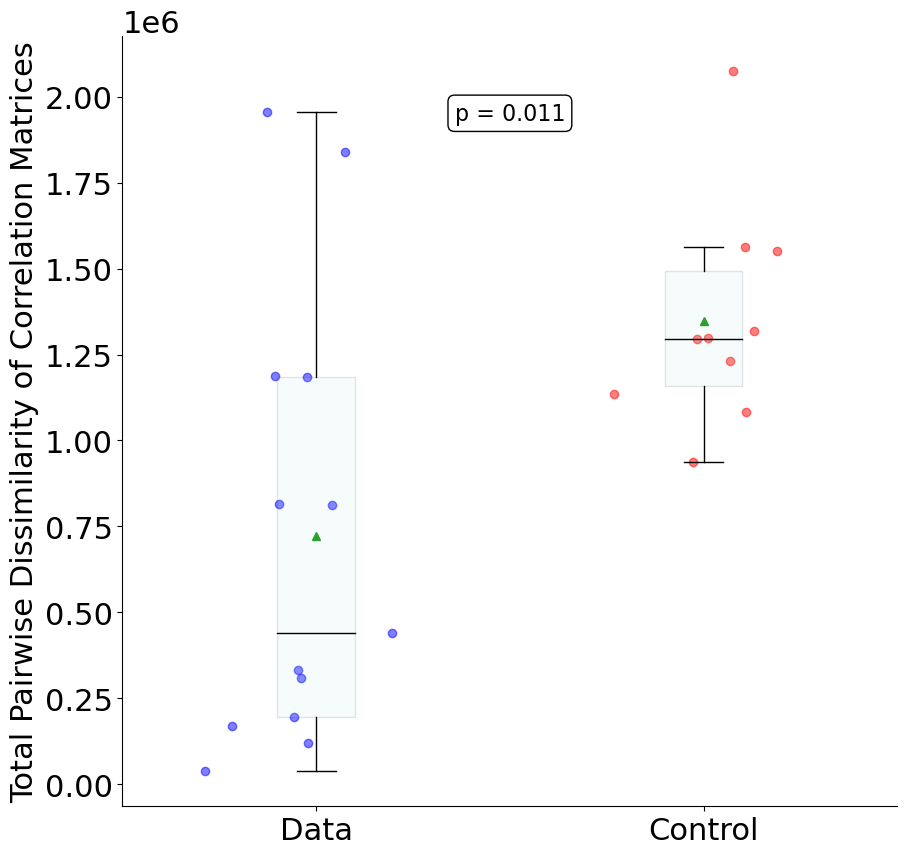

In [10]:
# scatter plot of the total_rdm_distances and control_rdm_distances
fig, ax = plt.subplots(figsize=(10, 10))


# add box and whisker plot for each group
# make boxplot transparent
ax.boxplot([total_rdm_distances[optimal_lag][1], control_rdm_distances], 
            positions=[0, 1], widths=0.2, patch_artist=True,
            boxprops=dict(facecolor='lightblue', alpha=0.1),
            showfliers=False,
            medianprops=dict(color='black'), showmeans=True)
            
x_jitter = np.random.normal(0, 0.1, len(total_rdm_distances[optimal_lag][1]))
x_jitter2 = np.random.normal(0, 0.1, len(control_rdm_distances)) + 1
ax.scatter(x_jitter, total_rdm_distances[optimal_lag][1], color='blue', alpha=0.5, label='Data')
ax.scatter(x_jitter2, control_rdm_distances, color='red', alpha=0.5, label='Control (scrambled)')

# use ttest_ind to compare the two groups
t_stat, p_val = ttest_ind(total_rdm_distances[optimal_lag][1], control_rdm_distances)
print(f"t-statistic: {t_stat}, p-value: {p_val}")
if p_val < 0.05:
    print("The two groups are significantly different")
    # mark the p-value on the plot
    ax.annotate(f"p = {p_val:.3f}", xy=(0.5, 0.9), xycoords='axes fraction',
                fontsize=16, ha='center', va='center', color='black',
                bbox=dict(boxstyle="round,pad=0.3", edgecolor='black', facecolor='white'))

ax.set_xlim(-0.5, 1.5)
ax.set_xticks([0, 1], ['Data', 'Control'])
ax.set_xticklabels(['Data', 'Control'])

# turn of spines
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

ax.set_ylabel('Total Pairwise Dissimilarity of Correlation Matrices')
plt.savefig(f"{output_fig_dir}/total_rdm_distances_lag_{optimal_lag}_intrabarrel_pulse2.png")
plt.show()
plt.close(fig)

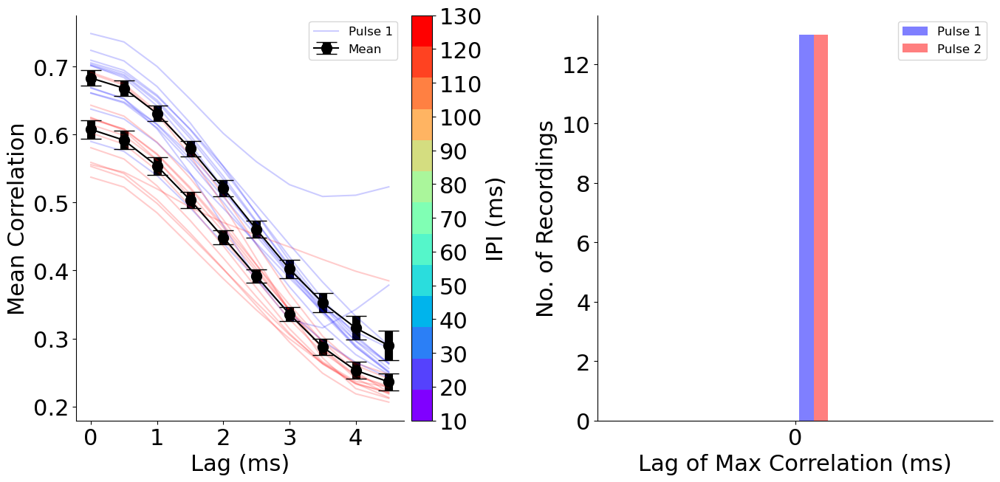

In [37]:
# use corr_matrices[ipi][control_or_ppr_type][lag] to plot mean correlation for each lag
# each (ipi, control_or_ppr_type) pair is a different color
# do not use total_rdm_distances[lag] for this plot, but rather the mean of the correlation matrices

# 2 subplots
fig, ax = plt.subplots(1, 2, figsize=(14, 7))

ipi_colors = cm.rainbow(np.linspace(0, 1, len(corr_matrices.keys())))
ipis_sorted = list(corr_matrices.keys())
ipis_sorted.sort()
ipi_color_map = {ipi: ipi_colors[i] for i, ipi in enumerate(ipis_sorted)}

lags_of_max_corr = {0: [], 1: []}
lags_of_max_corr_single = {0: [], 1: []}
avg_corr_trace = {0: [], 1: []}
for ipi in corr_matrices.keys():
    for pulse_number in corr_matrices[ipi].keys():
        for i in range(len(corr_matrices[ipi][pulse_number][0])):
                if skip_home_barrel and i == 0:
                    continue
                
                mean_corr = [np.mean(np.abs(corr_matrices[ipi][pulse_number][lag][i]))
                                for lag in lags]

                # get the lag with the maximum correlation value
                i_max_corr = np.argmax(mean_corr)
                lags_of_max_corr[pulse_number].append(lags[i_max_corr])

                lags_of_max_corr_single[pulse_number].append(lags[i_max_corr])

                # plot the mean correlation for each lag
                ipi_color = ipi_color_map[ipi]
                color = 'blue' if pulse_number == 0 else 'red'
                ax[0].plot(lags, mean_corr, label=
                        'Pulse 1' if pulse_number == 0 else  "Pulse 2", color=color, alpha=0.2)
                mean_corr = np.array(mean_corr).reshape(-1, len(lags))
                for i_corr in range(mean_corr.shape[0]):
                        mean_corr_single = mean_corr[i_corr, :].reshape(1, -1)
                        avg_corr_trace[pulse_number].append(mean_corr_single)
        
# plot the mean correlation for each lag with error bars
for pulse_number in [0, 1]:
        avg_corr_t = np.concatenate(avg_corr_trace[pulse_number], axis=0)
        ax[0].errorbar(lags, np.mean(avg_corr_t, axis=0), yerr=sem(avg_corr_t, axis=0),
                capsize=10, elinewidth=8, marker='o', markersize=10, label=f"Mean", color='black',)

# legend only shows the first entry
handles = [h for i, h in enumerate(ax[0].get_legend_handles_labels()[0]) if i % 2 == 0]
labels = [l for i, l in enumerate(ax[0].get_legend_handles_labels()[1]) if i % 2 == 0]
ax[0].legend(handles=handles[1:2] + [handles[-1]],
            labels=labels[1:2] + [labels[-1]],
            loc='upper right', fontsize=12)

# add a color bar to the plot
# create a colormap from the ipi_color_map
cmap = cm.get_cmap('rainbow', len(ipis_sorted))
norm = plt.Normalize(0, len(ipis_sorted) - 1)
cbar = plt.colorbar(cm.ScalarMappable(cmap=cmap, norm=norm),
                ticks=range(len(ipis_sorted)),
                #ticks=ipis_sorted,
                label='IPI (ms)',
                orientation='vertical',
                pad=0.02,
                ax=ax[0])
cbar.ax.set_yticklabels(ipis_sorted)

# turn of spines
for i in range(2):
        ax[i].spines['top'].set_visible(False)
        ax[i].spines['right'].set_visible(False)

        ax[i].set_xticks([i for i in range(0, max_lag//2 * 2, 2)])
        ax[i].set_xticklabels([str(i) for i in range(0, max_lag // 2)])

ax[0].set_xlabel('Lag (ms)')
ax[1].set_xlabel('Lag of Max Correlation (ms)')


ax[0].set_xlabel('Lag (ms)')
ax[0].set_ylabel('Mean Correlation')


# right subplot is a histogram of lag_ofmax_corr
ax[1].hist([lags_of_max_corr[0], lags_of_max_corr[1]], bins=max_lag, color=['blue', 'red'], alpha=0.5, label=["Pulse 1", "Pulse 2"])

ax[1].legend(loc='upper right', fontsize=12)

ax[1].set_ylabel('No. of Recordings')

plt.tight_layout()
#ax.legend()
plt.savefig(f"{output_fig_dir}/mean_correlation_lags_intrabarrel_pulse2.png")
plt.show()



No corr_matrices_by_slice for this date
No corr_matrices_by_slice for this date
No corr_matrices_by_slice for this date
No corr_matrices_by_slice for this date
No corr_matrices_by_slice for this date
No corr_matrices_by_slice for this date
Date:  12/23/2024 Slice:  1 Location:  3
Avg corr shape:  (13, 100, 100)
Avg corr shape:  (13, 100, 100)
{0: array([[1.        , 0.83515893, 0.92479989, ..., 0.94613952, 0.93869348,
        0.84468092],
       [0.83515893, 1.        , 0.85706666, ..., 0.84544718, 0.83585612,
        0.87696519],
       [0.92479989, 0.85706666, 1.        , ..., 0.91887453, 0.94393321,
        0.85983148],
       ...,
       [0.94613952, 0.84544718, 0.91887453, ..., 1.        , 0.91340715,
        0.8497979 ],
       [0.93869348, 0.83585612, 0.94393321, ..., 0.91340715, 1.        ,
        0.8542682 ],
       [0.84468092, 0.87696519, 0.85983148, ..., 0.8497979 , 0.8542682 ,
        1.        ]]), 1: array([[1.        , 0.79065323, 0.88271917, ..., 0.93840964, 0.8877153

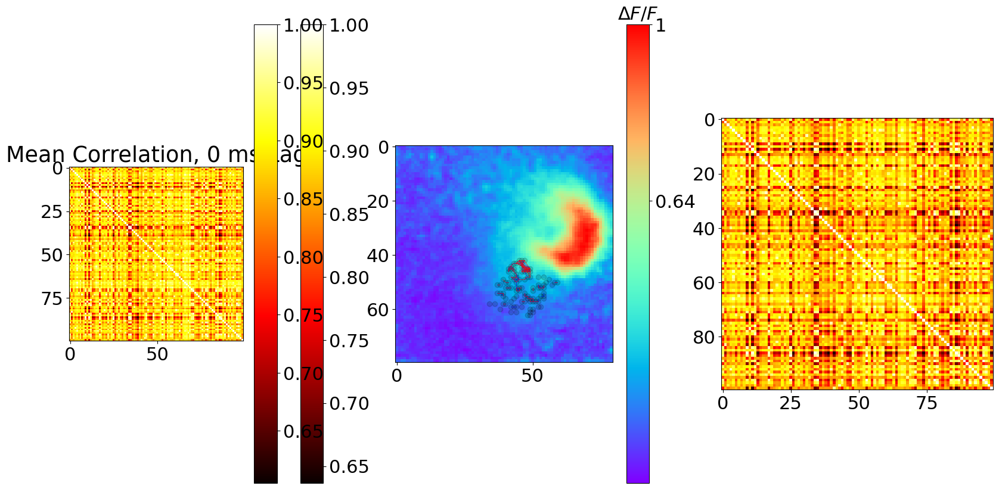

Date:  12/23/2024 Slice:  2 Location:  2
Avg corr shape:  (13, 100, 100)
Avg corr shape:  (13, 100, 100)
{0: array([[1.        , 0.47558875, 0.49068885, ..., 0.52777586, 0.77862062,
        0.53703749],
       [0.47558875, 1.        , 0.87640248, ..., 0.45895615, 0.45287766,
        0.60397454],
       [0.49068885, 0.87640248, 1.        , ..., 0.46347024, 0.43407425,
        0.61721583],
       ...,
       [0.52777586, 0.45895615, 0.46347024, ..., 1.        , 0.54160461,
        0.51025769],
       [0.77862062, 0.45287766, 0.43407425, ..., 0.54160461, 1.        ,
        0.52975205],
       [0.53703749, 0.60397454, 0.61721583, ..., 0.51025769, 0.52975205,
        1.        ]]), 1: array([[1.        , 0.44598505, 0.46594754, ..., 0.40312729, 0.70200559,
        0.47939436],
       [0.44598505, 1.        , 0.79102106, ..., 0.47374898, 0.4455248 ,
        0.49960385],
       [0.46594754, 0.79102106, 1.        , ..., 0.43823283, 0.45210756,
        0.52577902],
       ...,
       [0.403127

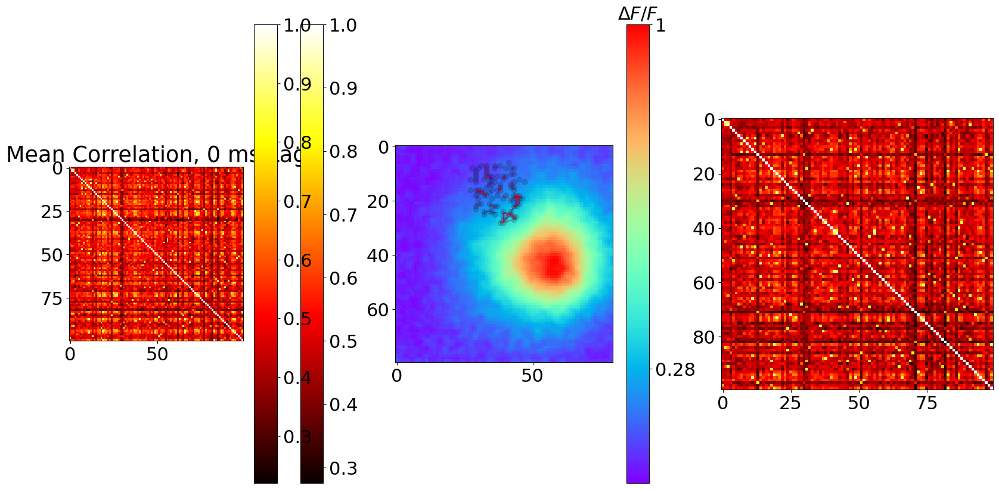

Date:  1/15/2025 Slice:  1 Location:  3
Avg corr shape:  (13, 100, 100)
Avg corr shape:  (13, 100, 100)
{0: array([[1.        , 0.33133678, 0.16360791, ..., 0.18181922, 0.11506629,
        0.47154094],
       [0.33133678, 1.        , 0.27454711, ..., 0.22900235, 0.18829492,
        0.30445302],
       [0.16360791, 0.27454711, 1.        , ..., 0.21884291, 0.41281449,
        0.27409952],
       ...,
       [0.18181922, 0.22900235, 0.21884291, ..., 1.        , 0.32711334,
        0.25232421],
       [0.11506629, 0.18829492, 0.41281449, ..., 0.32711334, 1.        ,
        0.23304654],
       [0.47154094, 0.30445302, 0.27409952, ..., 0.25232421, 0.23304654,
        1.        ]]), 1: array([[1.        , 0.22967928, 0.17206109, ..., 0.16256965, 0.13625692,
        0.51264965],
       [0.22967928, 1.        , 0.1613515 , ..., 0.16817259, 0.11543794,
        0.27182174],
       [0.17206109, 0.1613515 , 1.        , ..., 0.33466341, 0.49245537,
        0.29646392],
       ...,
       [0.1625696

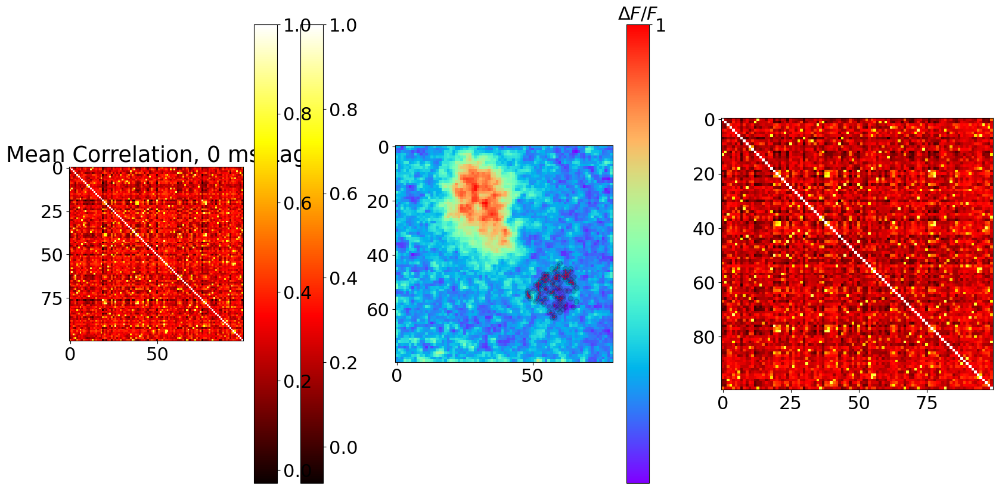

Date:  1/15/2025 Slice:  3 Location:  2
Avg corr shape:  (13, 100, 100)
Avg corr shape:  (13, 100, 100)
{0: array([[1.        , 0.54034281, 0.34503098, ..., 0.47287181, 0.56018615,
        0.43686607],
       [0.54034281, 1.        , 0.26252623, ..., 0.32817403, 0.44776161,
        0.39361552],
       [0.34503098, 0.26252623, 1.        , ..., 0.62684646, 0.49110033,
        0.75227211],
       ...,
       [0.47287181, 0.32817403, 0.62684646, ..., 1.        , 0.50083828,
        0.60958387],
       [0.56018615, 0.44776161, 0.49110033, ..., 0.50083828, 1.        ,
        0.49037859],
       [0.43686607, 0.39361552, 0.75227211, ..., 0.60958387, 0.49037859,
        1.        ]]), 1: array([[1.        , 0.41396817, 0.246999  , ..., 0.33338372, 0.32065005,
        0.27633933],
       [0.41396817, 1.        , 0.30612264, ..., 0.35075357, 0.29011369,
        0.35250995],
       [0.246999  , 0.30612264, 1.        , ..., 0.50248171, 0.45212752,
        0.72539074],
       ...,
       [0.3333837

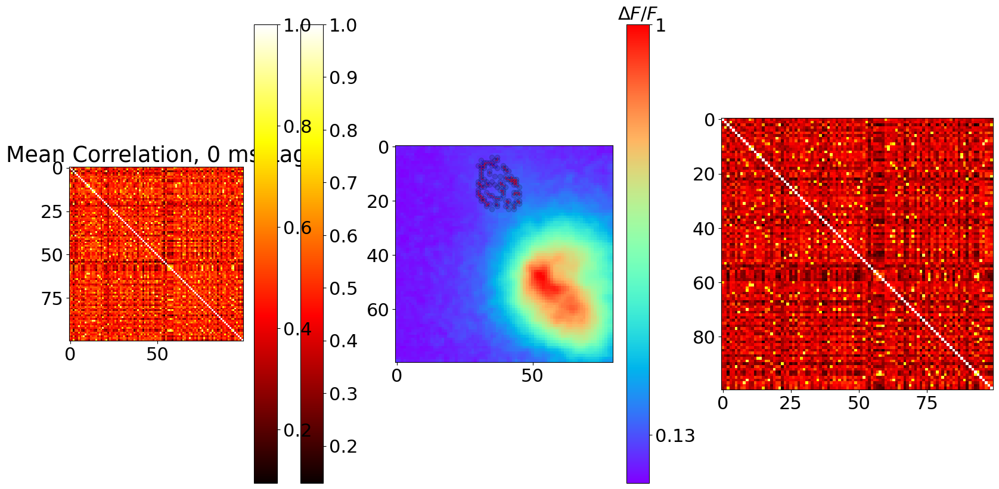

Date:  1/22/2025 Slice:  1 Location:  2
Avg corr shape:  (13, 100, 100)
Avg corr shape:  (13, 100, 100)
{0: array([[1.        , 0.44212256, 0.55409884, ..., 0.56593908, 0.50371264,
        0.53713266],
       [0.44212256, 1.        , 0.50484546, ..., 0.48649497, 0.38954853,
        0.46463417],
       [0.55409884, 0.50484546, 1.        , ..., 0.64432546, 0.56566498,
        0.61694229],
       ...,
       [0.56593908, 0.48649497, 0.64432546, ..., 1.        , 0.5049371 ,
        0.5592708 ],
       [0.50371264, 0.38954853, 0.56566498, ..., 0.5049371 , 1.        ,
        0.46850388],
       [0.53713266, 0.46463417, 0.61694229, ..., 0.5592708 , 0.46850388,
        1.        ]]), 1: array([[1.        , 0.41243328, 0.53173957, ..., 0.46653015, 0.49718448,
        0.46336408],
       [0.41243328, 1.        , 0.47567407, ..., 0.41982053, 0.46697308,
        0.40252457],
       [0.53173957, 0.47567407, 1.        , ..., 0.58813489, 0.60213615,
        0.51788105],
       ...,
       [0.4665301

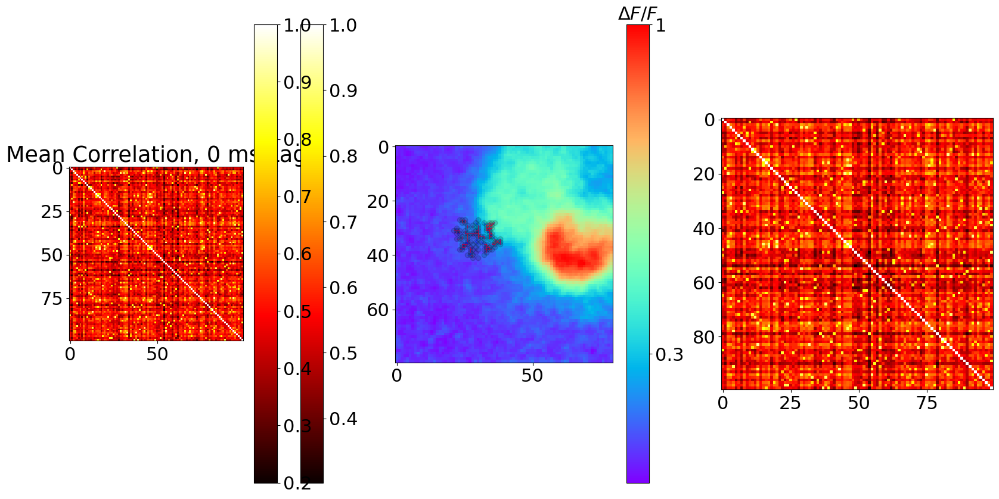

Date:  1/22/2025 Slice:  3 Location:  2
Avg corr shape:  (13, 100, 100)
Avg corr shape:  (13, 100, 100)
{0: array([[1.        , 0.51255518, 0.44162593, ..., 0.44381339, 0.54320902,
        0.46495787],
       [0.51255518, 1.        , 0.48553162, ..., 0.47809446, 0.58212946,
        0.42385014],
       [0.44162593, 0.48553162, 1.        , ..., 0.4037143 , 0.4859568 ,
        0.43221353],
       ...,
       [0.44381339, 0.47809446, 0.4037143 , ..., 1.        , 0.46192191,
        0.44116808],
       [0.54320902, 0.58212946, 0.4859568 , ..., 0.46192191, 1.        ,
        0.48167672],
       [0.46495787, 0.42385014, 0.43221353, ..., 0.44116808, 0.48167672,
        1.        ]]), 1: array([[1.        , 0.2313579 , 0.3139266 , ..., 0.32757112, 0.31640746,
        0.31078178],
       [0.2313579 , 1.        , 0.33548857, ..., 0.39738247, 0.40976481,
        0.18021681],
       [0.3139266 , 0.33548857, 1.        , ..., 0.32191358, 0.32327143,
        0.36292056],
       ...,
       [0.3275711

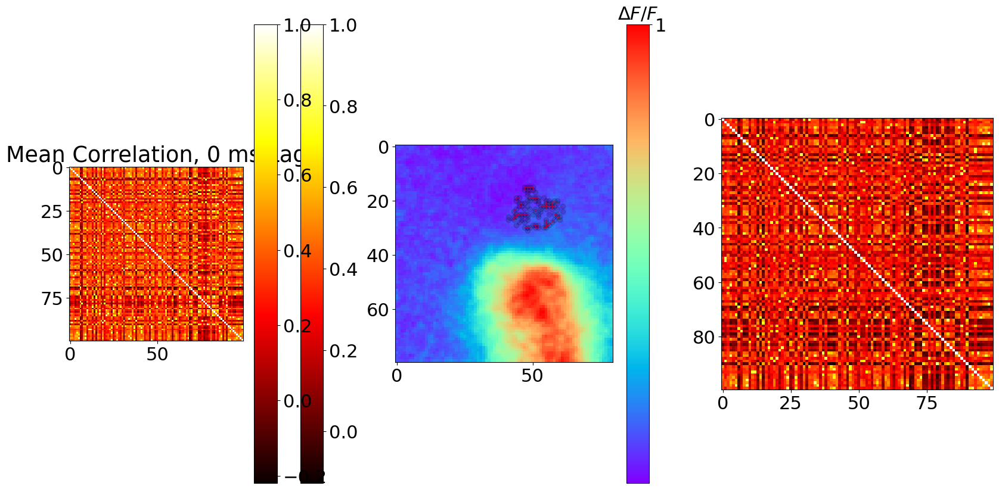

Date:  2/5/2025 Slice:  1 Location:  3
Avg corr shape:  (13, 100, 100)
Avg corr shape:  (13, 100, 100)
{0: array([[1.        , 0.59413077, 0.56403768, ..., 0.55915726, 0.56890945,
        0.62655729],
       [0.59413077, 1.        , 0.58853257, ..., 0.57331207, 0.62617706,
        0.61543381],
       [0.56403768, 0.58853257, 1.        , ..., 0.71722087, 0.51091347,
        0.53385797],
       ...,
       [0.55915726, 0.57331207, 0.71722087, ..., 1.        , 0.52525775,
        0.57227313],
       [0.56890945, 0.62617706, 0.51091347, ..., 0.52525775, 1.        ,
        0.64370534],
       [0.62655729, 0.61543381, 0.53385797, ..., 0.57227313, 0.64370534,
        1.        ]]), 1: array([[1.        , 0.46502285, 0.38105188, ..., 0.35296413, 0.45134307,
        0.50870531],
       [0.46502285, 1.        , 0.57264275, ..., 0.55948184, 0.58142757,
        0.51082533],
       [0.38105188, 0.57264275, 1.        , ..., 0.6591143 , 0.41431752,
        0.48996716],
       ...,
       [0.35296413

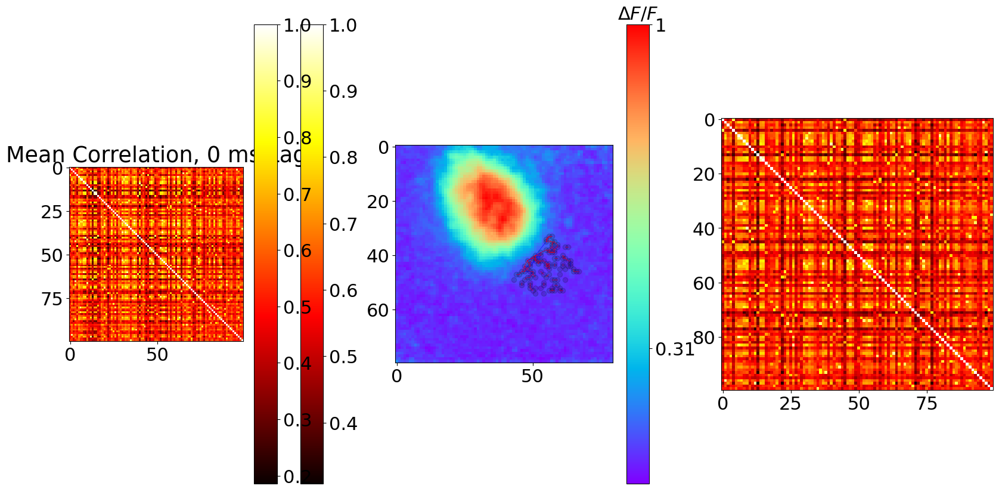

Date:  2/5/2025 Slice:  2 Location:  2
Avg corr shape:  (13, 100, 100)
Avg corr shape:  (13, 100, 100)
{0: array([[1.        , 0.85252799, 0.78198417, ..., 0.88521096, 0.86106562,
        0.81667193],
       [0.85252799, 1.        , 0.80607885, ..., 0.88083601, 0.87722184,
        0.82440664],
       [0.78198417, 0.80607885, 1.        , ..., 0.87411313, 0.88826523,
        0.91046882],
       ...,
       [0.88521096, 0.88083601, 0.87411313, ..., 1.        , 0.93712418,
        0.90141362],
       [0.86106562, 0.87722184, 0.88826523, ..., 0.93712418, 1.        ,
        0.91500509],
       [0.81667193, 0.82440664, 0.91046882, ..., 0.90141362, 0.91500509,
        1.        ]]), 1: array([[1.        , 0.77916811, 0.71245653, ..., 0.78422205, 0.80833131,
        0.76199162],
       [0.77916811, 1.        , 0.72675622, ..., 0.77911733, 0.78150424,
        0.77294183],
       [0.71245653, 0.72675622, 1.        , ..., 0.82372705, 0.83539849,
        0.87176962],
       ...,
       [0.78422205

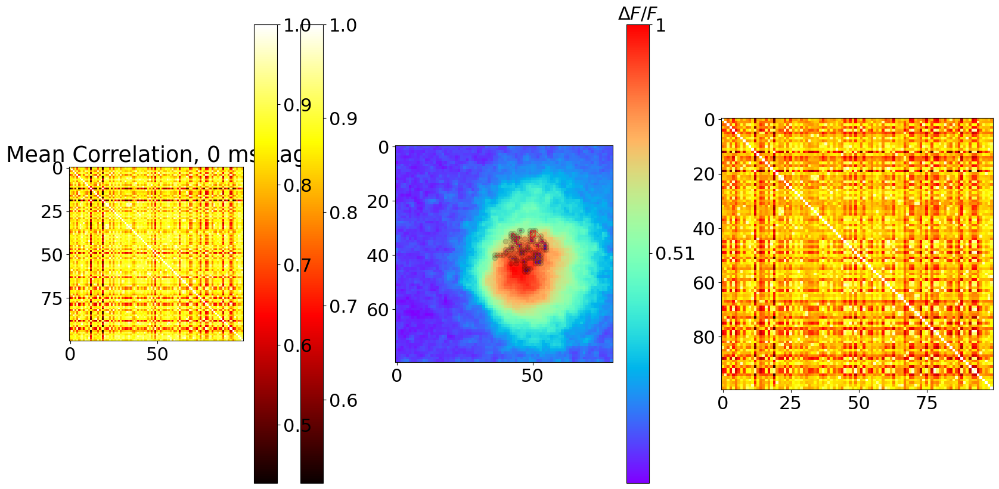

Date:  4/16/2025 Slice:  1 Location:  1
Avg corr shape:  (13, 100, 100)
Avg corr shape:  (13, 100, 100)
{0: array([[1.        , 0.8339873 , 0.84422735, ..., 0.82659917, 0.86741671,
        0.91812756],
       [0.8339873 , 1.        , 0.81465618, ..., 0.78183396, 0.81822827,
        0.84030826],
       [0.84422735, 0.81465618, 1.        , ..., 0.79926533, 0.82337921,
        0.85416595],
       ...,
       [0.82659917, 0.78183396, 0.79926533, ..., 1.        , 0.84762467,
        0.83049486],
       [0.86741671, 0.81822827, 0.82337921, ..., 0.84762467, 1.        ,
        0.87430265],
       [0.91812756, 0.84030826, 0.85416595, ..., 0.83049486, 0.87430265,
        1.        ]]), 1: array([[1.        , 0.71331392, 0.73688662, ..., 0.77729237, 0.78712792,
        0.88698943],
       [0.71331392, 1.        , 0.75882293, ..., 0.71550375, 0.72808482,
        0.76585347],
       [0.73688662, 0.75882293, 1.        , ..., 0.75399246, 0.76162552,
        0.7509684 ],
       ...,
       [0.7772923

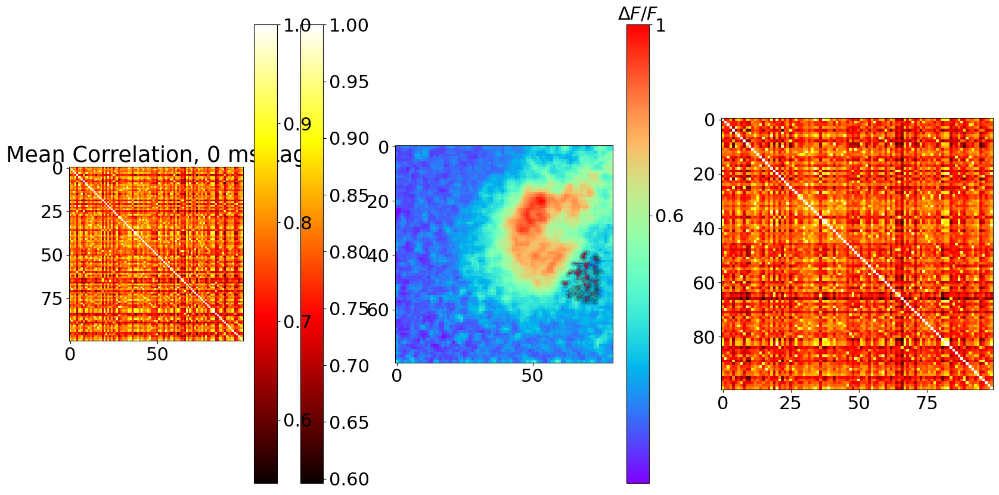

Date:  4/16/2025 Slice:  2 Location:  2
Avg corr shape:  (6, 100, 100)
Avg corr shape:  (6, 100, 100)
{0: array([[1.        , 0.8477918 , 0.87906137, ..., 0.82400382, 0.84910387,
        0.66813728],
       [0.8477918 , 1.        , 0.88774302, ..., 0.86436399, 0.88256626,
        0.69649886],
       [0.87906137, 0.88774302, 1.        , ..., 0.81592634, 0.88979286,
        0.69815106],
       ...,
       [0.82400382, 0.86436399, 0.81592634, ..., 1.        , 0.81020141,
        0.64132017],
       [0.84910387, 0.88256626, 0.88979286, ..., 0.81020141, 1.        ,
        0.70556748],
       [0.66813728, 0.69649886, 0.69815106, ..., 0.64132017, 0.70556748,
        1.        ]]), 1: array([[1.        , 0.76173844, 0.69441127, ..., 0.72644566, 0.76508308,
        0.59620807],
       [0.76173844, 1.        , 0.77328661, ..., 0.73596858, 0.84091938,
        0.62277149],
       [0.69441127, 0.77328661, 1.        , ..., 0.72805811, 0.81592517,
        0.67244878],
       ...,
       [0.72644566,

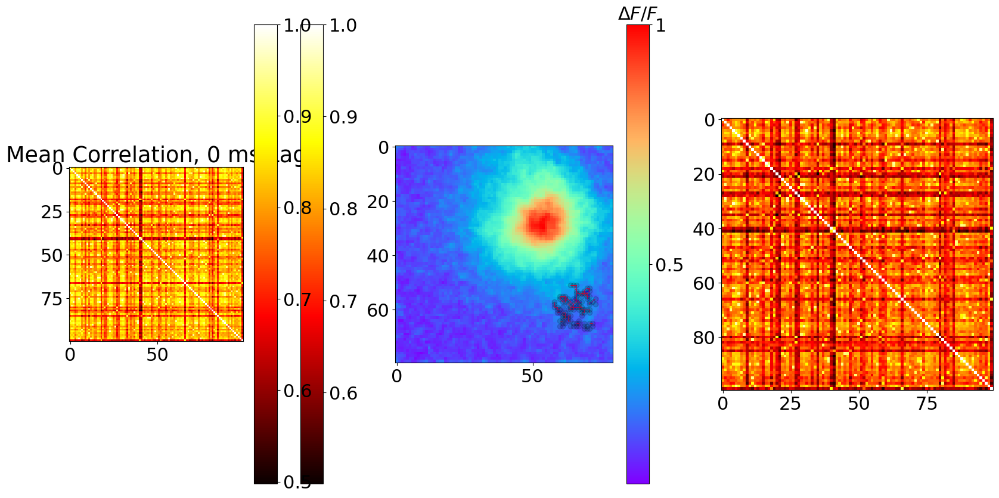

No corr_matrices_by_slice for this date/slice/location
Date:  4/9/2025 Slice:  1 Location:  2
Avg corr shape:  (8, 100, 100)
Avg corr shape:  (8, 100, 100)
{0: array([[1.        , 0.83747503, 0.82708843, ..., 0.83096819, 0.80560087,
        0.8603499 ],
       [0.83747503, 1.        , 0.9044911 , ..., 0.86967271, 0.77568406,
        0.93147345],
       [0.82708843, 0.9044911 , 1.        , ..., 0.90506837, 0.77223928,
        0.86398825],
       ...,
       [0.83096819, 0.86967271, 0.90506837, ..., 1.        , 0.82944032,
        0.85843412],
       [0.80560087, 0.77568406, 0.77223928, ..., 0.82944032, 1.        ,
        0.78226436],
       [0.8603499 , 0.93147345, 0.86398825, ..., 0.85843412, 0.78226436,
        1.        ]]), 1: array([[1.        , 0.82697623, 0.82258507, ..., 0.81757078, 0.77218321,
        0.82543375],
       [0.82697623, 1.        , 0.88074229, ..., 0.86051582, 0.75328388,
        0.89524515],
       [0.82258507, 0.88074229, 1.        , ..., 0.91225729, 0.74859758

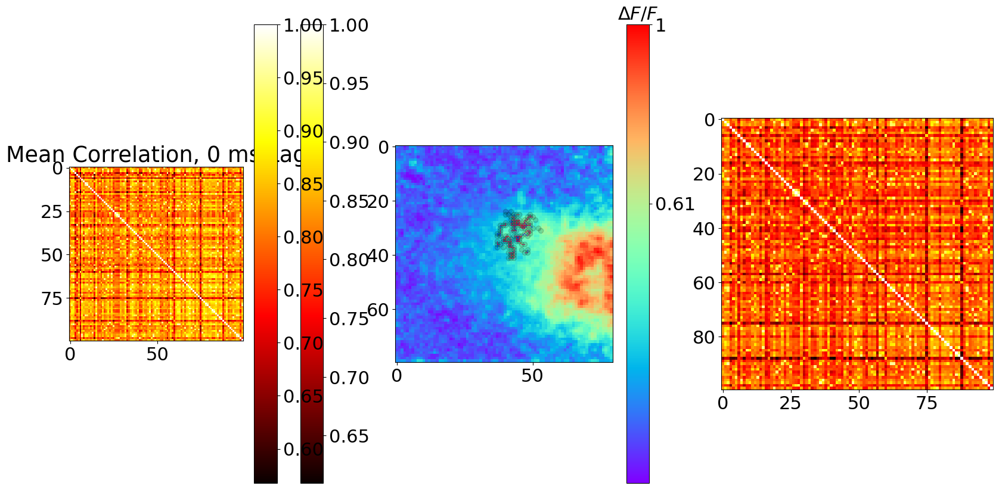

Date:  4/9/2025 Slice:  2 Location:  2
Avg corr shape:  (12, 100, 100)
Avg corr shape:  (12, 100, 100)
{0: array([[1.        , 0.81234253, 0.80525194, ..., 0.79472532, 0.82104639,
        0.74869399],
       [0.81234253, 1.        , 0.84959588, ..., 0.86007108, 0.82025609,
        0.77217681],
       [0.80525194, 0.84959588, 1.        , ..., 0.87653475, 0.87918383,
        0.79154889],
       ...,
       [0.79472532, 0.86007108, 0.87653475, ..., 1.        , 0.83336627,
        0.75375973],
       [0.82104639, 0.82025609, 0.87918383, ..., 0.83336627, 1.        ,
        0.77072607],
       [0.74869399, 0.77217681, 0.79154889, ..., 0.75375973, 0.77072607,
        1.        ]]), 1: array([[1.        , 0.70019047, 0.69655442, ..., 0.67977151, 0.6871264 ,
        0.59788306],
       [0.70019047, 1.        , 0.78091648, ..., 0.80404074, 0.7775812 ,
        0.63865174],
       [0.69655442, 0.78091648, 1.        , ..., 0.76372073, 0.81956287,
        0.67722942],
       ...,
       [0.67977151

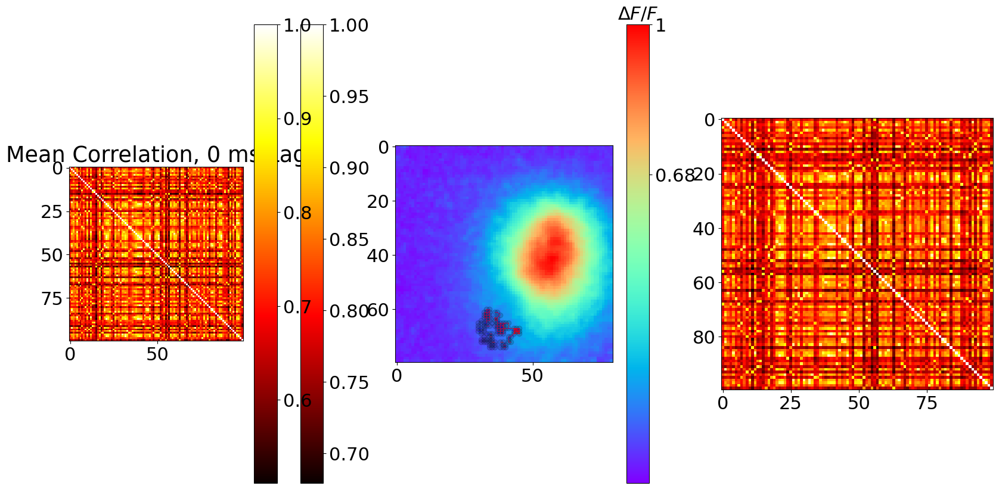

Date:  4/9/2025 Slice:  3 Location:  2
Avg corr shape:  (13, 100, 100)
Avg corr shape:  (13, 100, 100)
{0: array([[1.        , 0.83564991, 0.85103272, ..., 0.84424051, 0.86306241,
        0.85316052],
       [0.83564991, 1.        , 0.88066163, ..., 0.89222133, 0.90021593,
        0.89345935],
       [0.85103272, 0.88066163, 1.        , ..., 0.89992422, 0.89014389,
        0.90461227],
       ...,
       [0.84424051, 0.89222133, 0.89992422, ..., 1.        , 0.93573754,
        0.94777701],
       [0.86306241, 0.90021593, 0.89014389, ..., 0.93573754, 1.        ,
        0.92960574],
       [0.85316052, 0.89345935, 0.90461227, ..., 0.94777701, 0.92960574,
        1.        ]]), 1: array([[1.        , 0.78982934, 0.78801204, ..., 0.79299961, 0.79680451,
        0.80222636],
       [0.78982934, 1.        , 0.79234749, ..., 0.85167199, 0.84371763,
        0.7935658 ],
       [0.78801204, 0.79234749, 1.        , ..., 0.79442694, 0.78429381,
        0.79163379],
       ...,
       [0.79299961

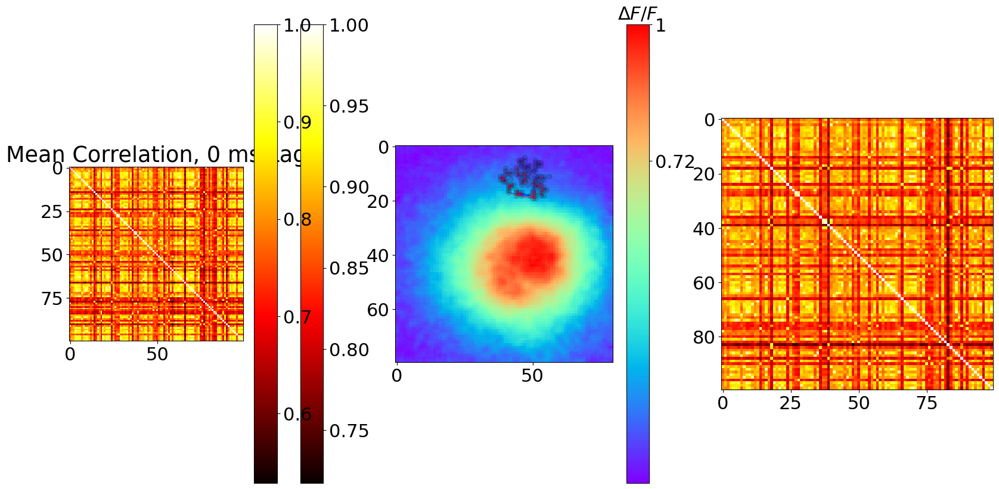

Date:  4/9/2025 Slice:  4 Location:  2
Avg corr shape:  (13, 100, 100)
Avg corr shape:  (13, 100, 100)
{0: array([[1.        , 0.74522684, 0.67184577, ..., 0.68284616, 0.86029578,
        0.81027339],
       [0.74522684, 1.        , 0.64020768, ..., 0.71039351, 0.772291  ,
        0.76187068],
       [0.67184577, 0.64020768, 1.        , ..., 0.52503862, 0.6364844 ,
        0.66369923],
       ...,
       [0.68284616, 0.71039351, 0.52503862, ..., 1.        , 0.70185211,
        0.66807134],
       [0.86029578, 0.772291  , 0.6364844 , ..., 0.70185211, 1.        ,
        0.81987885],
       [0.81027339, 0.76187068, 0.66369923, ..., 0.66807134, 0.81987885,
        1.        ]]), 1: array([[1.        , 0.63101759, 0.45818671, ..., 0.56072526, 0.73401489,
        0.65938792],
       [0.63101759, 1.        , 0.46140132, ..., 0.50682053, 0.60941487,
        0.63453584],
       [0.45818671, 0.46140132, 1.        , ..., 0.470464  , 0.51042344,
        0.5371741 ],
       ...,
       [0.56072526

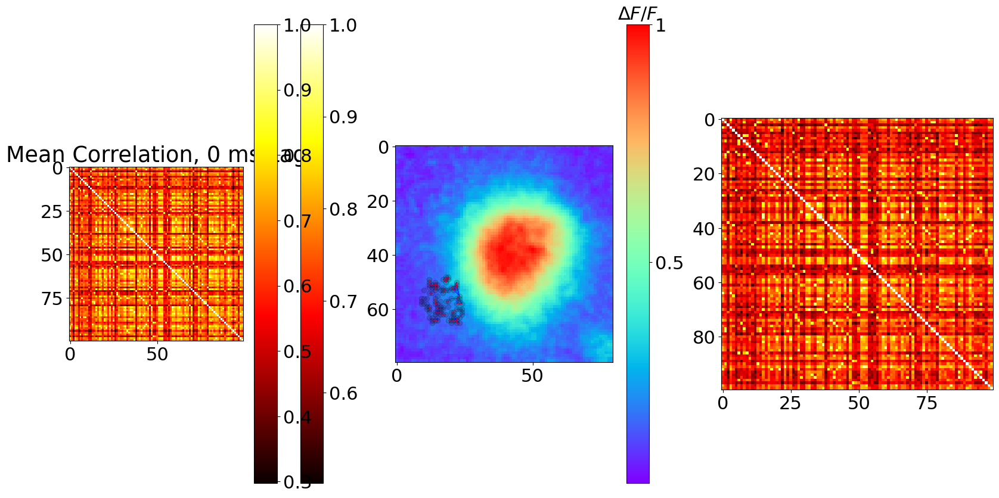

In [ ]:
# Now use ROI_File and read the location of the ROIs using ROIFileReader
# Also read in the amp_array from the ppr_df and use that as the image to plot the ROIs locations on.
# The roi file is stored in a column in the ppr_df called 'ROI_File'
# The amp_array is stored in a column in the ppr_df called 'amp_array'

optimal_lag = 0  # based on the previous plot, this is the lag with the highest correlation
def read_array_file(filename): 
    data_arr = pd.read_csv(filename,
                                 sep='\t',
                                 header=None,
                                 names=['Index',  'Values'])
    return np.array(data_arr['Values']).reshape((80, 80))

distance_vs_corr = {0: {}, 1: {}}
node_degree_dist = {0: {}, 1: {}}
corr_vs_ipi = {0: {}, 1: {}}
for date in ppr_df['Date'].unique():
    date_df = ppr_df[ppr_df['Date'] == date]
    if date not in corr_matrices_by_slice:
        print("No corr_matrices_by_slice for this date")
        continue
    for slic in date_df['Slice'].unique():
        slic_df = date_df[date_df['Slice'] == slic]
        for loc in slic_df['Location'].unique():
            loc_df = slic_df[slic_df['Location'] == loc]
            slic_loc_id = f"{slic}_{loc}"
            if slic_loc_id not in corr_matrices_by_slice[date]:
                print("No corr_matrices_by_slice for this date/slice/location")
                continue

            if date not in node_degree_dist[0]:
                node_degree_dist[0][date] = {}
                node_degree_dist[1][date] = {}
            if slic_loc_id not in node_degree_dist[0][date]:
                node_degree_dist[0][date][slic_loc_id] = {0: {},
                                                       1: {}} # 0 for barrel 0, 1 for barrel 1
                node_degree_dist[1][date][slic_loc_id] = {0: {},
                                                       1: {}} # 0 for barrel 0, 1 for barrel 1                                                       
            if date not in distance_vs_corr[0]:
                distance_vs_corr[0][date] = {}
                distance_vs_corr[1][date] = {}
            if slic_loc_id not in distance_vs_corr[0][date]:
                distance_vs_corr[0][date][slic_loc_id] =  {'distance': [], 'corr': []}
                distance_vs_corr[1][date][slic_loc_id] =  {'distance': [], 'corr': []}    

            print("Date: ", date, "Slice: ", slic, "Location: ", loc)

            ppr_barrel_subset = ppr_barrel_df[(ppr_barrel_df['Date'] == date) &
                    (ppr_barrel_df['Slice'] == slic) &
                    (ppr_barrel_df['Location'] == loc)]
            if len(ppr_barrel_subset) == 0:
                print("No ppr_barrel_df for this date/slice/location")
                continue
            
            # look up the amp_array in ppr_barrel_df
            amp_array = ppr_barrel_subset['amp_array'].values[0]
            amp_array = read_array_file(amp_array)

            # get roi_file for this recording
            roi_file_barrel_1 = loc_df[loc_df['ROI_Set'].str.contains('rand_1')]['ROI_File'].values[0]

            # read the roi file (barrel 1)
            rois_1 = ROIFileReader(roi_file_barrel_1).get_roi_list()
            rois_1 = [LaminarROI(r, input_diode_numbers=True)
                    for r in rois_1]
            rois_points1 = [roi.get_points() for roi in rois_1]

            
            
            # now get the correlation matrix for this date/slice/location
            avg_corr = {0: [], 1: []}
            # corr_matrices_by_slice[date][slic_loc_id][ipi][control_or_ppr_type][lag][i]
            for pulse_number in [0, 1]:
                for ipi in corr_matrices_by_slice[date][slic_loc_id].keys():
                
                    try:
                        avg_corr[pulse_number].append(corr_matrices_by_slice[date][slic_loc_id][ipi][pulse_number][optimal_lag])
                    except IndexError:
                        print("IndexError: ", ipi, control_or_ppr_type, optimal_lag, i_slice)
                        print('len(corr_matrices_by_slice[date][slic_loc_id][ipi][control_or_ppr_type][optimal_lag]): ',
                            len(corr_matrices_by_slice[date][slic_loc_id][ipi][control_or_ppr_type][optimal_lag])) # 
                        continue
                avg_corr[pulse_number] = np.array([ac[1] for ac in avg_corr[pulse_number]])
                avg_corr[pulse_number] = np.array(avg_corr[pulse_number]).reshape(-1, 100, 100)
                print("Avg corr shape: ", avg_corr[pulse_number].shape)
                avg_corr[pulse_number] = np.mean(avg_corr[pulse_number], axis=0)
            print(avg_corr)

            if avg_corr[0].shape[0] < 10 or avg_corr[1].shape[0] < 10:
                print("Avg corr shape is too small: ", avg_corr)
                continue

            # plot the amp_array and overlay the ROIs. 2 subplots
            fig, ax = plt.subplots(1, 3, figsize=(20, 10))
            ax[1].imshow(amp_array, cmap='rainbow', interpolation='nearest')

            # colorbar for the amp_array
            cbar = plt.colorbar(ax[1].imshow(amp_array, cmap='rainbow',
                     interpolation='nearest', vmin=np.min(amp_array), 
                     vmax=np.max(amp_array)), ax=ax[1])

            cbar.set_ticks([np.min(amp_array), np.max(amp_array)])
            cbar.set_ticklabels([str(round(np.min(amp_array), 2)), 
                                str(round(np.max(amp_array), 2))])
            cbar.ax.set_title(r'$\Delta F/F$', fontsize=22)            
            
            # plot the ROIs
            for roi in rois_points1:
                ax[1].scatter(roi[0][0], roi[0][1], color='black', alpha=0.15, label='Neighbor Barrel')
            
            #handles = [h for i, h in enumerate(ax[1].get_legend_handles_labels()[0]) if i % 2 == 0]
            #labels = [l for i, l in enumerate(ax[1].get_legend_handles_labels()[1]) if i % 2 == 0]
            #ax[1].legend(handles=[handles[0], handles[-1]], labels=[labels[0], labels[-1]],
            #             loc='upper right', fontsize=12)

            for pulse_number in [0, 1]:
                pulse_color = 'blue' if pulse_number == 0 else 'red'

                # percentile threshold the avg_corr matrix to remove low values
                percentile_threshold = 0.97
                threshold = np.percentile(avg_corr[pulse_number], percentile_threshold * 100)

                for i_1, roi_1 in enumerate(rois_points1):
                    for i_2 in range(i_1 + 1, len(rois_points1)):
                        roi_2 = rois_points1[i_2]
                        # draw a line between the two ROIs, 
                        # with the color of the correlation value
                        corr = avg_corr[pulse_number][i_1, i_2]
                        x0, y0 = roi_1[0][0], roi_1[0][1]
                        x1, y1 = roi_2[0][0], roi_2[0][1]

                        # track these nodes' degrees (weighted by correlation value)
                        key_roi1 = f"{x0}_{y0}"
                        # sum that node's row in the avg_corr matrix
                        node_degree_dist[pulse_number][date][slic_loc_id][1][key_roi1] = np.mean(list(avg_corr[pulse_number][i_1, 0:i_1]) + list(avg_corr[pulse_number][i_1, i_1 + 1:]))

                        # track the distribution of edge distances and correlation values
                        distance_vs_corr[pulse_number][date][slic_loc_id]['distance'].append(np.sqrt((x0 - x1) ** 2 + (y0 - y1) ** 2))
                        distance_vs_corr[pulse_number][date][slic_loc_id]['corr'].append(corr)

                        if corr < threshold:
                            continue
                        
                        color = plt.cm.hot(corr)
                        # plot the line between the two ROIs with outline on line
                        ax[1].plot([x0, x1], [y0, y1], color=pulse_color, linewidth=0.4)

            # plot the avg corr matrix on the left
            ax[0].imshow(avg_corr[0], cmap='hot', interpolation='nearest',
                    vmin=np.min(avg_corr[0]), vmax=1)
            ax[2].imshow(avg_corr[1], cmap='hot', interpolation='nearest',
                    vmin=np.min(avg_corr[1]), vmax=1)
            ax[0].set_title(f"Mean Correlation, {optimal_lag} ms Lag")

            plt.colorbar(ax[0].imshow(avg_corr[0], cmap='hot', interpolation='nearest',
                    vmin=np.min(avg_corr[0]), vmax=1), ax=ax[0])
            plt.colorbar(ax[2].imshow(avg_corr[1], cmap='hot', interpolation='nearest',
                    vmin=np.min(avg_corr[1]), vmax=1), ax=ax[0])
            # label colorbar with correlation values
            cbar.set_ticks([np.min(avg_corr[0]), 1])
            cbar.set_ticklabels([str(round(np.min(avg_corr[0]), 2)), 
                                str(1)])
            formatted_date = date.replace('/', '-')
            plt.savefig(f"{output_fig_dir}/{formatted_date}_{slic_loc_id}_"
                        f"static_fc_percentile_{str(int(percentile_threshold * 100))}-corr-rois_intrabarrel_pulse2.png")
            plt.show()



In [13]:
corr_matrices_by_slice.keys()

dict_keys(['12/23/2024', '1/15/2025', '1/22/2025', '2/5/2025', '4/16/2025', '4/9/2025'])

In [38]:
node_degree_dist

{'12/23/2024': {'1_3': {0: {},
   1: {'52_48': 0.8767239019803388,
    '39_58': 0.8569443403694346,
    '57_51': 0.8720544408652005,
    '47_54': 0.8838407646017108,
    '43_49': 0.9008429712470819,
    '43_56': 0.8711092275106952,
    '54_51': 0.8860560357086414,
    '38_54': 0.872489378618418,
    '46_52': 0.8937926595261749,
    '45_42': 0.8226442533566274,
    '38_51': 0.883807613165771,
    '47_42': 0.803435205851519,
    '43_46': 0.8884632057138093,
    '50_61': 0.8276077956345944,
    '37_54': 0.867534748541233,
    '44_52': 0.895156347140687,
    '41_52': 0.8914721938828792,
    '46_44': 0.8429986766911058,
    '39_49': 0.894275556920276,
    '42_57': 0.8645724834882199,
    '50_56': 0.879577958952637,
    '39_55': 0.8713956850028794,
    '55_50': 0.8829789317373736,
    '40_56': 0.8808230782068068,
    '50_53': 0.8989970581426895,
    '49_45': 0.8380148427136002,
    '44_61': 0.8287608222569953,
    '42_52': 0.8930733490140782,
    '56_49': 0.8663249260818804,
    '40_52': 0.8

Date: 12/23/2024, Slice/Location: 1_3


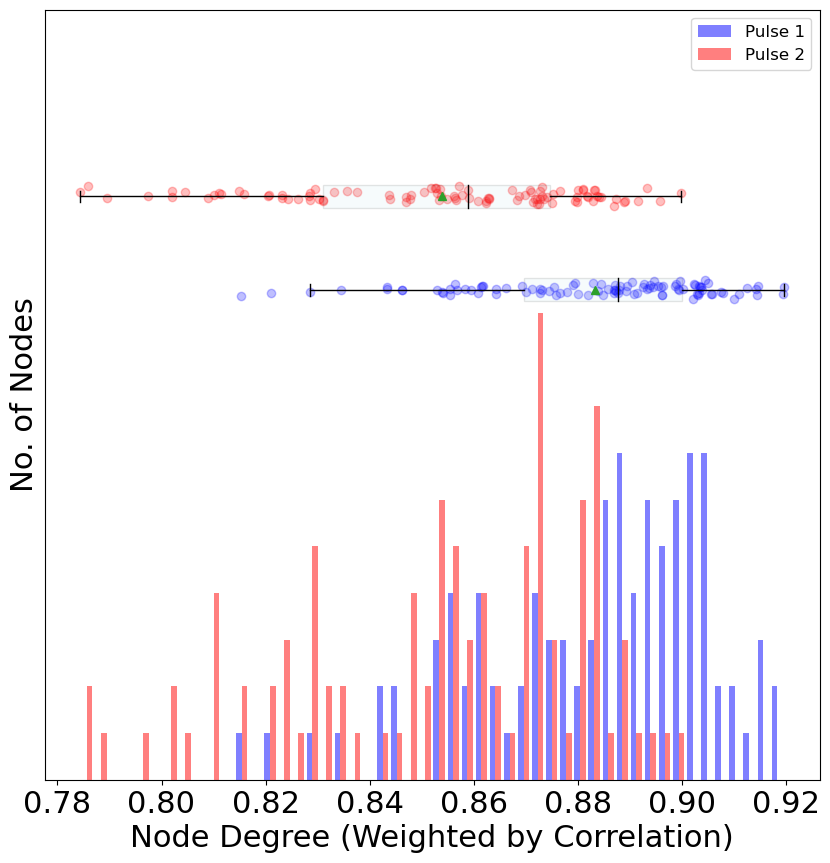

Date: 12/23/2024, Slice/Location: 2_2


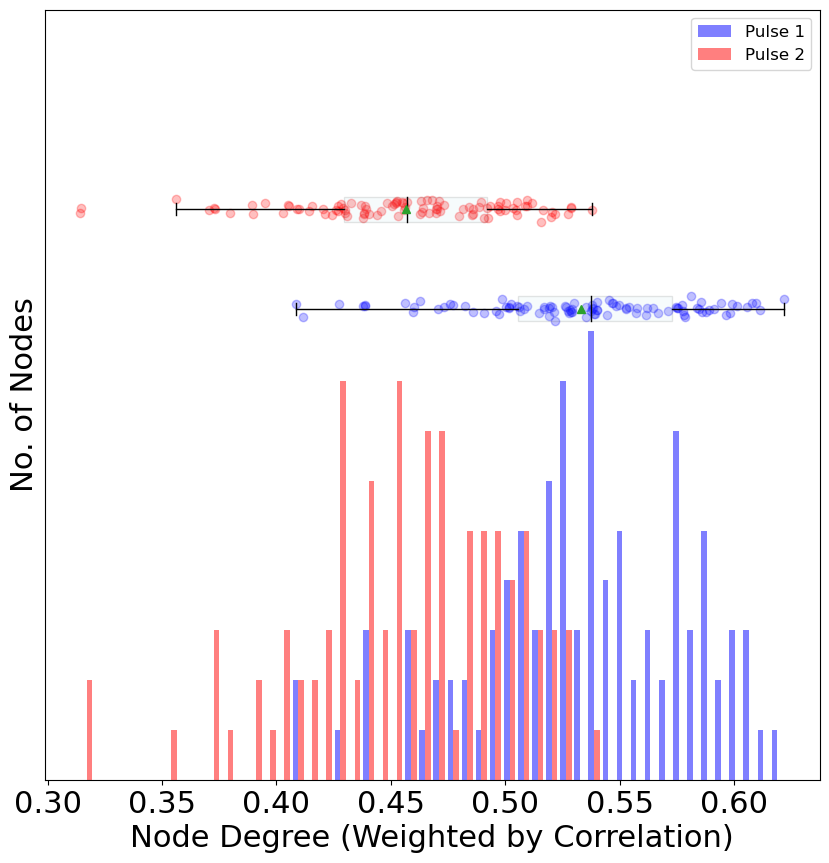

Date: 1/15/2025, Slice/Location: 1_3


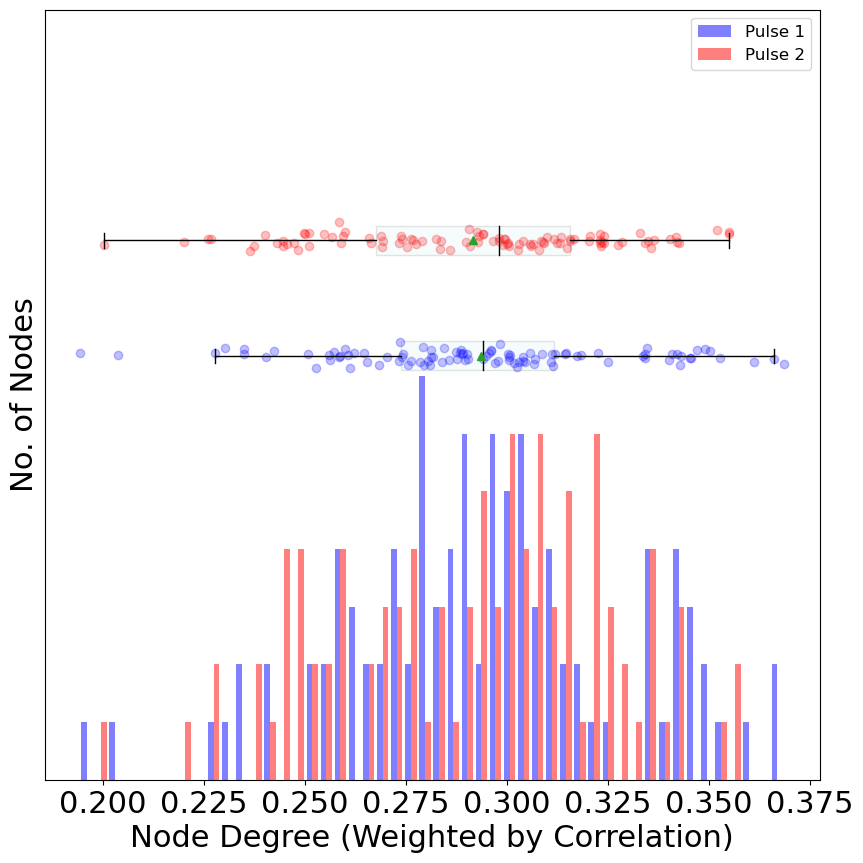

Date: 1/15/2025, Slice/Location: 3_2


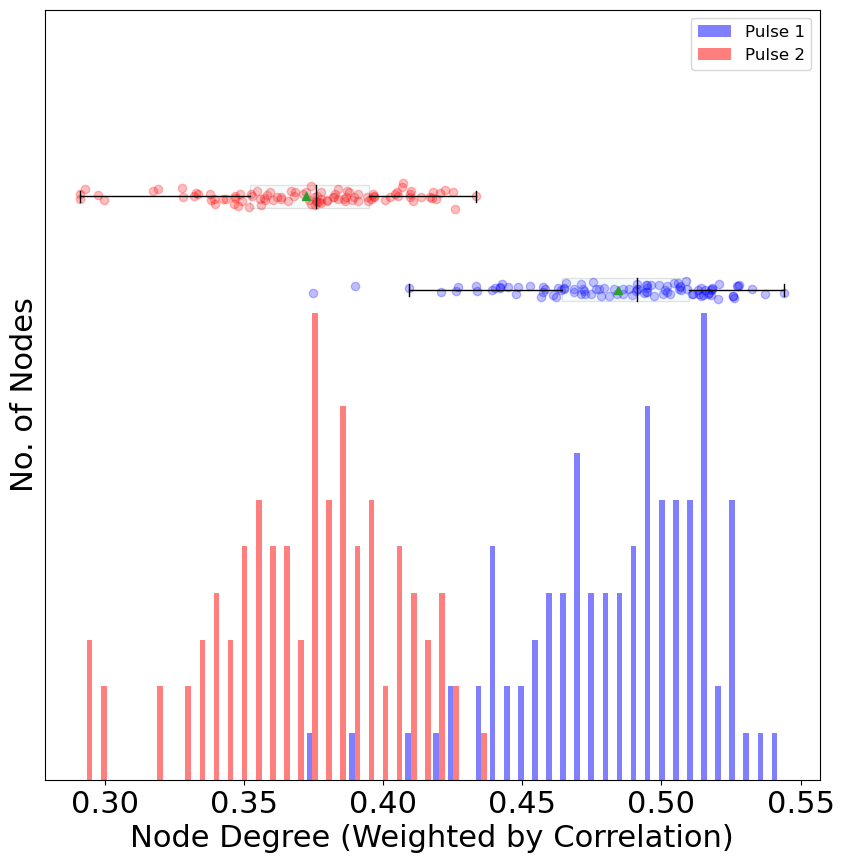

Date: 1/22/2025, Slice/Location: 1_2


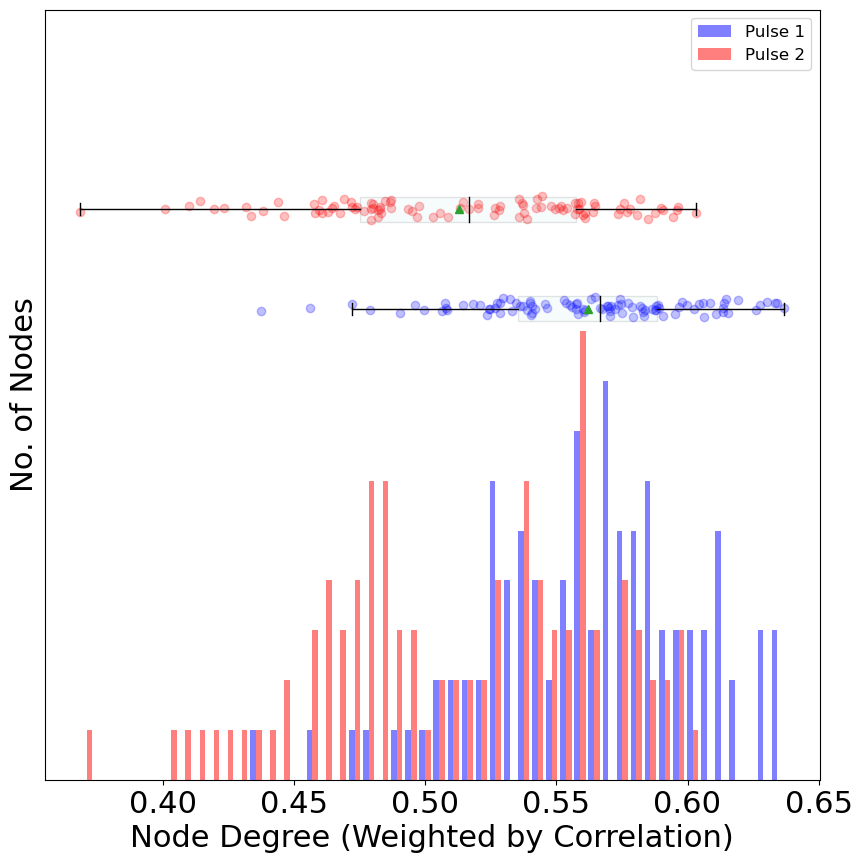

Date: 1/22/2025, Slice/Location: 3_2


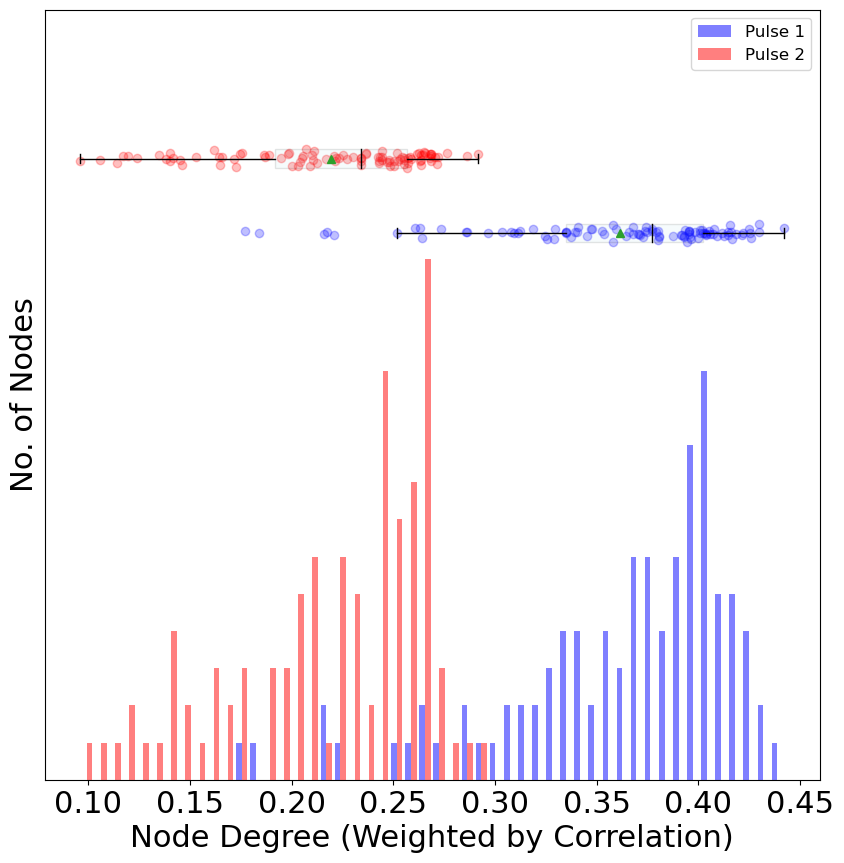

Date: 2/5/2025, Slice/Location: 1_3


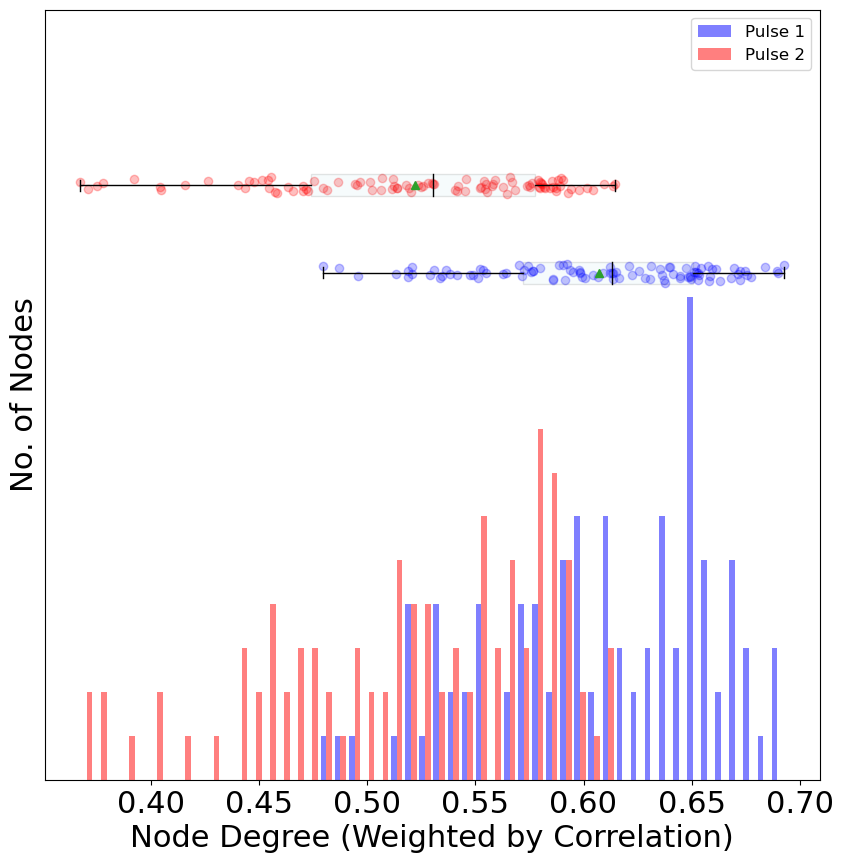

Date: 2/5/2025, Slice/Location: 2_2


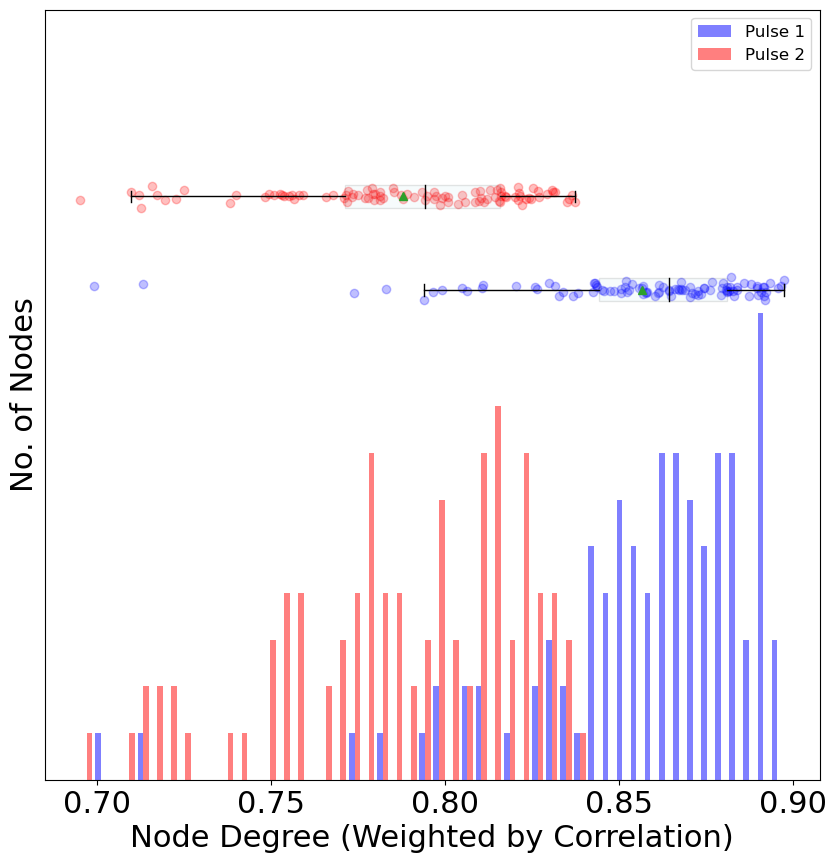

Date: 4/16/2025, Slice/Location: 1_1


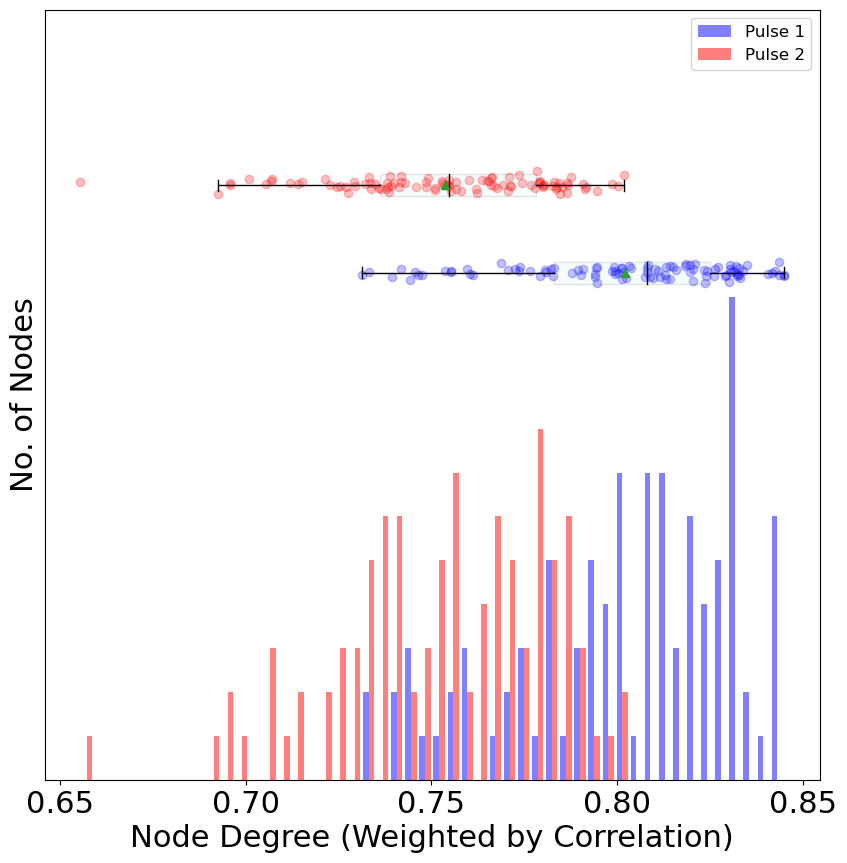

Date: 4/16/2025, Slice/Location: 2_2


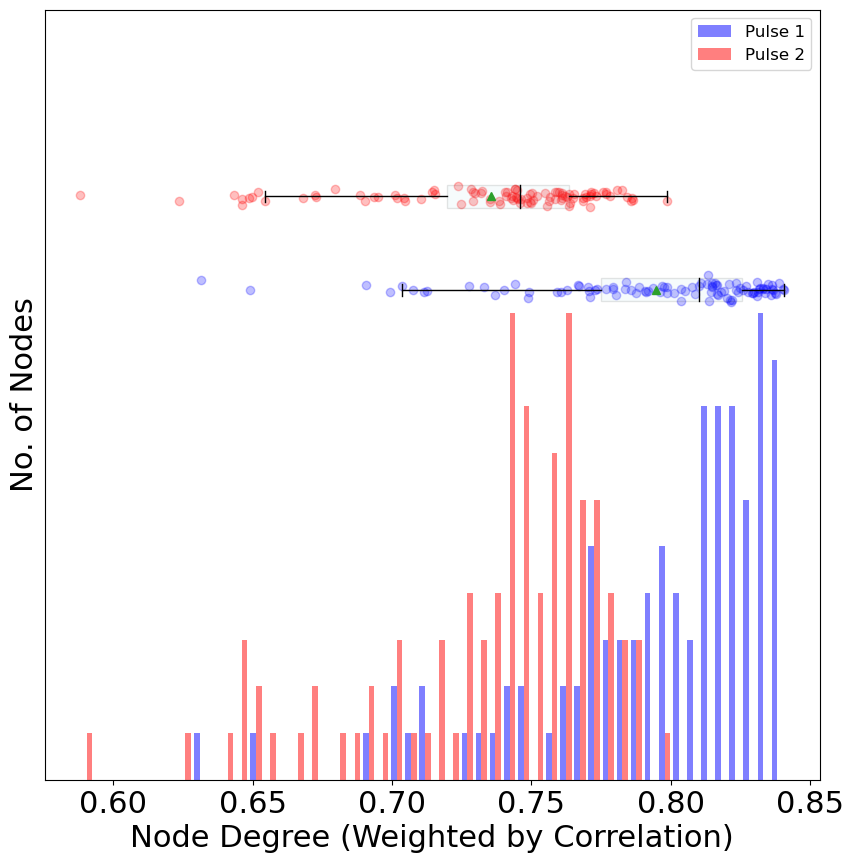

Date: 4/9/2025, Slice/Location: 1_2


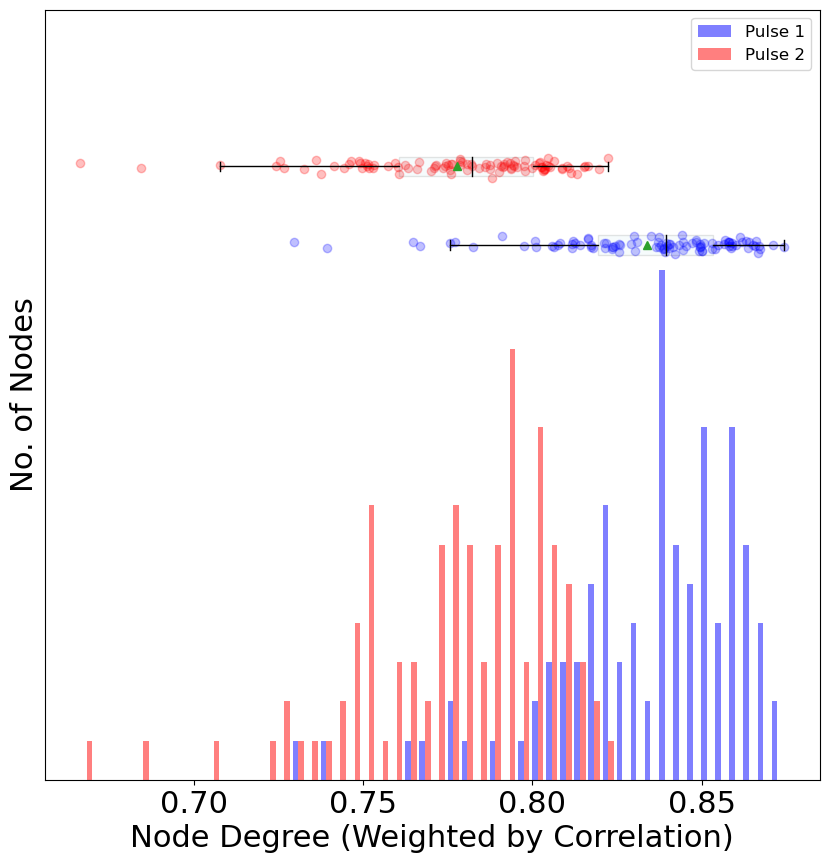

Date: 4/9/2025, Slice/Location: 2_2


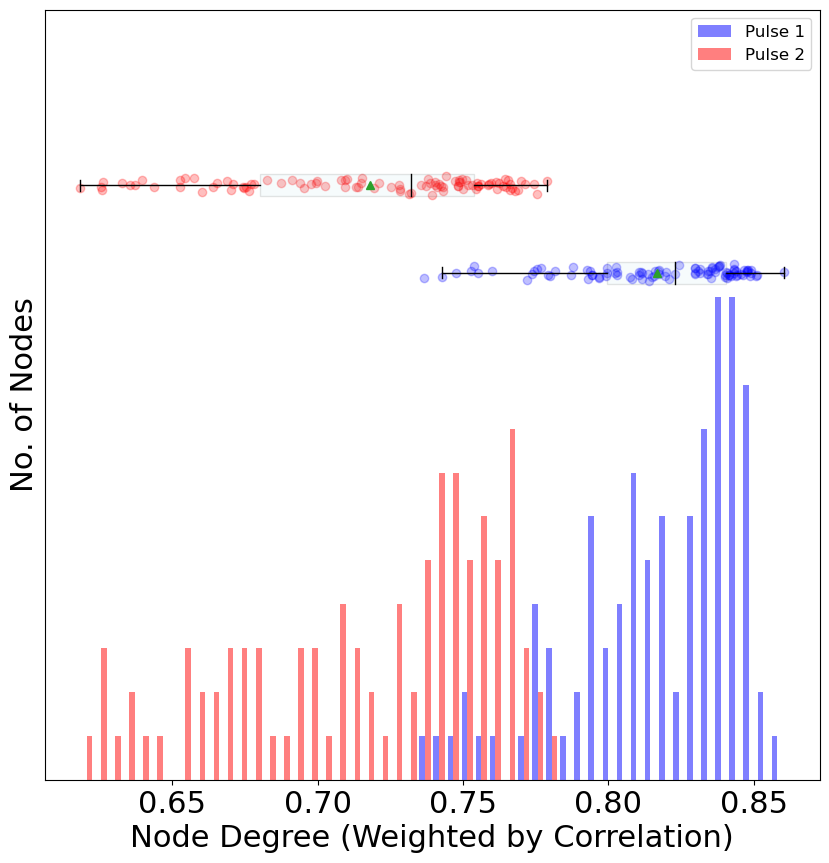

Date: 4/9/2025, Slice/Location: 3_2


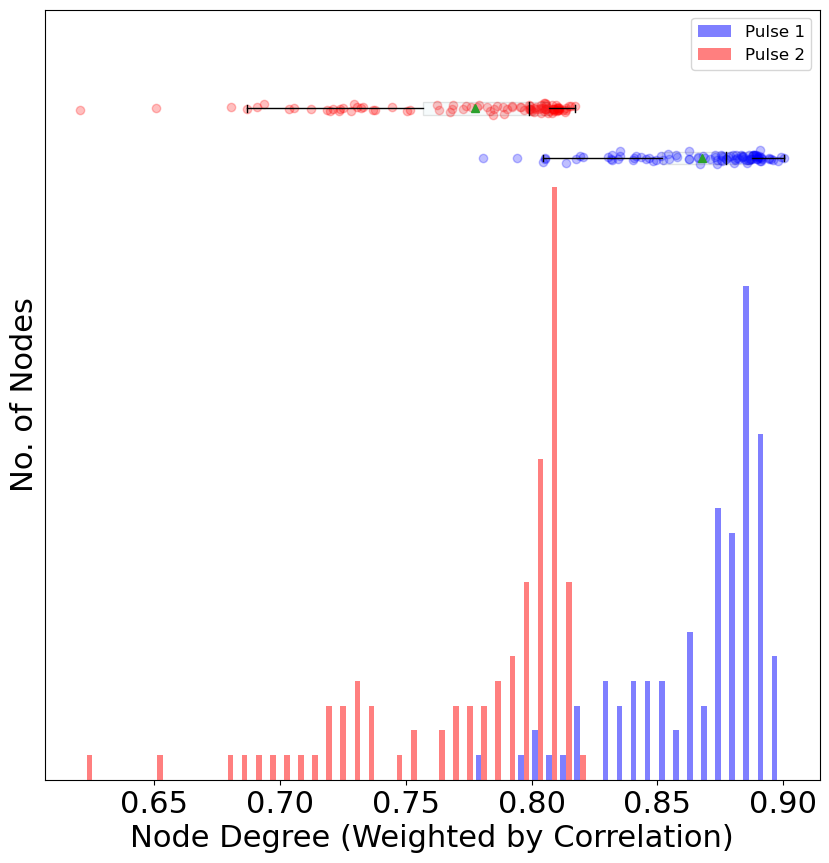

Date: 4/9/2025, Slice/Location: 4_2


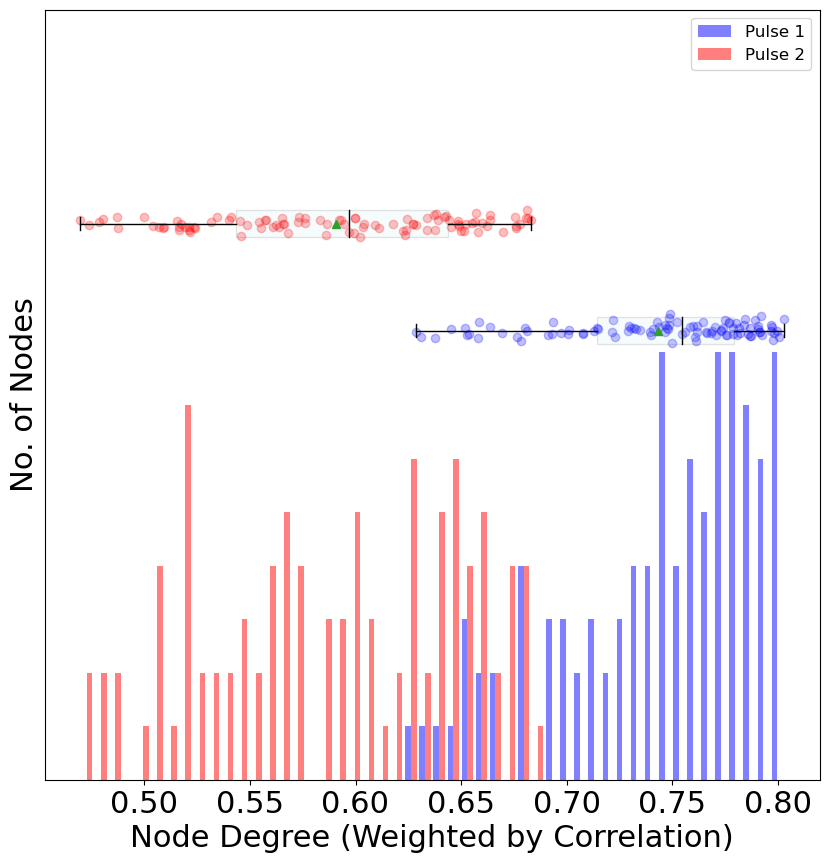

In [52]:
for date in node_degree_dist[0].keys():
    for slic_loc_id in node_degree_dist[0][date].keys():
        print(f"Date: {date}, Slice/Location: {slic_loc_id}")
        # plot the distribution of node degrees
        fig, ax = plt.subplots(figsize=(10, 10))
        #ax.set_xlim(0, 1)

        ax.hist([list(node_degree_dist[0][date][slic_loc_id][1].values()),
                list(node_degree_dist[1][date][slic_loc_id][1].values())],
                    bins=50, histtype='bar',
                    color=['blue', 'red'], alpha=0.5, label=['Pulse 1', 'Pulse 2'],)
        plot_ylim = ax.get_ylim()[1]

        # plot scatter points for each node degree
        y_jitter0 = np.random.normal(0, 0.1, len(node_degree_dist[0][date][slic_loc_id][1].values()))
        y_jitter1 = np.random.normal(0, 0.1, len(node_degree_dist[1][date][slic_loc_id][1].values()))
        ax.scatter(list(node_degree_dist[0][date][slic_loc_id][1].values()),
                    y_jitter0 + plot_ylim, color='blue', alpha=0.25)
        ax.scatter(list(node_degree_dist[1][date][slic_loc_id][1].values()),
                    y_jitter1 + plot_ylim + 2, color='red', alpha=0.25)

        # add horizontal boxplots 
        ax.boxplot([list(node_degree_dist[0][date][slic_loc_id][1].values()),
                    list(node_degree_dist[1][date][slic_loc_id][1].values())],
                    positions=[plot_ylim, plot_ylim + 2], 
                            widths=0.5, patch_artist=True,
                    boxprops=dict(facecolor='lightblue', alpha=0.1),
                    showfliers=False,
                    medianprops=dict(color='black'), showmeans=True, vert=False)

        ax.set_ylim(0, plot_ylim + 6)
        ax.legend(loc='upper right', fontsize=12)
        ax.set_yticks([])

        ax.set_xlabel('Node Degree (Weighted by Correlation)')
        ax.set_ylabel('No. of Nodes')
        date_formatted = date.replace('/', '-')
        plt.savefig(f"{output_fig_dir}/{date_formatted}_{slic_loc_id}_"
                    f"node_degree_distribution_barrel_percentile{str(int(percentile_threshold * 100))}_intrabarrel_pulse2.png")
        plt.show()

Date: 12/23/2024, Slice/Location: 1_3


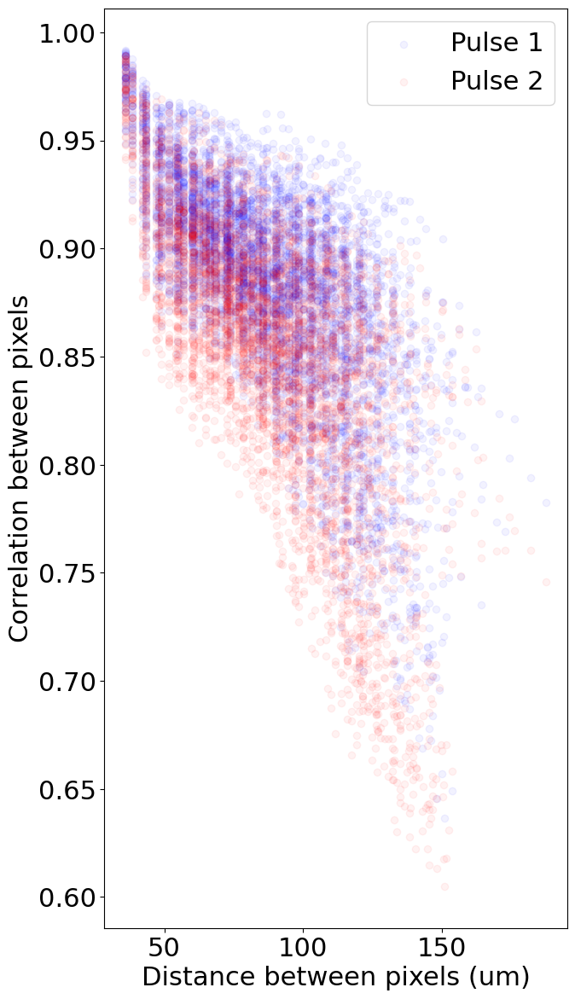

Date: 12/23/2024, Slice/Location: 2_2


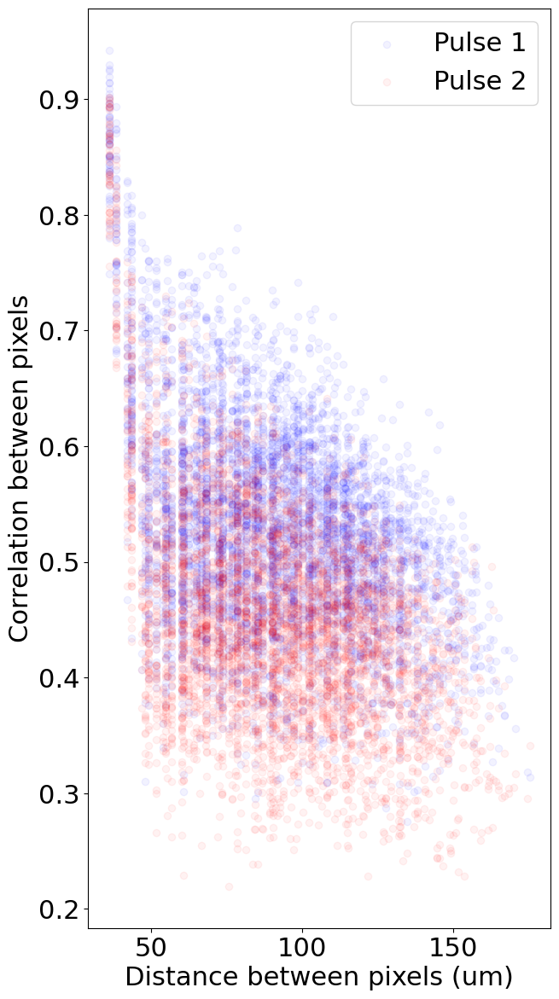

Date: 1/15/2025, Slice/Location: 1_3


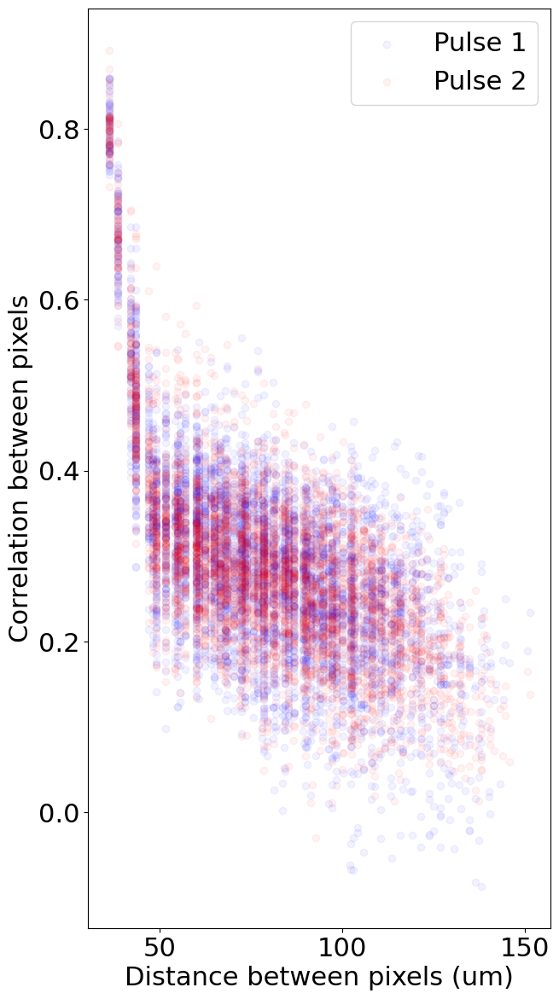

Date: 1/15/2025, Slice/Location: 3_2


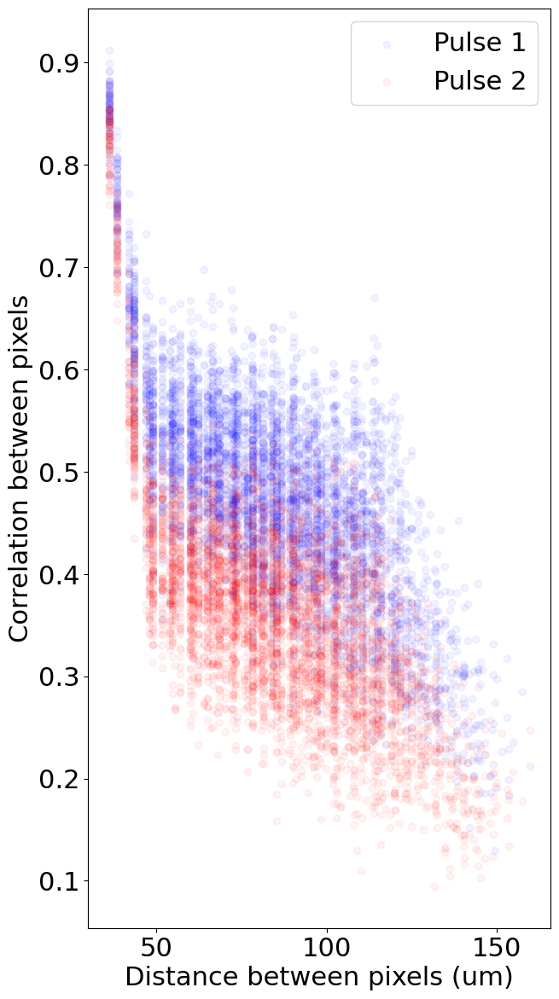

Date: 1/22/2025, Slice/Location: 1_2


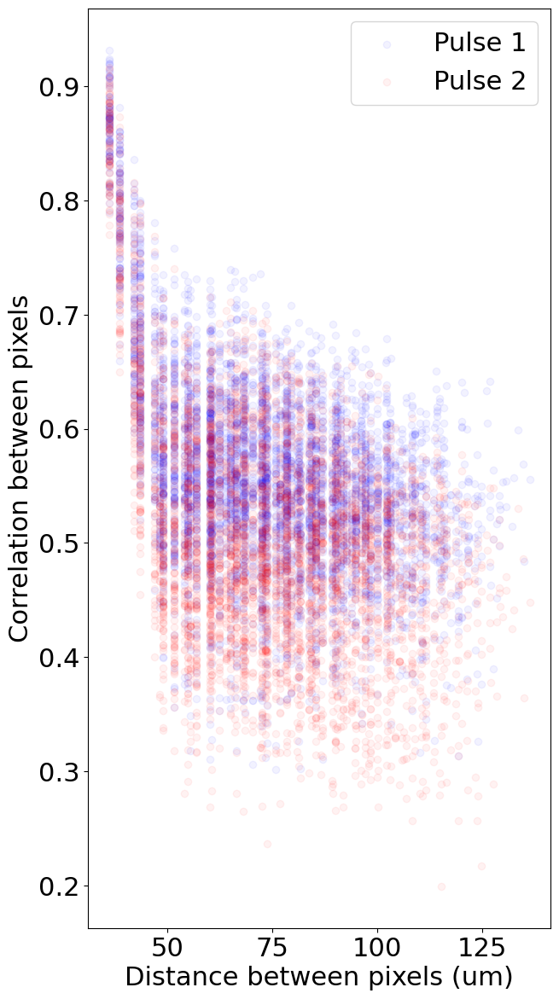

Date: 1/22/2025, Slice/Location: 3_2


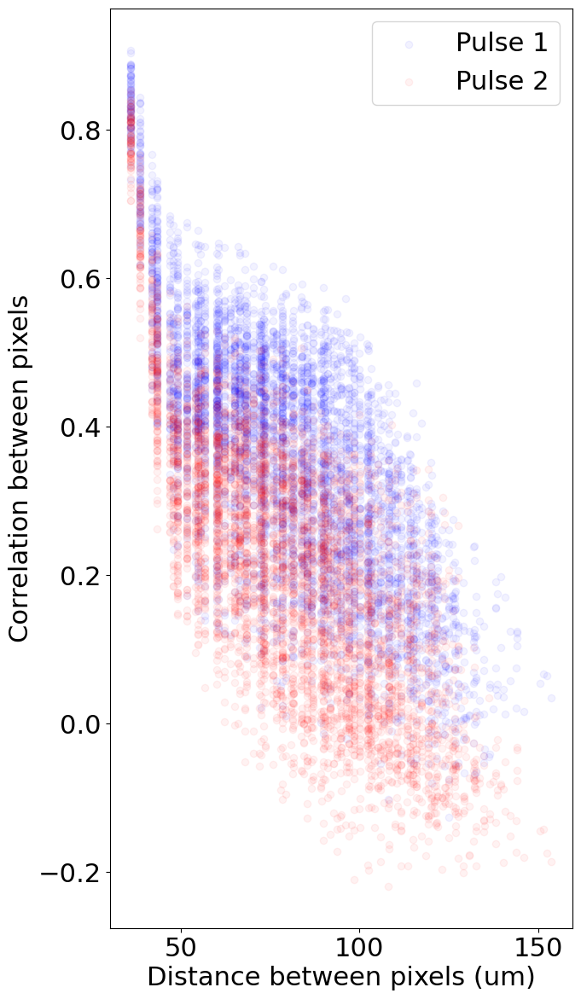

Date: 2/5/2025, Slice/Location: 1_3


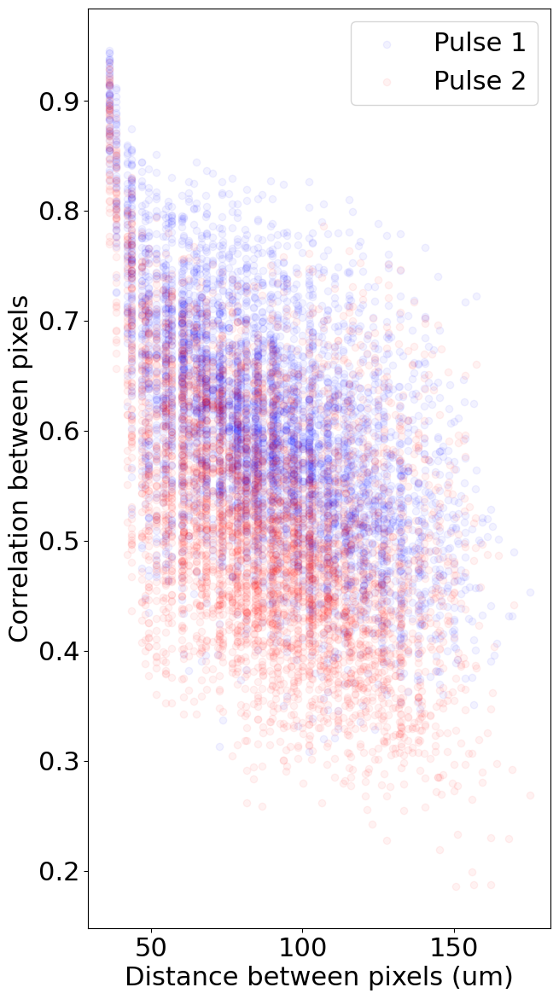

Date: 2/5/2025, Slice/Location: 2_2


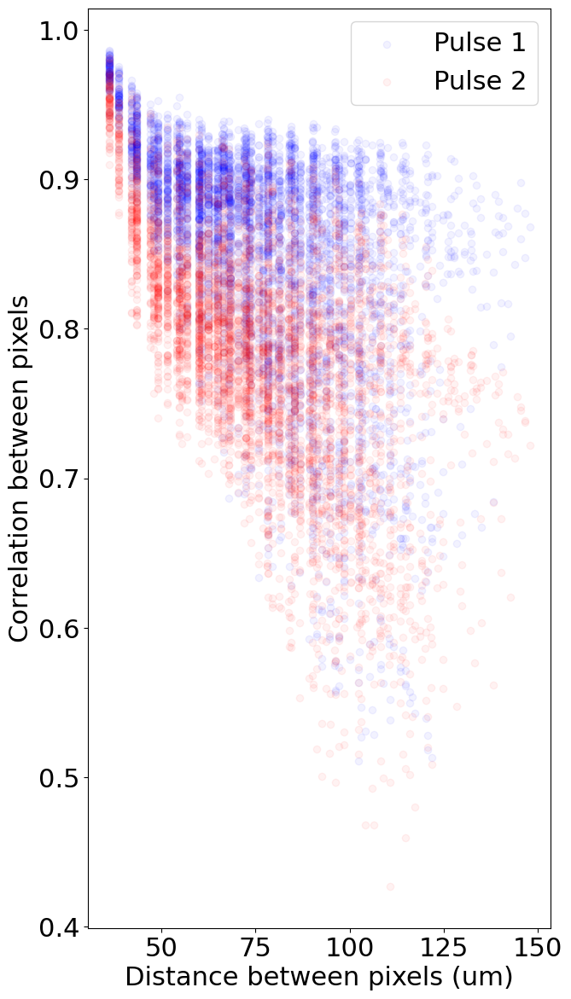

Date: 4/16/2025, Slice/Location: 1_1


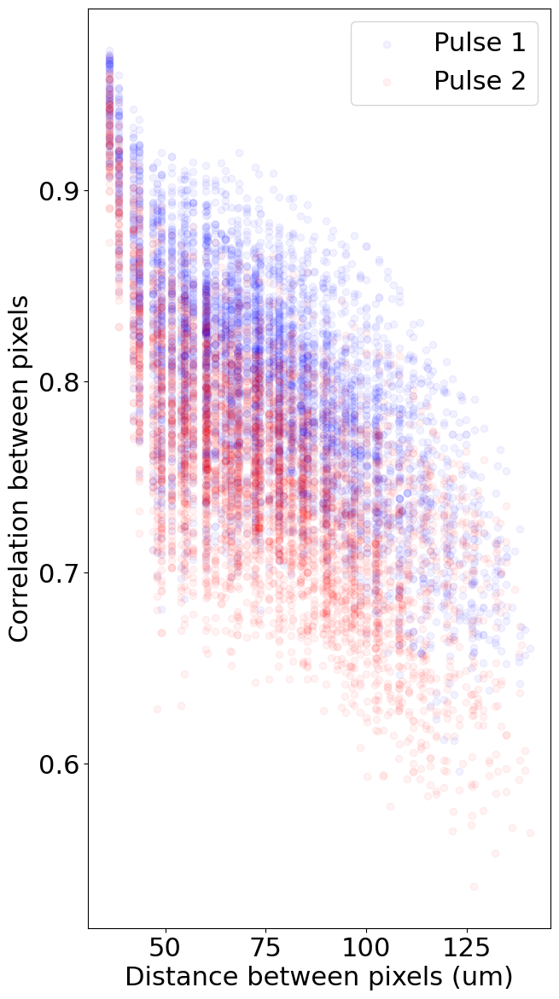

Date: 4/16/2025, Slice/Location: 2_2


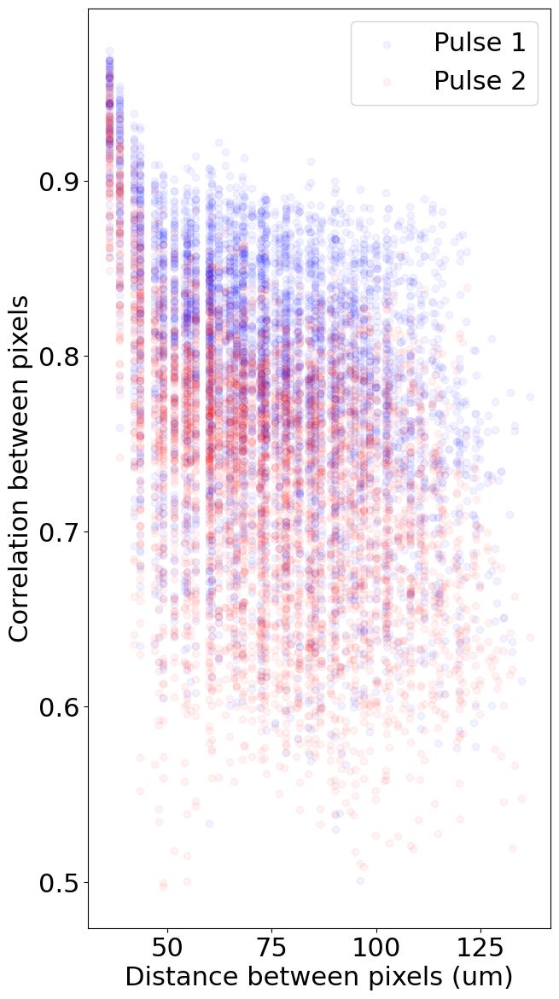

Date: 4/9/2025, Slice/Location: 1_2


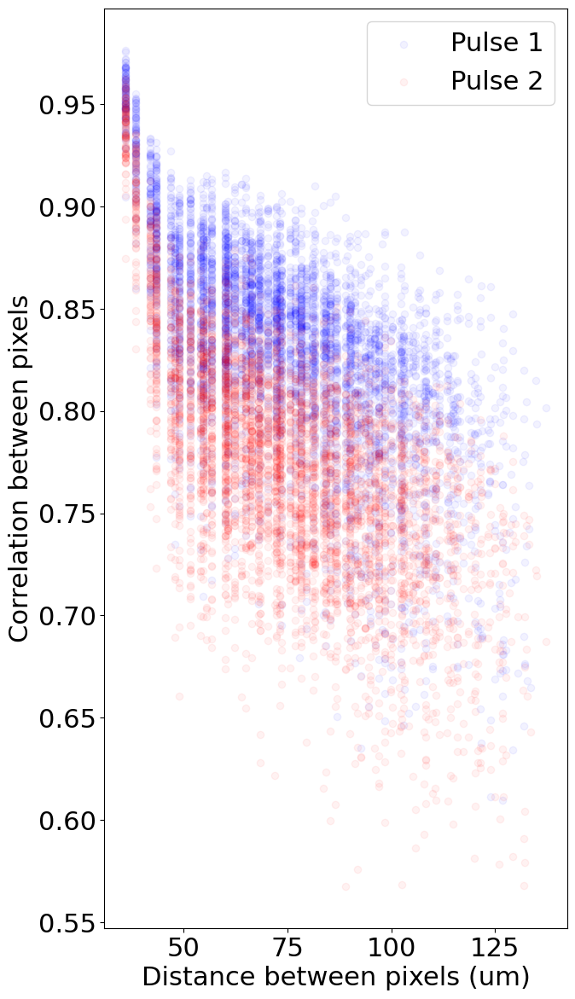

Date: 4/9/2025, Slice/Location: 2_2


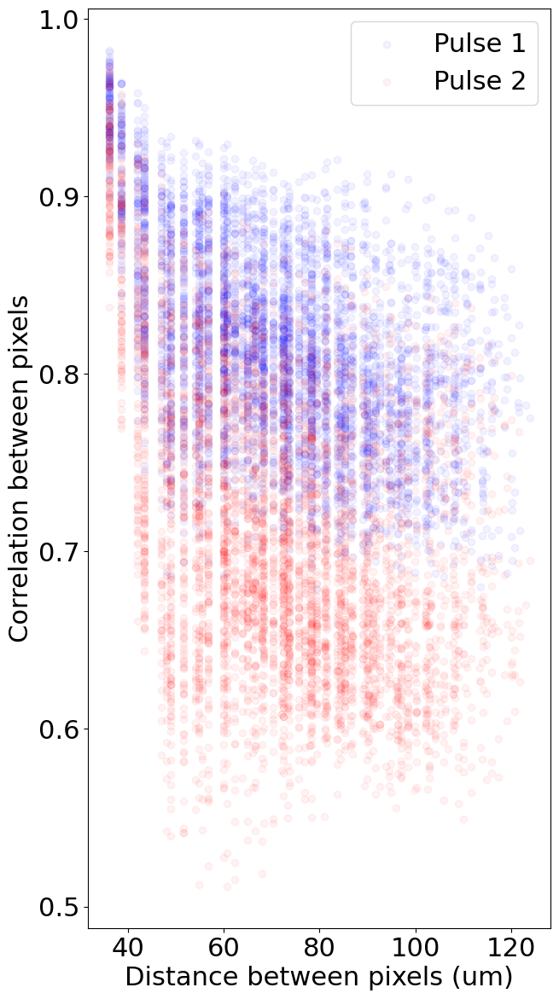

Date: 4/9/2025, Slice/Location: 3_2


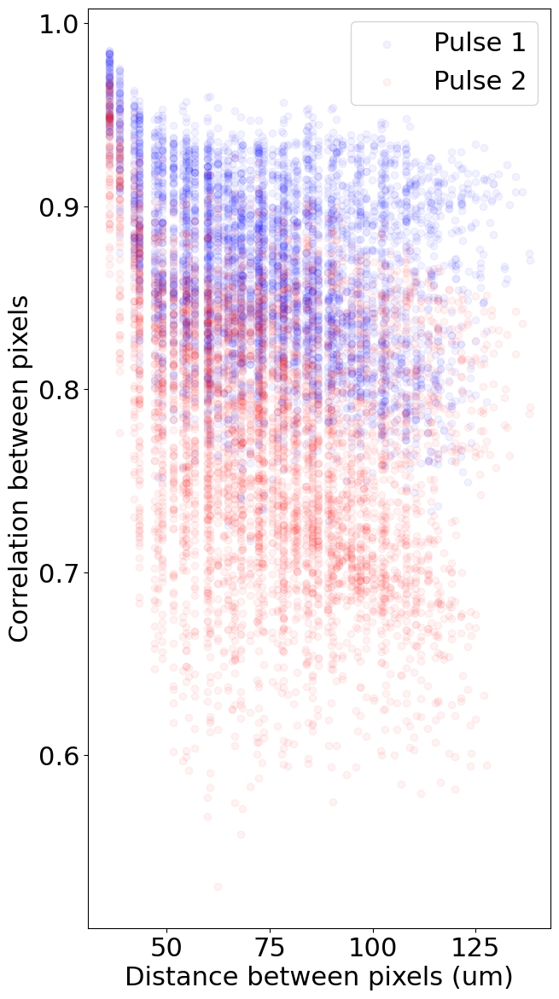

Date: 4/9/2025, Slice/Location: 4_2


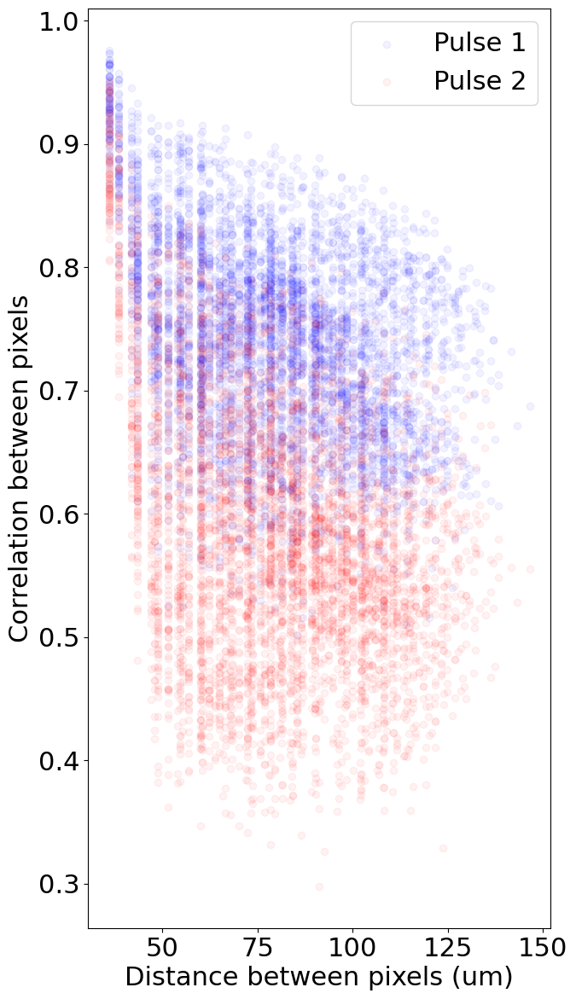

In [55]:
# Scatter plot of distance vs correlation in left subplot
x_shift = 30 # spacing for horizontal histogram
for date in distance_vs_corr[0].keys():
    for slic_loc_id in distance_vs_corr[0][date].keys():
        print(f"Date: {date}, Slice/Location: {slic_loc_id}")
        #distance_vs_corr[date][slic_loc_id]['distance'] = np.array(distance_vs_corr[date][slic_loc_id]['distance'])
        #distance_vs_corr[date][slic_loc_id]['corr'] = np.array(distance_vs_corr[date][slic_loc_id]['corr'])

        # plot the scatter plot
        fig, ax = plt.subplots(1, 1, figsize=(7, 14))
        ax.scatter(np.array(distance_vs_corr[0][date][slic_loc_id]['distance']) * um_per_px + x_shift, 
                    distance_vs_corr[0][date][slic_loc_id]['corr'], alpha=0.05, color='blue', label='Pulse 1')
        ax.scatter(np.array(distance_vs_corr[1][date][slic_loc_id]['distance']) * um_per_px + x_shift, 
                    distance_vs_corr[1][date][slic_loc_id]['corr'], alpha=0.05, color='red', label='Pulse 2')
        ax.set_xlabel('Distance between pixels (um)')
        ax.set_ylabel('Correlation between pixels')

        '''# get plot ylim
        plot_ylim = ax.get_ylim()[1]

        # add a histogram of the number of points at each distance
        counts, bins, _ = plt.hist(np.array(distance_vs_corr[date][slic_loc_id]['distance']) * um_per_px + x_shift, bins=50, alpha=0)
        # Normalize bin heights
        max_count = max(counts)
        normalized_counts = counts / max_count * 0.3  # Scale to [0, 0.3]
        ax.bar(bins[:-1], normalized_counts, width=np.diff(bins), color='tab:blue', alpha=0.5)

        # add a horizontal histogram of the number of points at each correlation value
        counts_corr, bins_corr, _ = plt.hist(distance_vs_corr[date][slic_loc_id]['corr'], bins=50, alpha=0)
        # Normalize bin heights
        max_count_corr = max(counts_corr)
        normalized_counts_corr = counts_corr / max_count_corr * 30
        ax.barh(bins_corr[:-1], normalized_counts_corr, height=np.diff(bins_corr), color='tab:blue', alpha=0.5)


        # add a line of best fit
        z = np.polyfit(np.array(distance_vs_corr[date][slic_loc_id]['distance']) * um_per_px, 
                        distance_vs_corr[date][slic_loc_id]['corr'], 1)
        p = np.poly1d(z)
        x_fit = np.linspace(0, max(distance_vs_corr[date][slic_loc_id]['distance']) * um_per_px, 100)
        ax.plot(x_fit, p(x_fit), color='black', linewidth=2, label='Line of Best Fit')
        ax.legend(loc='upper right', fontsize=12)
        # linear regression metrics
        slope, intercept, r_value, p_value, std_err = linregress(
            np.array(distance_vs_corr[date][slic_loc_id]['distance']) * um_per_px, 
            distance_vs_corr[date][slic_loc_id]['corr'])
        print(f"Slope: {slope}, Intercept: {intercept}, R^2: {r_value**2}, p-value: {p_value}, Std Err: {std_err}")'''
        ax.legend()
        #ax.set_ylim(0, plot_ylim)
        #ax.set_xticks(np.arange(x_shift, max(distance_vs_corr[date][slic_loc_id]['distance']) * um_per_px + 100 + x_shift, 100))
        #ax.set_xticklabels([str(int(i)) for i in np.arange(0, max(distance_vs_corr[date][slic_loc_id]['distance']) * um_per_px + 100, 100)])
        plt.show()

#distance_vs_corr = {'distance': [], 'corr': []}


In [17]:
# corr and distance cutoffs for each date/slice/location
cutoff_file = 'C:/Users/jjudge3/Desktop/Data/px_correlation/PPR_corr_dist_cutoffs_intrabarrel.csv'
cutoff_df = pd.read_csv(cutoff_file)
cutoff_df

,Date,Slice_Loc,Correlation_cutoff_max,Distance_cutoff,Correlation_cutoff_min
0,12/23/2024,1_3,0.95,20,0.855
1,12/23/2024,2_2,0.65,20,0.585
2,1/15/2025,1_3,0.45,20,0.405
3,1/15/2025,3_2,0.60,20,0.540
4,1/22/2025,1_2,0.70,20,0.630
5,1/22/2025,3_2,0.60,20,0.540
6,2/5/2025,1_3,0.80,20,0.720
7,2/5/2025,2_2,0.94,20,0.846
8,4/16/2025,1_1,0.94,20,0.846
9,4/16/2025,2_2,0.90,20,0.810


No corr_matrices_by_slice for this date
No corr_matrices_by_slice for this date
No corr_matrices_by_slice for this date
No corr_matrices_by_slice for this date
No corr_matrices_by_slice for this date
No corr_matrices_by_slice for this date
Date:  12/23/2024 Slice:  1 Location:  3
Avg corr shape:  (13, 100, 100)
Avg corr shape:  (13, 100, 100)
Distance cutoff: 20, Correlation cutoff: 0.9608784072572725
Distance cutoff: 20, Correlation cutoff: 0.9608784072572725


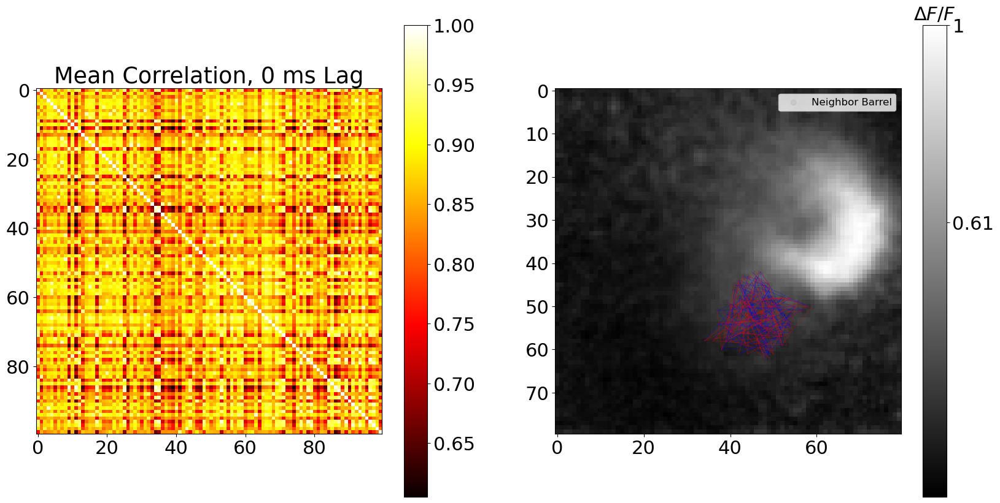

Date:  12/23/2024 Slice:  2 Location:  2
Avg corr shape:  (13, 100, 100)
Avg corr shape:  (13, 100, 100)
Distance cutoff: 20, Correlation cutoff: 0.711130942931865
Distance cutoff: 20, Correlation cutoff: 0.711130942931865


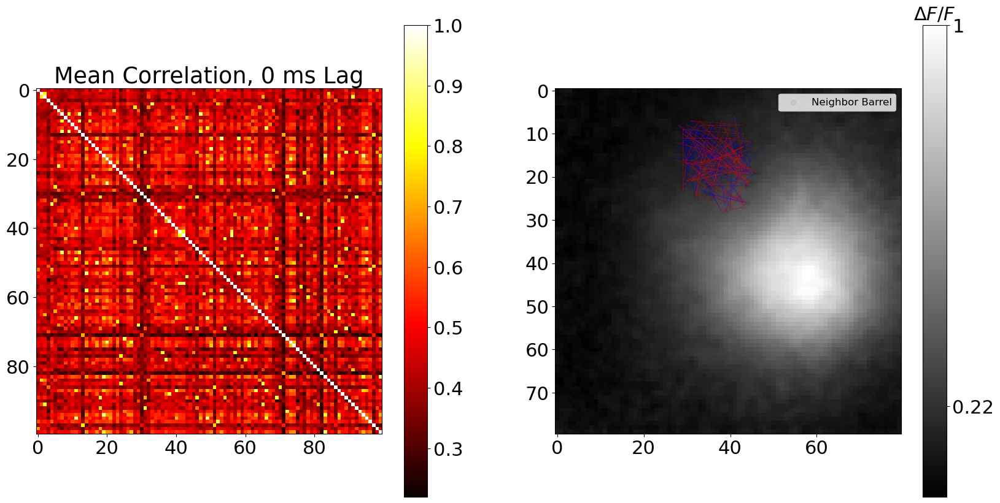

Date:  1/15/2025 Slice:  1 Location:  3
Avg corr shape:  (13, 100, 100)
Avg corr shape:  (13, 100, 100)
Distance cutoff: 20, Correlation cutoff: 0.6763605341621218
Distance cutoff: 20, Correlation cutoff: 0.6763605341621218


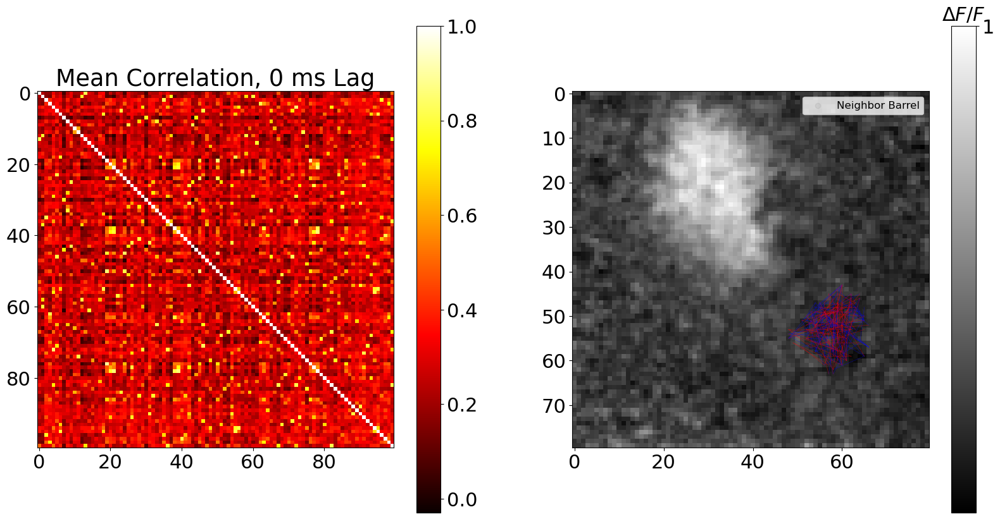

Date:  1/15/2025 Slice:  3 Location:  2
Avg corr shape:  (13, 100, 100)
Avg corr shape:  (13, 100, 100)
Distance cutoff: 20, Correlation cutoff: 0.724734459818747
Distance cutoff: 20, Correlation cutoff: 0.724734459818747


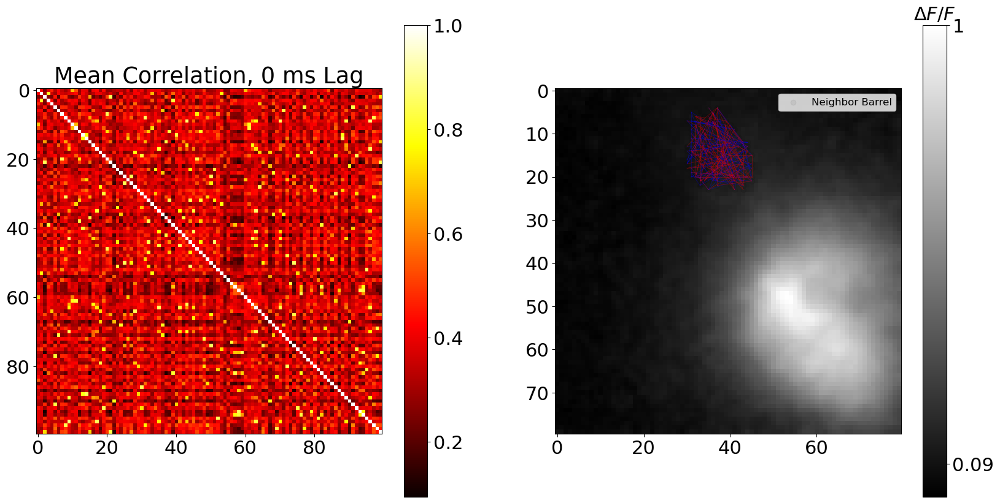

Date:  1/22/2025 Slice:  1 Location:  2
Avg corr shape:  (13, 100, 100)
Avg corr shape:  (13, 100, 100)
Distance cutoff: 20, Correlation cutoff: 0.8030916185207339
Distance cutoff: 20, Correlation cutoff: 0.8030916185207339


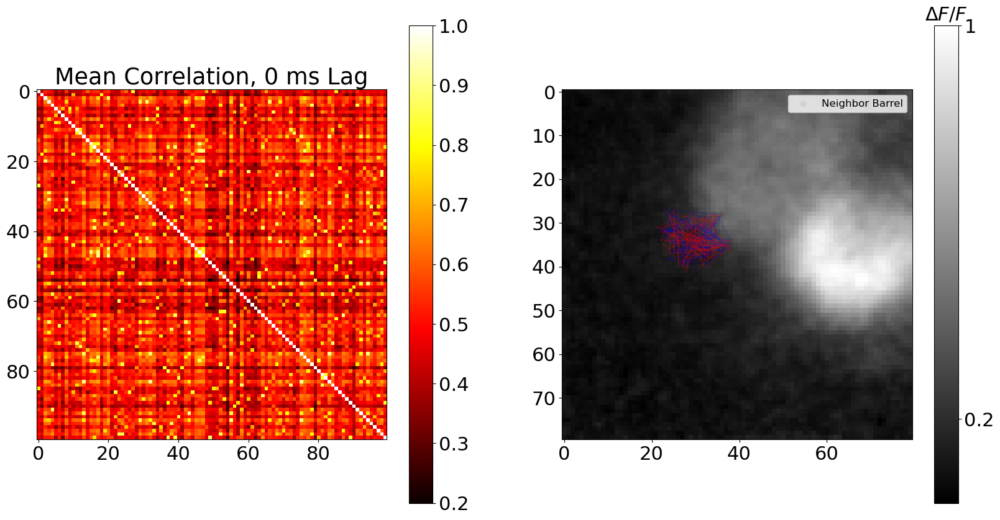

Date:  1/22/2025 Slice:  3 Location:  2
Avg corr shape:  (13, 100, 100)
Avg corr shape:  (13, 100, 100)
Distance cutoff: 20, Correlation cutoff: 0.696606026162899
Distance cutoff: 20, Correlation cutoff: 0.696606026162899


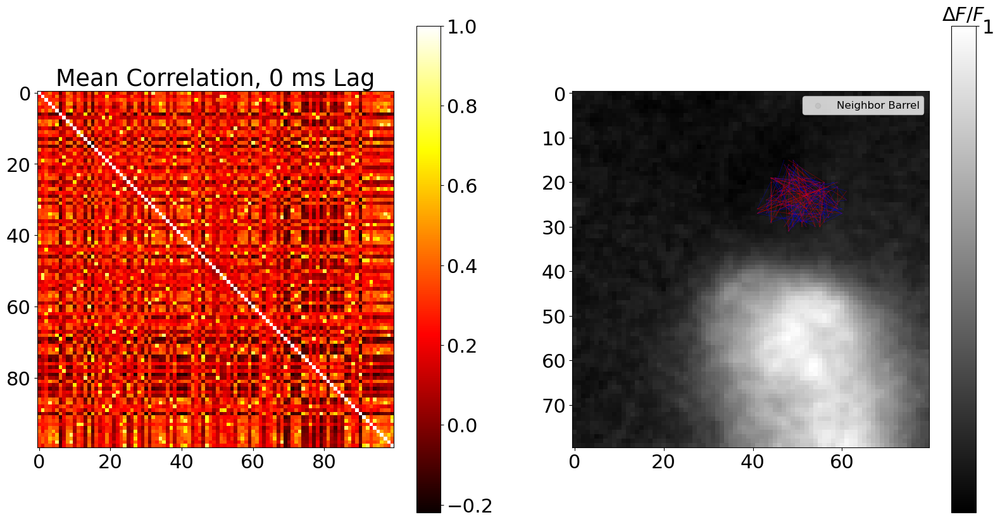

Date:  2/5/2025 Slice:  1 Location:  3
Avg corr shape:  (13, 100, 100)
Avg corr shape:  (13, 100, 100)
Distance cutoff: 20, Correlation cutoff: 0.7874261617592303
Distance cutoff: 20, Correlation cutoff: 0.7874261617592303


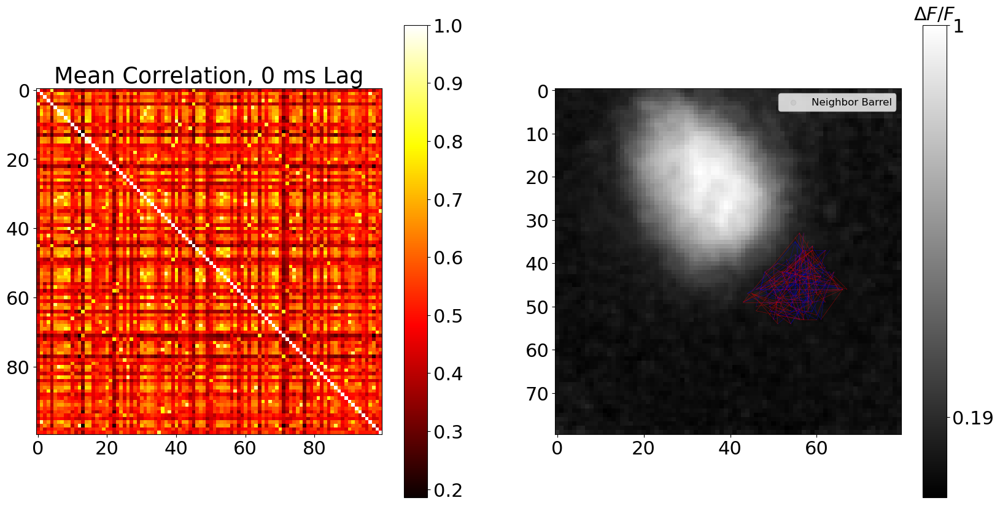

Date:  2/5/2025 Slice:  2 Location:  2
Avg corr shape:  (13, 100, 100)
Avg corr shape:  (13, 100, 100)
Distance cutoff: 20, Correlation cutoff: 0.9406751011677058
Distance cutoff: 20, Correlation cutoff: 0.9406751011677058


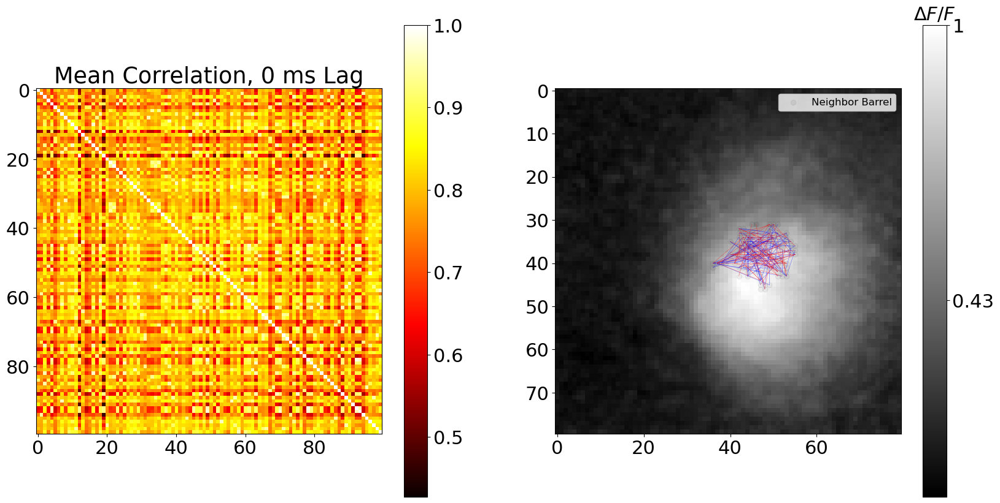

Date:  4/16/2025 Slice:  1 Location:  1
Avg corr shape:  (13, 100, 100)
Avg corr shape:  (13, 100, 100)
Distance cutoff: 20, Correlation cutoff: 0.9095713000894429
Distance cutoff: 20, Correlation cutoff: 0.9095713000894429


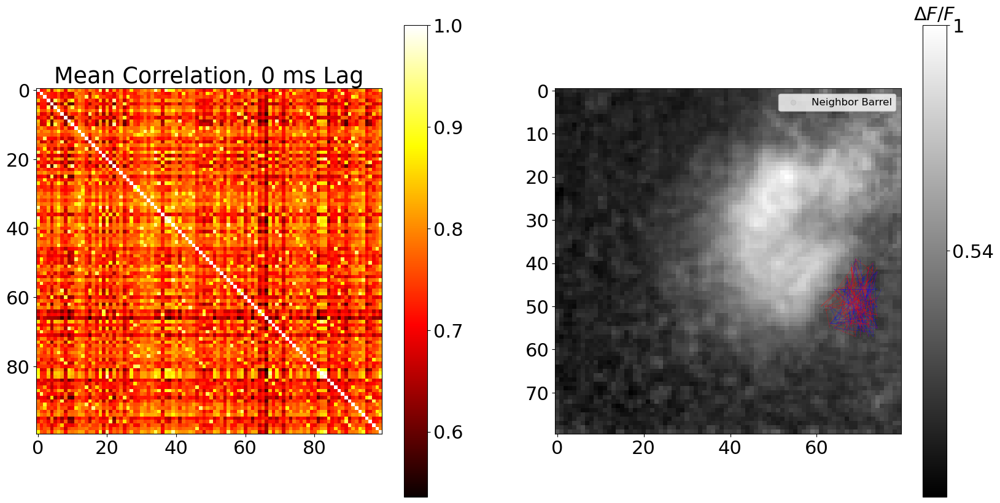

Date:  4/16/2025 Slice:  2 Location:  2
Avg corr shape:  (6, 100, 100)
Avg corr shape:  (6, 100, 100)
Distance cutoff: 20, Correlation cutoff: 0.8992167886155857
Distance cutoff: 20, Correlation cutoff: 0.8992167886155857


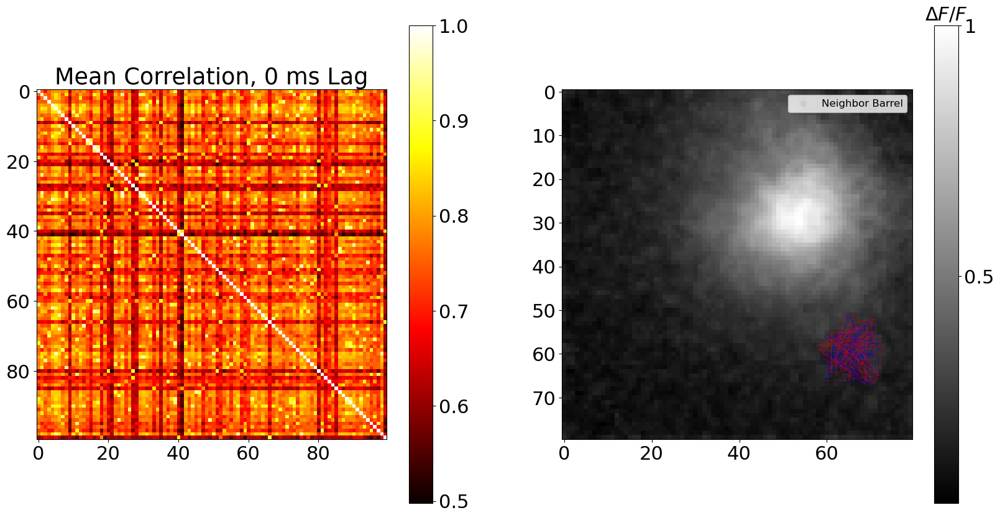

No corr_matrices_by_slice for this date/slice/location
Date:  4/9/2025 Slice:  1 Location:  2
Avg corr shape:  (8, 100, 100)
Avg corr shape:  (8, 100, 100)
Distance cutoff: 20, Correlation cutoff: 0.923631016690601
Distance cutoff: 20, Correlation cutoff: 0.923631016690601


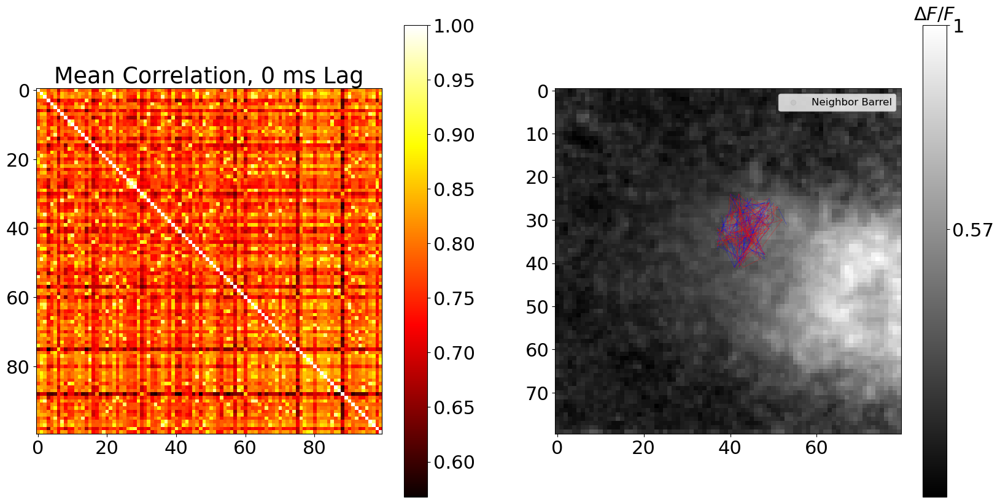

Date:  4/9/2025 Slice:  2 Location:  2
Avg corr shape:  (12, 100, 100)
Avg corr shape:  (12, 100, 100)
Distance cutoff: 20, Correlation cutoff: 0.9090588953279132
Distance cutoff: 20, Correlation cutoff: 0.9090588953279132


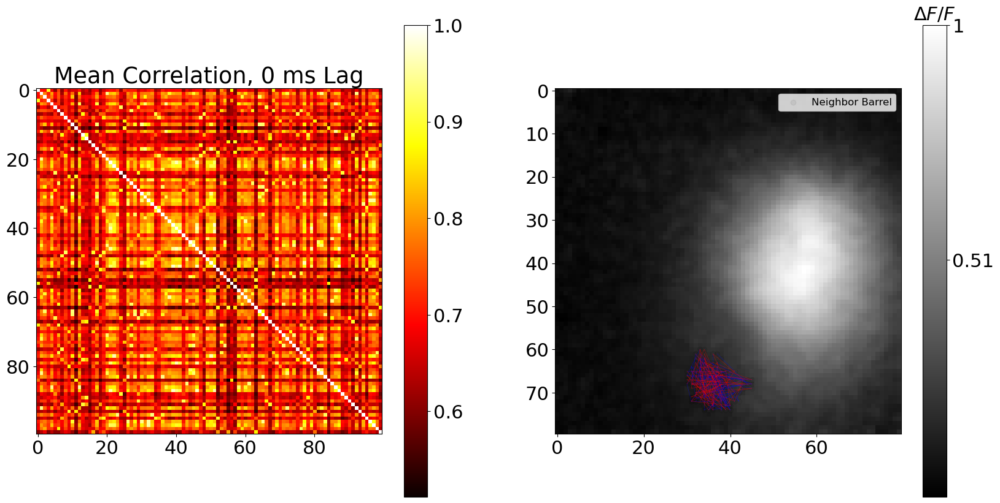

Date:  4/9/2025 Slice:  3 Location:  2
Avg corr shape:  (13, 100, 100)
Avg corr shape:  (13, 100, 100)
Distance cutoff: 20, Correlation cutoff: 0.923422105728266
Distance cutoff: 20, Correlation cutoff: 0.923422105728266


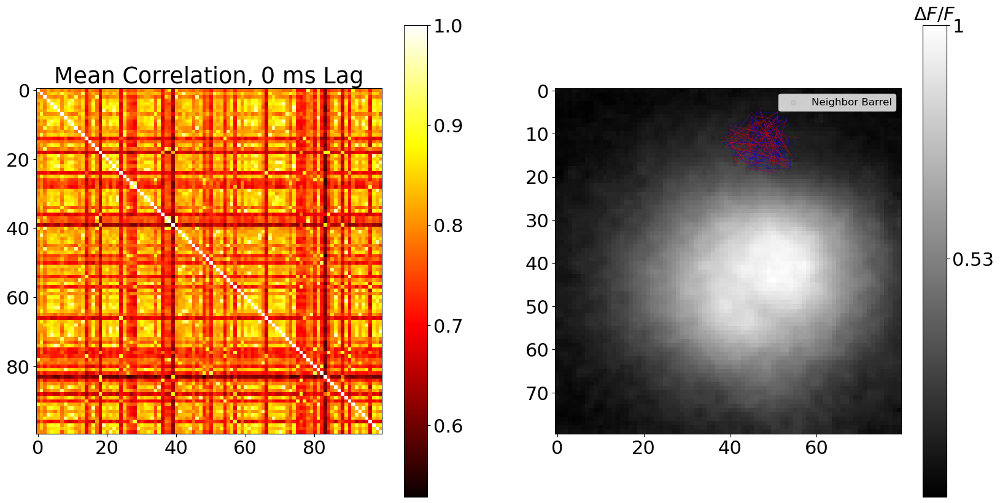

Date:  4/9/2025 Slice:  4 Location:  2
Avg corr shape:  (13, 100, 100)
Avg corr shape:  (13, 100, 100)
Distance cutoff: 20, Correlation cutoff: 0.8512498125473121
Distance cutoff: 20, Correlation cutoff: 0.8512498125473121


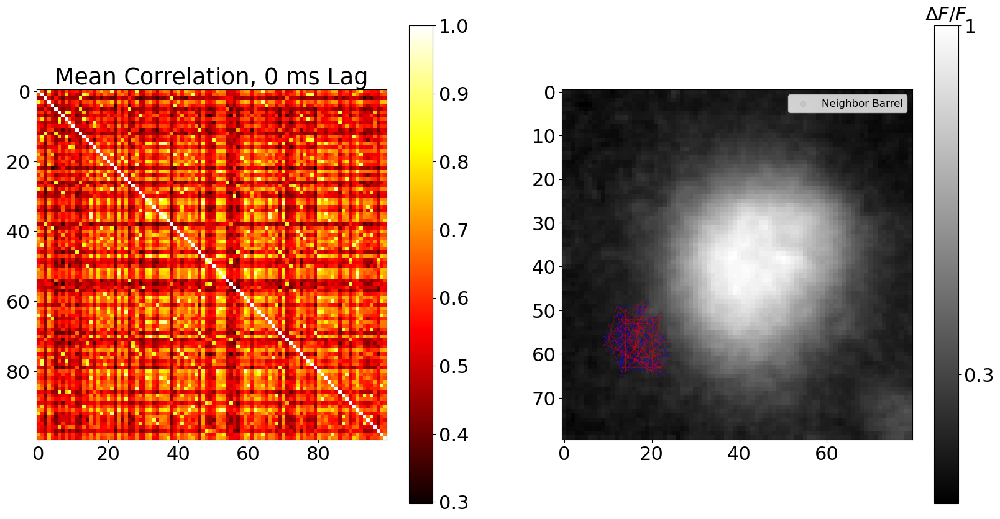

In [62]:
# Plot the correlation distances but
# now with the cutoffs applied
distance_vs_corr_cutoff = {0: {}, 1: {}}
node_degree_dist_cutoff = {0: {}, 1: {}}

for date in ppr_df['Date'].unique():
    date_df = ppr_df[ppr_df['Date'] == date]
    if date not in corr_matrices_by_slice:
        print("No corr_matrices_by_slice for this date")
        continue
    for slic in date_df['Slice'].unique():
        slic_df = date_df[date_df['Slice'] == slic]
        for loc in slic_df['Location'].unique():
            loc_df = slic_df[slic_df['Location'] == loc]
            slic_loc_id = f"{slic}_{loc}"
            if slic_loc_id not in corr_matrices_by_slice[date]:
                print("No corr_matrices_by_slice for this date/slice/location")
                continue
            if date not in distance_vs_corr_cutoff[0]:
                distance_vs_corr_cutoff[0][date] = {}
                distance_vs_corr_cutoff[1][date] = {}
            if slic_loc_id not in distance_vs_corr_cutoff[0][date]:
                distance_vs_corr_cutoff[0][date][slic_loc_id] =  {'distance': [], 'corr': []}
                distance_vs_corr_cutoff[1][date][slic_loc_id] =  {'distance': [], 'corr': []}
            if date not in node_degree_dist_cutoff[0]:
                node_degree_dist_cutoff[0][date] = {}
                node_degree_dist_cutoff[1][date] = {}
            if slic_loc_id not in node_degree_dist_cutoff[0][date]:
                node_degree_dist_cutoff[0][date][slic_loc_id] = {0: {},
                                                               1: {}}
                node_degree_dist_cutoff[1][date][slic_loc_id] = {0: {},
                                                               1: {}}

            print("Date: ", date, "Slice: ", slic, "Location: ", loc)

            ppr_barrel_subset = ppr_barrel_df[(ppr_barrel_df['Date'] == date) &
                    (ppr_barrel_df['Slice'] == slic) &
                    (ppr_barrel_df['Location'] == loc)]
            if len(ppr_barrel_subset) == 0:
                print("No ppr_barrel_df for this date/slice/location")
                continue
            
            # look up the amp_array in ppr_barrel_df
            amp_array = ppr_barrel_subset['amp_array'].values[0]
            amp_array = read_array_file(amp_array)

            # get roi_file for this recording
            roi_file_barrel_1 = loc_df[loc_df['ROI_Set'].str.contains('rand_1')]['ROI_File'].values[0]
            
            # read the roi file (barrel 1)
            rois_1 = ROIFileReader(roi_file_barrel_1).get_roi_list()
            rois_1 = [LaminarROI(r, input_diode_numbers=True)
                    for r in rois_1]
            rois_points1 = [roi.get_points() for roi in rois_1]
            
            # now get the correlation matrix for this date/slice/location
            avg_corr = {0: [], 1: []}
            for pulse_number in [0, 1]:
                for ipi in corr_matrices_by_slice[date][slic_loc_id].keys():
                
                    try:
                        avg_corr[pulse_number].append(corr_matrices_by_slice[date][slic_loc_id][ipi][control_or_ppr_type][optimal_lag])
                    except IndexError:
                        print("IndexError: ", ipi, control_or_ppr_type, optimal_lag, i_slice)
                        print('len(corr_matrices_by_slice[date][slic_loc_id][ipi][control_or_ppr_type][optimal_lag]): ',
                            len(corr_matrices_by_slice[date][slic_loc_id][ipi][control_or_ppr_type][optimal_lag]))
                        continue
                avg_corr[pulse_number] = np.array([ac[1] for ac in avg_corr[pulse_number]])
                avg_corr[pulse_number] = np.array(avg_corr[pulse_number]).reshape(-1, 100, 100)
                print("Avg corr shape: ", avg_corr[pulse_number].shape)
                avg_corr[pulse_number] = np.mean(avg_corr[pulse_number], axis=0)
            
            if avg_corr[0].shape[0] < 10 or avg_corr[1].shape[0] < 10:
                print("Avg corr shape is too small: ", avg_corr.shape)
                continue

            # plot the amp_array and overlay the ROIs. 2 subplots
            fig, ax = plt.subplots(1, 2, figsize=(20, 10))
            ax[1].imshow(amp_array, cmap='gray', interpolation='nearest')

            # colorbar for the amp_array
            cbar = plt.colorbar(ax[1].imshow(amp_array, cmap='gray',
                     interpolation='nearest', vmin=np.min(amp_array), 
                     vmax=np.max(amp_array)), ax=ax[1])

            cbar.set_ticks([np.min(amp_array), np.max(amp_array)])
            cbar.set_ticklabels([str(round(np.min(amp_array), 2)), 
                                str(round(np.max(amp_array), 2))])
            cbar.ax.set_title(r'$\Delta F/F$', fontsize=22)            
            
            # plot the ROIs
            for roi in rois_points1:
                ax[1].scatter(roi[0][0], roi[0][1], color='black', alpha=0.05, label='Neighbor Barrel')
            
            handles = [h for i, h in enumerate(ax[1].get_legend_handles_labels()[0]) if i % 2 == 0]
            labels = [l for i, l in enumerate(ax[1].get_legend_handles_labels()[1]) if i % 2 == 0]
            ax[1].legend(handles=[handles[0]], labels=[labels[0]],
                         loc='upper right', fontsize=12)

            # percentile threshold the avg_corr matrix to remove low values
            subset_df = cutoff_df[(cutoff_df['Date'] == date) &
                                    (cutoff_df['Slice_Loc'] == slic_loc_id)]
            if subset_df.empty:
                print(f"No cutoff values for date {date} and slice/location {slic}")
                continue
            dist_cutoff = subset_df['Distance_cutoff'].values[0]

            # perecentile cutoff for the correlation values that are above the distance cutoff
            for pulse_number in [0, 1]:
                percentile_threshold = 0.97
                corr_cutoff = np.percentile(avg_corr[pulse_number], percentile_threshold * 100)
                print(f"Distance cutoff: {dist_cutoff}, Correlation cutoff: {corr_cutoff}")

                for i_1, roi_1 in enumerate(rois_points1):
                    for i_2 in range(i_1 + 1, len(rois_points1)):
                        roi_2 = rois_points1[i_2]

                        corr = avg_corr[pulse_number][i_1, i_2]
                        x0, y0 = roi_1[0][0], roi_1[0][1]
                        x1, y1 = roi_2[0][0], roi_2[0][1]

                        # track these nodes' degrees (weighted by correlation value)
                        key_roi1 = f"{x0}_{y0}"

                        # track the distribution of edge distances and correlation values
                        px_dist = np.sqrt((x0 - x1) ** 2 + (y0 - y1) ** 2)

                        if px_dist * um_per_px < dist_cutoff:
                            continue
                        if corr < corr_cutoff:
                            if random.random() > 0.02:
                                continue

                        # sum that node's row in the avg_corr matrix
                        node_degree_dist_cutoff[pulse_number][date][slic_loc_id][1][key_roi1] = np.mean(list(avg_corr[pulse_number][i_1, :i_1]) + list(avg_corr[pulse_number][i_1, i_1 + 1:]))

                        # track the distribution of edge distances and correlation values
                        distance_vs_corr_cutoff[pulse_number][date][slic_loc_id]['distance'].append(px_dist)
                        distance_vs_corr_cutoff[pulse_number][date][slic_loc_id]['corr'].append(corr)
                        
                        color = plt.cm.hot(corr)
                        pulse_color = 'blue' if pulse_number == 0 else 'red'
                        # plot the line between the two ROIs with outline on line
                        ax[1].plot([x0, x1], [y0, y1], color=pulse_color, linewidth=0.4, alpha=0.5)

            # plot the avg corr matrix on the left
            ax[0].imshow(avg_corr[0], cmap='hot', interpolation='nearest',
                    vmin=np.min(avg_corr[0]), vmax=1)
            ax[0].set_title(f"Mean Correlation, {optimal_lag} ms Lag")

            plt.colorbar(ax[0].imshow(avg_corr[0], cmap='hot', interpolation='nearest',
                    vmin=np.min(avg_corr[0]), vmax=1), ax=ax[0])
            # label colorbar with correlation values
            cbar.set_ticks([np.min(avg_corr[0]), 1])
            cbar.set_ticklabels([str(round(np.min(avg_corr[0]), 2)), 
                                str(1)])
            formatted_date = date.replace('/', '-')
            plt.savefig(f"{output_fig_dir}/{formatted_date}_{slic_loc_id}_"
                        f"static_fc_cutoff_corr-rois_intrabarrel_pulse2.png")
            plt.show()



Date: 12/23/2024, Slice/Location: 1_3
[0.8767239019803388, 0.8569443403694346, 0.8720544408652005, 0.8838407646017108, 0.9008429712470819, 0.8711092275106952, 0.8860560357086414, 0.872489378618418, 0.8937926595261749, 0.8226442533566274, 0.883807613165771, 0.803435205851519, 0.8884632057138093, 0.8276077956345944, 0.867534748541233, 0.895156347140687, 0.8914721938828792, 0.8429986766911058, 0.894275556920276, 0.8645724834882199, 0.879577958952637, 0.8713956850028794, 0.8829789317373736, 0.8808230782068068, 0.8989970581426895, 0.8380148427136002, 0.8287608222569953, 0.8930733490140782, 0.8663249260818804, 0.8859425477031683, 0.8534452364987617, 0.885785850083255, 0.8737404036797509, 0.8385231770679685, 0.8239699306328939, 0.8437986484083863, 0.8358126106753835, 0.8719951543838356, 0.8437377298813531, 0.8086163977203344, 0.8800053816367196, 0.8263761689355935, 0.8874308001916135, 0.8716730447826403, 0.8795404690427906, 0.8785640217168916, 0.8408019474758609, 0.8357306328399182, 0.8852467

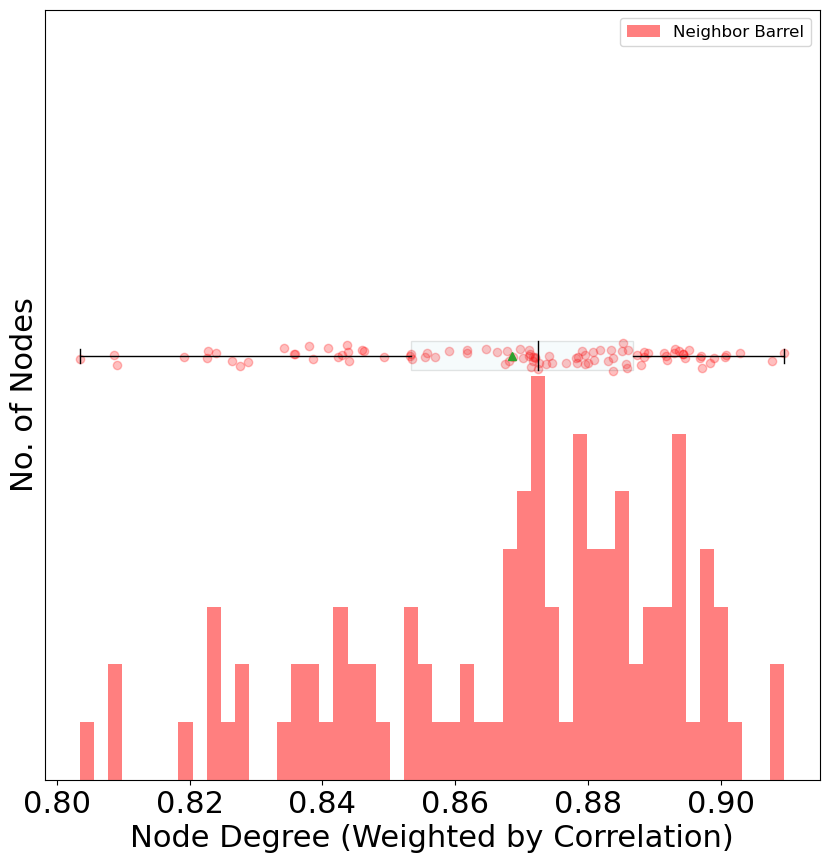

Date: 12/23/2024, Slice/Location: 2_2
[0.47408827518174324, 0.4907413866599567, 0.4951587364354182, 0.4361172226133761, 0.49955141748214776, 0.4843386896412047, 0.4814096662105907, 0.5080639897383837, 0.4916146011664711, 0.4963017399245597, 0.5323840331459747, 0.541245657870267, 0.5070690782449088, 0.42049427673015777, 0.5268779688005353, 0.4726461788150755, 0.5257767685768983, 0.5360588676827078, 0.4862936383053009, 0.5655151774641684, 0.5630030187630473, 0.5466453992149056, 0.484976864792864, 0.534763369491211, 0.42600144015836655, 0.5165832828573583, 0.5498995140244973, 0.5517772855349783, 0.4857124638129911, 0.4499481828660066, 0.38373981181259736, 0.4722951975719012, 0.4718247565095618, 0.5162907357033015, 0.5039702804898903, 0.4971145808754211, 0.4971697364915203, 0.5498624448992866, 0.5204262617694942, 0.5158818949440876, 0.5309248763103681, 0.49317345891726966, 0.5128098445640065, 0.4785134107978943, 0.4966933003303762, 0.4989831667990686, 0.46961769901102546, 0.510611848162148

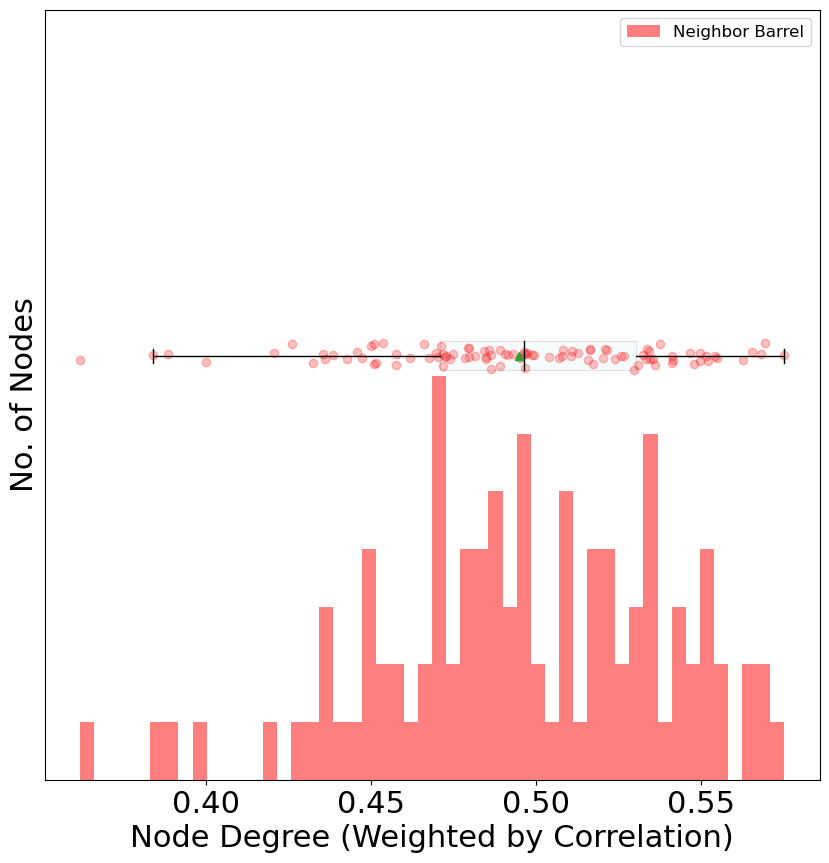

Date: 1/15/2025, Slice/Location: 1_3
[0.24917628226161412, 0.2750446545844065, 0.2956570935324739, 0.2921025448505627, 0.3126387482022687, 0.3177502749521045, 0.30195059768947097, 0.24817313554741496, 0.3075193588291698, 0.2768572598164149, 0.2494224940887395, 0.25877731664632164, 0.25971863809776663, 0.26511949483660324, 0.2699564115391934, 0.3073277459045851, 0.2721183605810111, 0.28725093502925, 0.29093327700393534, 0.25154136587180576, 0.3346467801935424, 0.2651719488996331, 0.2844978591667687, 0.3008679015915931, 0.2762007849438651, 0.3021163831625682, 0.3495758577813673, 0.2903632373610125, 0.31748589206475925, 0.3032403440722708, 0.25813185157601193, 0.34210664364726856, 0.3002291839887285, 0.2779427107781061, 0.2654551106593675, 0.30260216368222825, 0.3142876095130891, 0.27237016251211416, 0.30193974028743004, 0.29812115508625475, 0.29386447105617153, 0.328667916082075, 0.3580211364823473, 0.2678411738755732, 0.25787922626956, 0.2966835576672873, 0.283941335994969, 0.2697624749

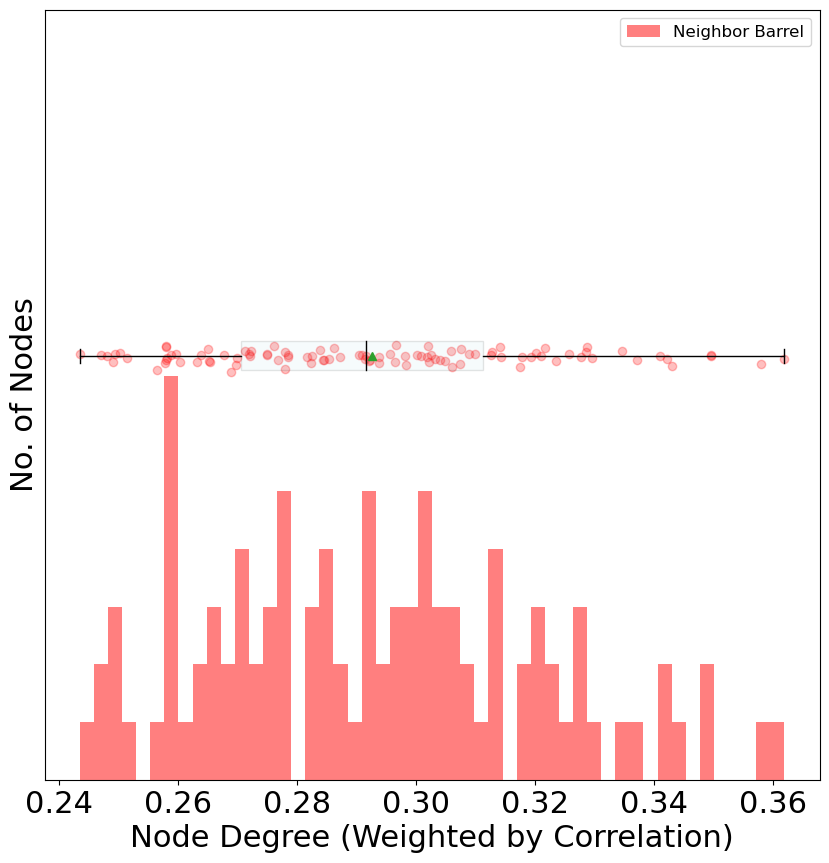

Date: 1/15/2025, Slice/Location: 3_2
[0.43741902471923116, 0.4253592882057632, 0.38011178048882666, 0.40807173208236086, 0.4106734444913436, 0.45146559674914966, 0.42361401452110325, 0.4359985416919563, 0.42434821294176284, 0.4626562777663453, 0.437784169915685, 0.4276602026589489, 0.44538304129033035, 0.457746662438063, 0.45483163414618155, 0.4132279664599959, 0.445009156455403, 0.46467123312262726, 0.3857122719625352, 0.4528571535450886, 0.4249594635141423, 0.4065800217984764, 0.344899705783404, 0.4285290055315482, 0.42239463064179844, 0.40803585115821117, 0.45005663643940064, 0.4169510631916598, 0.4190467689555596, 0.4686400222711095, 0.4557006957850826, 0.4197926977662047, 0.43975650910395153, 0.4204131143254797, 0.43500220726544997, 0.46731520802388626, 0.41844416963306724, 0.38890845093692256, 0.4168367263390077, 0.3969820773263193, 0.45077858343125543, 0.4687799529075544, 0.37940576221201927, 0.46783488947553364, 0.43170186245223985, 0.4830534088600084, 0.408058099529392, 0.4587

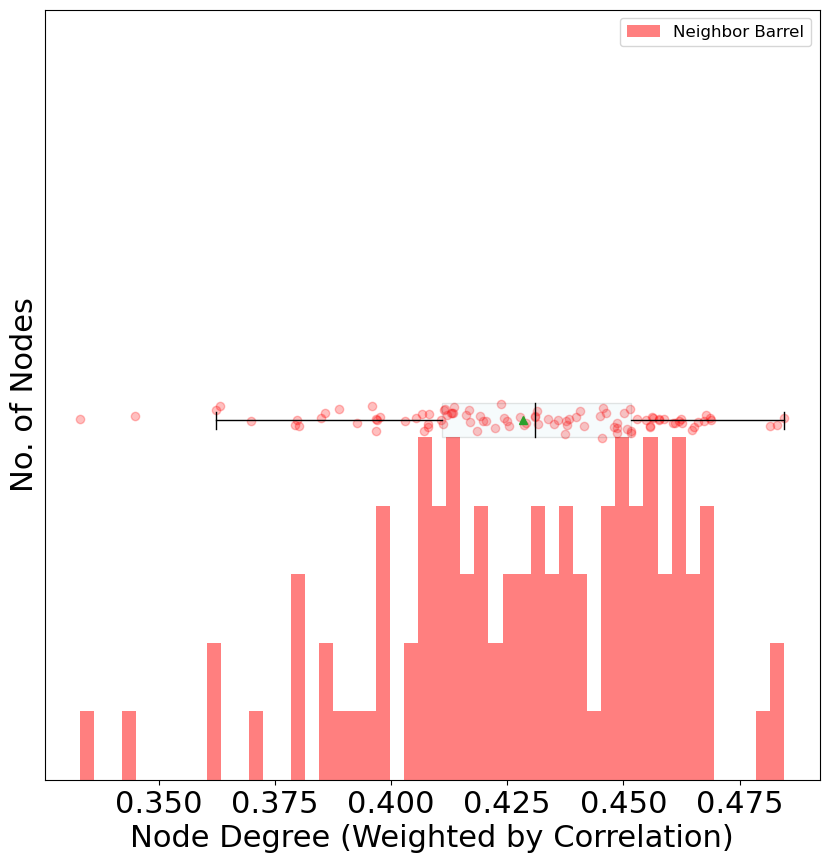

Date: 1/22/2025, Slice/Location: 1_2
[0.5112431362569241, 0.4377539242584072, 0.6034505721721011, 0.5785112944824885, 0.5475397031860161, 0.48311339668820896, 0.533542679432748, 0.47037078460757753, 0.5956721413636785, 0.4935560203857677, 0.5156354159478678, 0.5414497170657074, 0.5255593512085459, 0.5926216921828567, 0.5102369918704989, 0.5724766182189109, 0.5723384771457106, 0.5970534893486661, 0.4862467196213683, 0.5562024410796896, 0.6008178793756549, 0.5130122529941653, 0.5219717577954107, 0.5493261171130465, 0.5462340184047082, 0.5065023997427511, 0.5288672417498176, 0.5176022595996532, 0.4879452041915809, 0.5751941744135521, 0.5372240931136888, 0.5859285670081101, 0.6064381962012891, 0.5794766347229432, 0.4755290355025374, 0.5360582162698342, 0.49610634730191094, 0.5479668210709611, 0.5689561359754234, 0.5570083968326786, 0.5207017374726447, 0.4813533324635271, 0.5881954554814667, 0.5958631914575279, 0.5098263386944776, 0.5960409181215722, 0.5724033742945043, 0.5920553622359972, 

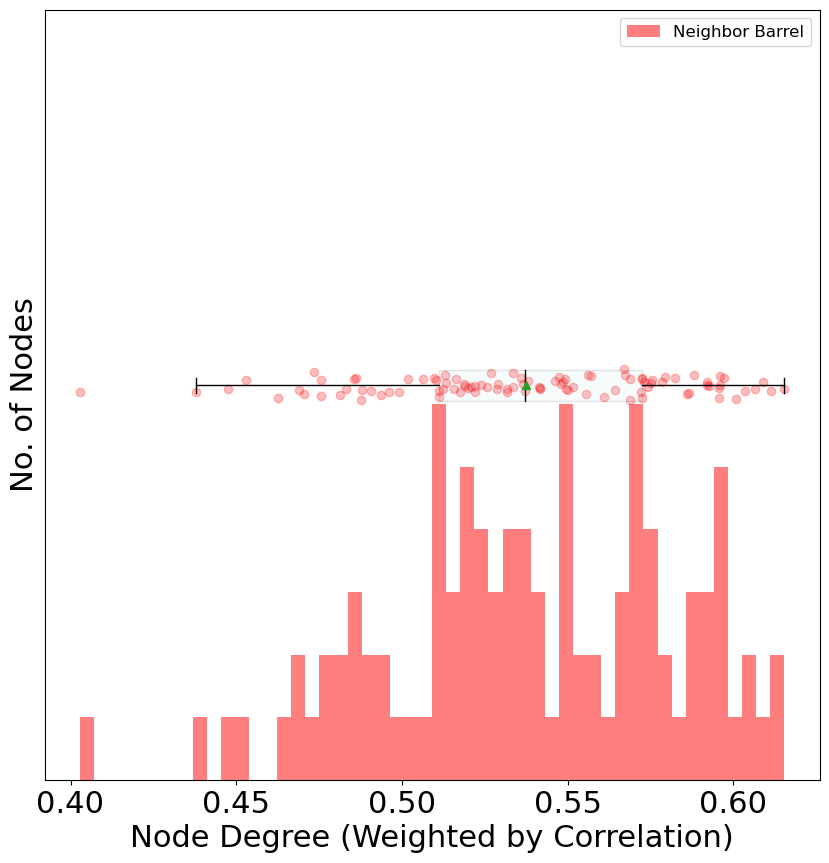

Date: 1/22/2025, Slice/Location: 3_2
[0.3197519089953584, 0.33811517671589403, 0.3436670439214516, 0.31800471926871937, 0.2957836922754586, 0.33585367833762086, 0.19080017887821862, 0.17450723849068037, 0.3252967326461052, 0.32955539194084493, 0.2975806142939597, 0.32053066207926584, 0.312520466455258, 0.23592098799171896, 0.28443416700188373, 0.21143963126014428, 0.33145383702762393, 0.3255883057989912, 0.22071997620602785, 0.34339850655647, 0.2660249194685012, 0.2787978632647916, 0.33193270445431283, 0.3212902660292751, 0.30843147665177484, 0.25859247916482103, 0.2973267447688208, 0.2991735640090285, 0.33118788365654794, 0.2651380585941134, 0.318721283292393, 0.19572648605094417, 0.3132064259384648, 0.3155131410420099, 0.32441821697941886, 0.332224867939968, 0.3134805195028894, 0.33099044754712653, 0.22859683225339247, 0.277262290577959, 0.33363146691919776, 0.3146782693948661, 0.3423203659134463, 0.2814535039385386, 0.32187375903308146, 0.3066318898736375, 0.23114623801547568, 0.343

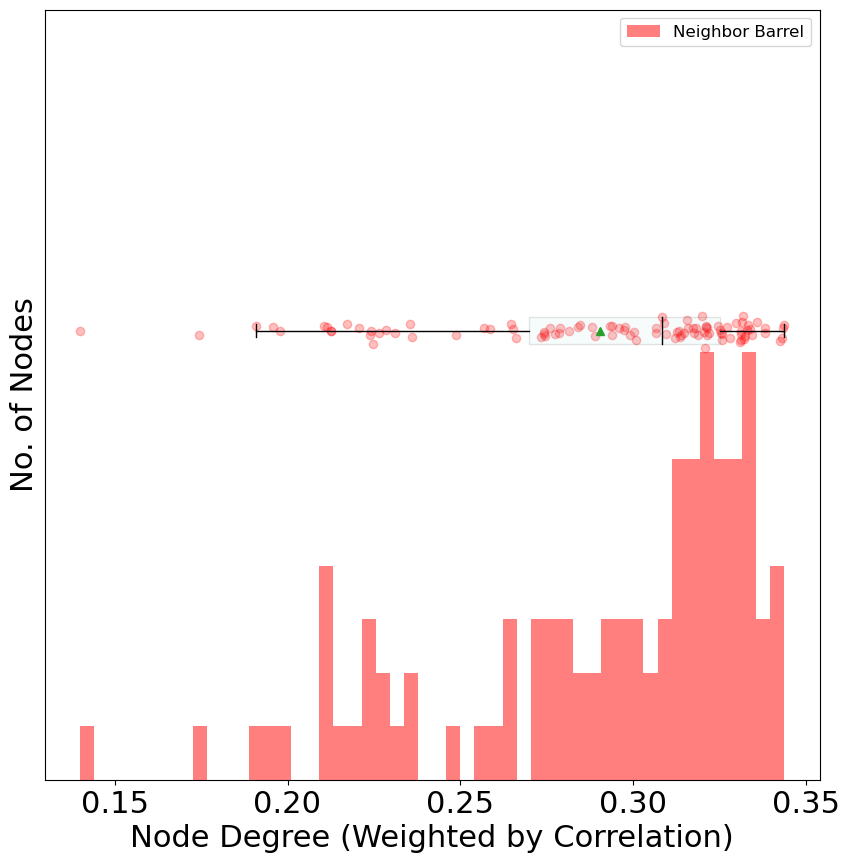

Date: 2/5/2025, Slice/Location: 1_3
[0.48378243731509457, 0.6093115918748342, 0.5579794506259488, 0.6009038773566449, 0.48727777345903356, 0.6387192528977178, 0.621565059105998, 0.6175781955963218, 0.6109367130631141, 0.5906907627453888, 0.5388855738845801, 0.5215517639681382, 0.572028062168816, 0.42753001641404015, 0.60592871629427, 0.6067628086319391, 0.5031900412189098, 0.5130837570137505, 0.5899706611739287, 0.5756835608461331, 0.6209280833868964, 0.5553731559592942, 0.4324398896802443, 0.5440949039017068, 0.6282587258898136, 0.5399806028057761, 0.6252173919249843, 0.4891491916271625, 0.5895260820420739, 0.5368412606525886, 0.6273321252346291, 0.599535733240361, 0.6532004913394356, 0.62973510900473, 0.5915562137837759, 0.5314258352187586, 0.5884063409811524, 0.6356517392256413, 0.6033688743617667, 0.4960001928053511, 0.5858382337950465, 0.5283105017644063, 0.6072162818475808, 0.5689445494431868, 0.48832031283986194, 0.4718841572620267, 0.5670284779337077, 0.636151661756377, 0.57596

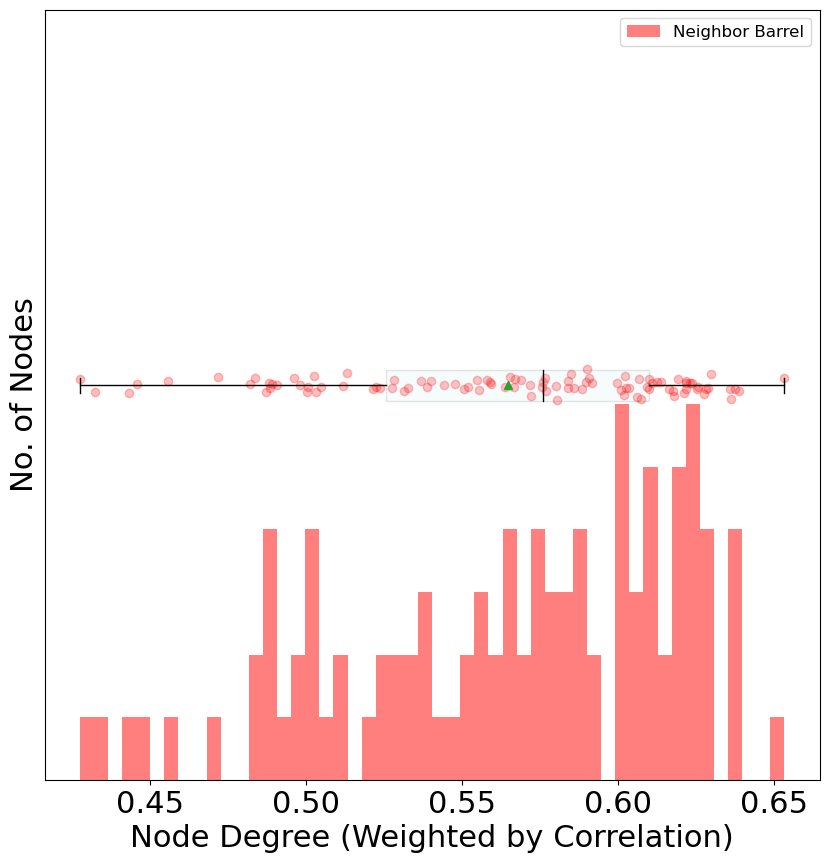

Date: 2/5/2025, Slice/Location: 2_2
[0.7898253153343813, 0.7935586764571617, 0.8421925439917263, 0.8109856310201632, 0.8235543446466405, 0.7728240292587967, 0.8193721764883185, 0.8621182113423561, 0.8115269153039552, 0.8486099325673717, 0.8400877108587408, 0.8586321559181137, 0.7114793212083609, 0.8311787236906368, 0.7691874682291855, 0.7863062538436579, 0.8347755791695618, 0.7954645405577764, 0.8653043243762771, 0.6970689175441033, 0.8527113473376552, 0.8139071602783973, 0.8230886451625978, 0.8364525467021479, 0.8134260819039794, 0.8224839594268102, 0.843893243136241, 0.860351179916459, 0.8516825813163664, 0.845985475346637, 0.8241194397730298, 0.8264561561296823, 0.8081061923285239, 0.8176761681244172, 0.8407944484253637, 0.8184763006270305, 0.8310720320694491, 0.8275205126605223, 0.8508597594977378, 0.8372009252773532, 0.8614420245909842, 0.82658233788849, 0.8504815245296364, 0.8224136662900723, 0.8194818564257237, 0.8400507054162986, 0.8633143246272893, 0.8150808142943543, 0.840329

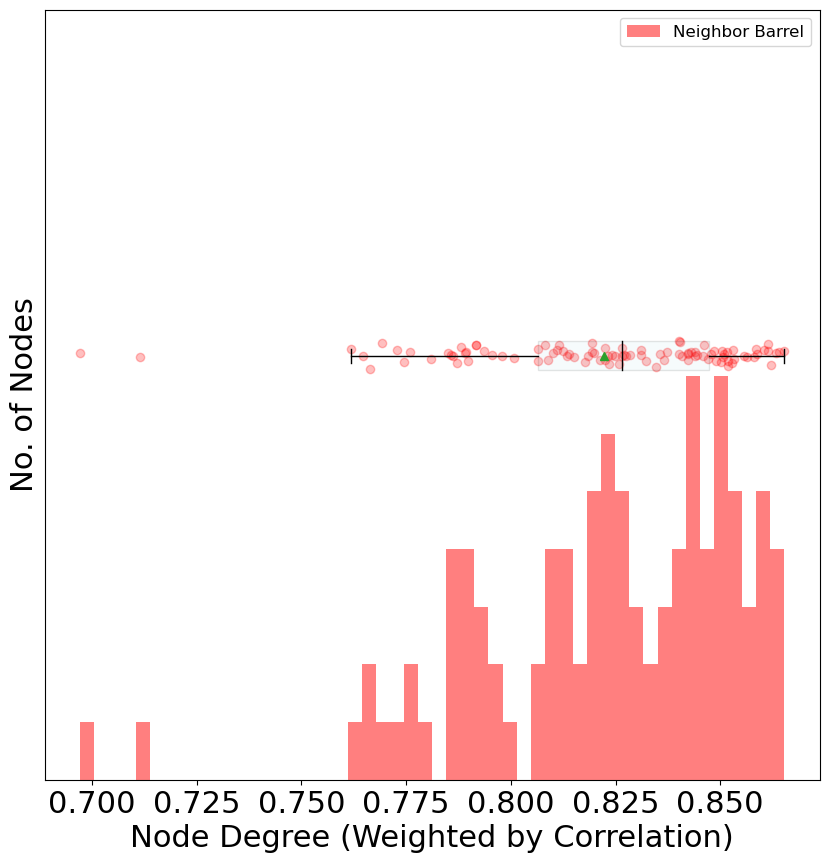

Date: 4/16/2025, Slice/Location: 1_1
[0.8056284721539674, 0.783602080537815, 0.7796764632464445, 0.7941088670517107, 0.7244220170570895, 0.7873762359244803, 0.8156438343158672, 0.7658777611639411, 0.7361483504636371, 0.7662479947126295, 0.779443324224054, 0.7912144218340421, 0.8134359011749674, 0.7868395112010625, 0.7792640361688786, 0.7600949262807866, 0.7957476582558006, 0.7768721261277465, 0.8176322130954724, 0.7263353503964641, 0.810821410947868, 0.7411902639767749, 0.7817940487013354, 0.7674443013681944, 0.8063688145272484, 0.7306661386286577, 0.7779222773805371, 0.8018263761578625, 0.7642210840026084, 0.7801191346584695, 0.8009625546219505, 0.8058662056930453, 0.7853345276616305, 0.8100629033045628, 0.8123990321707487, 0.8016470389599176, 0.7456517567825619, 0.7929532812596559, 0.7777877818133568, 0.8218378314760243, 0.7980236831474736, 0.7819494668414442, 0.8053745360339352, 0.7850826458150522, 0.797056070191786, 0.807113154036042, 0.7716336934090479, 0.7723956871545891, 0.75978

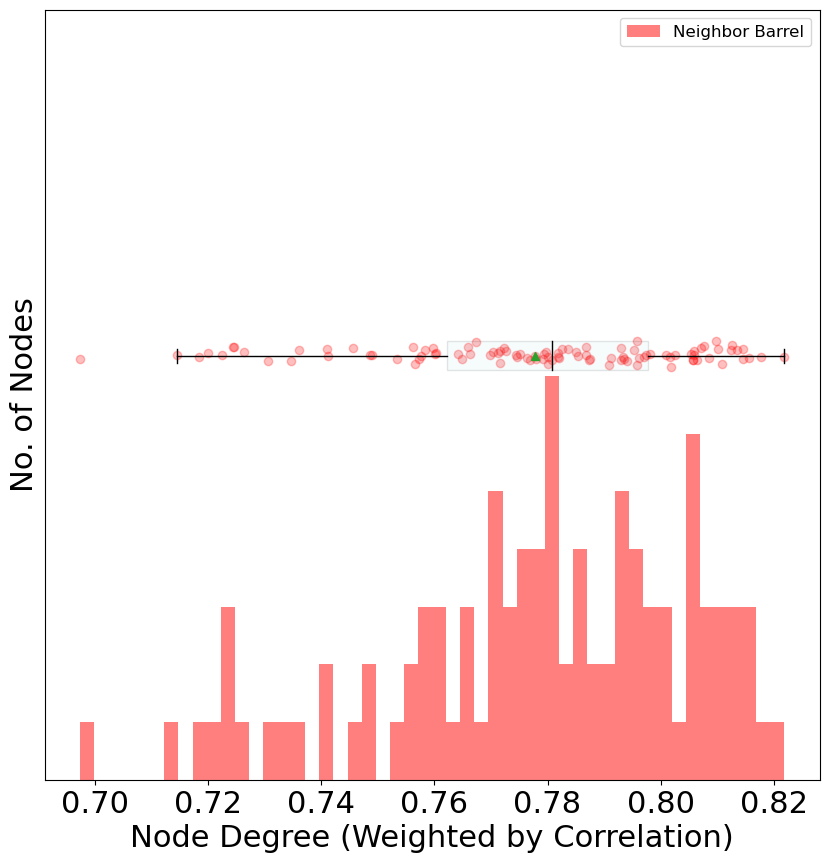

Date: 4/16/2025, Slice/Location: 2_2
[0.7830966889525067, 0.804711203689071, 0.7903791783094469, 0.7560992523501378, 0.8027696040225516, 0.819432287264298, 0.8123709671355998, 0.766210264297774, 0.7809912702073988, 0.6916249561224287, 0.7912893158027957, 0.7538954607364207, 0.7934050863360771, 0.7887820183904366, 0.7556132199946985, 0.7359121242419043, 0.7949248091760146, 0.7957100907372613, 0.6936354551697915, 0.7628501648365146, 0.7005735063447707, 0.68184336334206, 0.786904709825838, 0.7885504378355848, 0.8042764996765908, 0.7519621846022152, 0.7747603748503541, 0.6789004937626317, 0.6993933985500633, 0.7958728302345525, 0.80530456080637, 0.8013579131365742, 0.772677503622362, 0.7072465627056529, 0.7714718889125016, 0.701961435500075, 0.7777278466867464, 0.7370672536514706, 0.7814587810964744, 0.7841878605787247, 0.6493995674927181, 0.6097569111821809, 0.8078668539403167, 0.7694146279620677, 0.7996340305513335, 0.7716097904212428, 0.7923262030717211, 0.7195869120382657, 0.7574452128

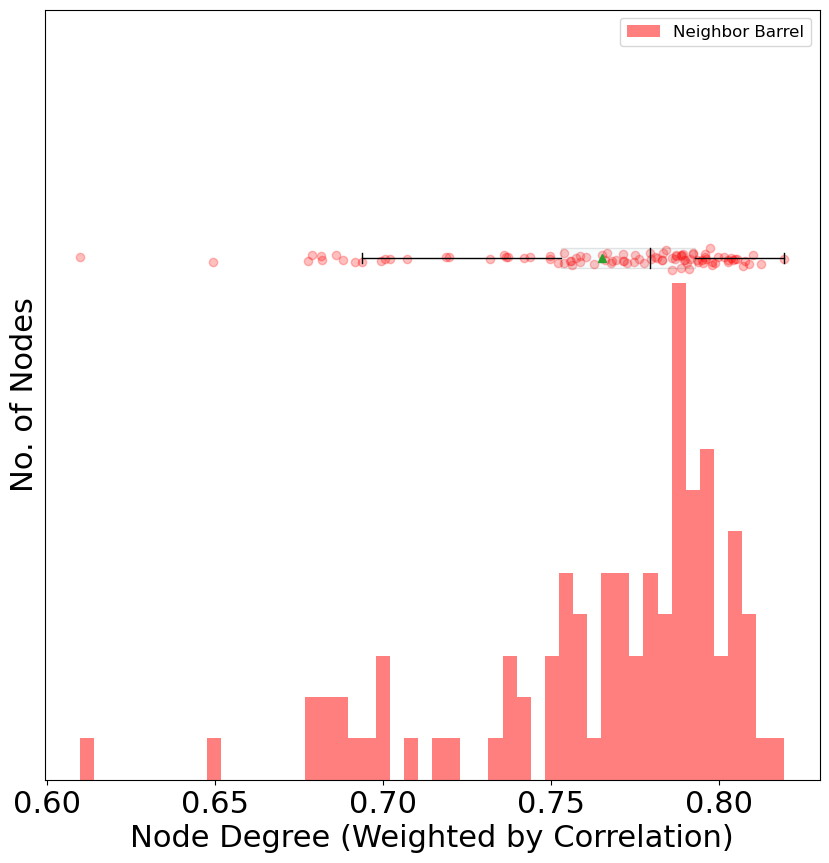

Date: 4/9/2025, Slice/Location: 1_2
[0.8123679333518021, 0.836633388313434, 0.8370187341445362, 0.7573181012255684, 0.7832285607794518, 0.8249744614387551, 0.7279931249407331, 0.8328217417446294, 0.7863983541621764, 0.811418844143966, 0.8097311398127066, 0.8191442007828277, 0.8120415659212924, 0.8147620492759723, 0.7606289096856698, 0.8364936348671868, 0.7655746750054846, 0.7881633145338985, 0.7887426513245802, 0.8179222885933781, 0.7923804057608963, 0.8119522677156837, 0.8319596909880201, 0.7904983971260432, 0.8236666696788496, 0.79222399755008, 0.7883680196511278, 0.7871354091038728, 0.7774496333609576, 0.821877398257211, 0.777533942916106, 0.8002422182927512, 0.830520872147277, 0.7657043535237974, 0.787250854560207, 0.8187079359729602, 0.8370094921918761, 0.8194859360946, 0.7930548086421529, 0.8143052383711032, 0.7735526337252473, 0.773889322023283, 0.8138148492403795, 0.805937756712943, 0.783610751915093, 0.8155115989262071, 0.8253598024891426, 0.78373825893346, 0.8221505857434375,

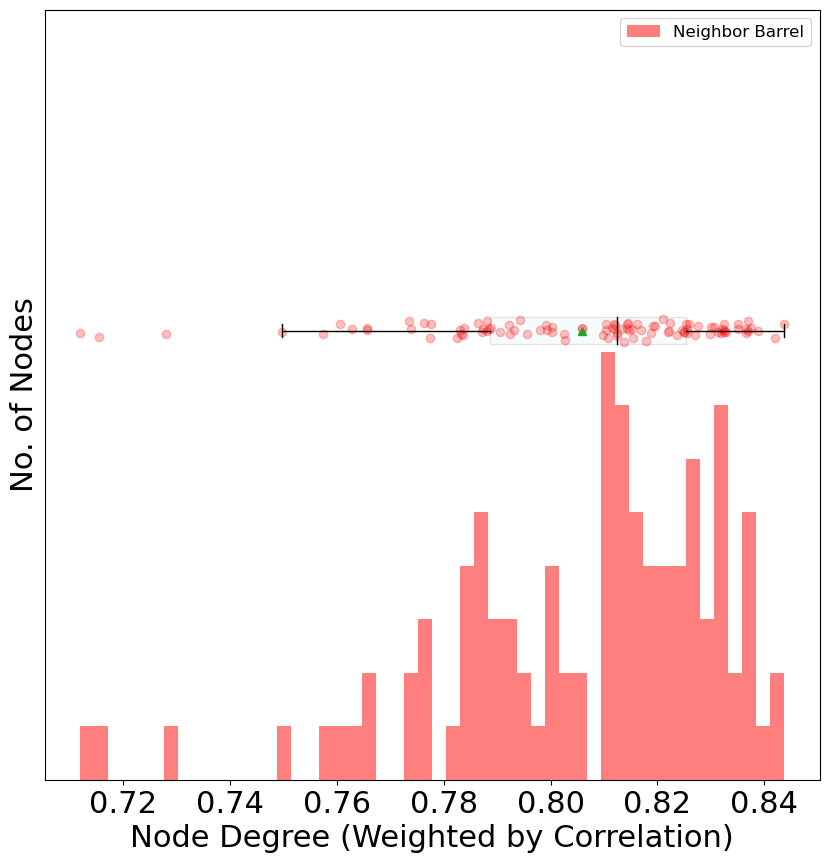

Date: 4/9/2025, Slice/Location: 2_2
[0.737471992151766, 0.7897026901850334, 0.7903191212438911, 0.7584991048115884, 0.7974357640326276, 0.7438781329327429, 0.7651736617042291, 0.7316355841093797, 0.7729466171840002, 0.7341602587650435, 0.7927208234787002, 0.6987447758084033, 0.800448220524511, 0.7347114900821289, 0.7307289164650482, 0.6881544979541915, 0.7526702319108072, 0.7952236018460536, 0.7070385522246376, 0.7549442764000801, 0.7964165409340084, 0.8063179423227257, 0.8117610168936825, 0.7941800593942321, 0.7383349098544669, 0.7180640396633471, 0.8086543509018288, 0.7730486400488427, 0.7983566485459633, 0.7529397486442384, 0.8029531128206889, 0.7880368752941186, 0.8099342216714374, 0.8027158457121152, 0.7448835401471605, 0.7610907861720716, 0.7965881738494328, 0.7930664883319364, 0.7922766298261273, 0.8012310532912024, 0.8010556052201291, 0.7902973896164613, 0.7400676809673786, 0.789167209990046, 0.7785951279442065, 0.7938124786095146, 0.8050132220171957, 0.7583221237841342, 0.7123

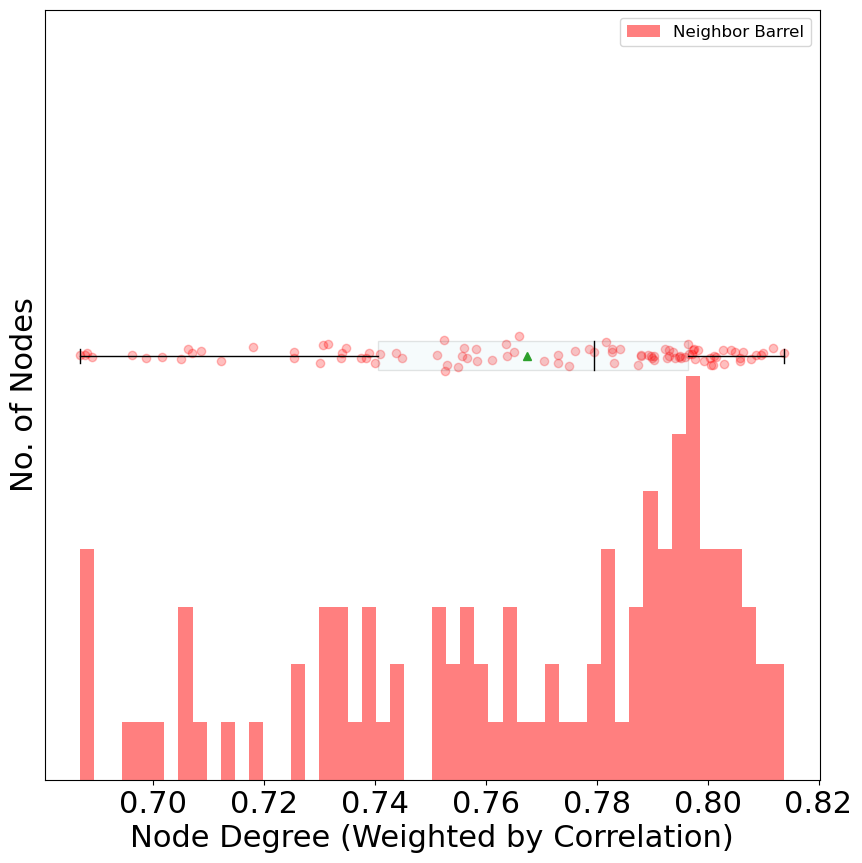

Date: 4/9/2025, Slice/Location: 3_2
[0.8124641951353678, 0.840508483256325, 0.8272418474327637, 0.8551598633116428, 0.8518900251227162, 0.8487238728951343, 0.847748027080995, 0.8319306008256339, 0.8498393562262011, 0.8460112011141351, 0.8482491162759539, 0.8350045955672114, 0.8248696993821028, 0.8430512697724145, 0.7549972094944704, 0.8038595138311163, 0.8411446583670527, 0.8230483540090259, 0.7562715077532554, 0.8510247388041342, 0.8428040146368635, 0.8463227656543939, 0.8528906435495391, 0.8441718261619219, 0.7544984501060984, 0.8435992601501958, 0.7970381870791626, 0.7932755335933515, 0.7857485978083919, 0.8523886311408974, 0.843719384724445, 0.8484490921660853, 0.8400063642251815, 0.8490250805824486, 0.8154194309343455, 0.8438368625566597, 0.7537130784381629, 0.8144950542317838, 0.8052142547387763, 0.7429960392366977, 0.8325001596247537, 0.8399284888742415, 0.8418672719672674, 0.8395979865982535, 0.848339654201013, 0.8224462864699806, 0.8364300100820169, 0.8491436355109468, 0.79743

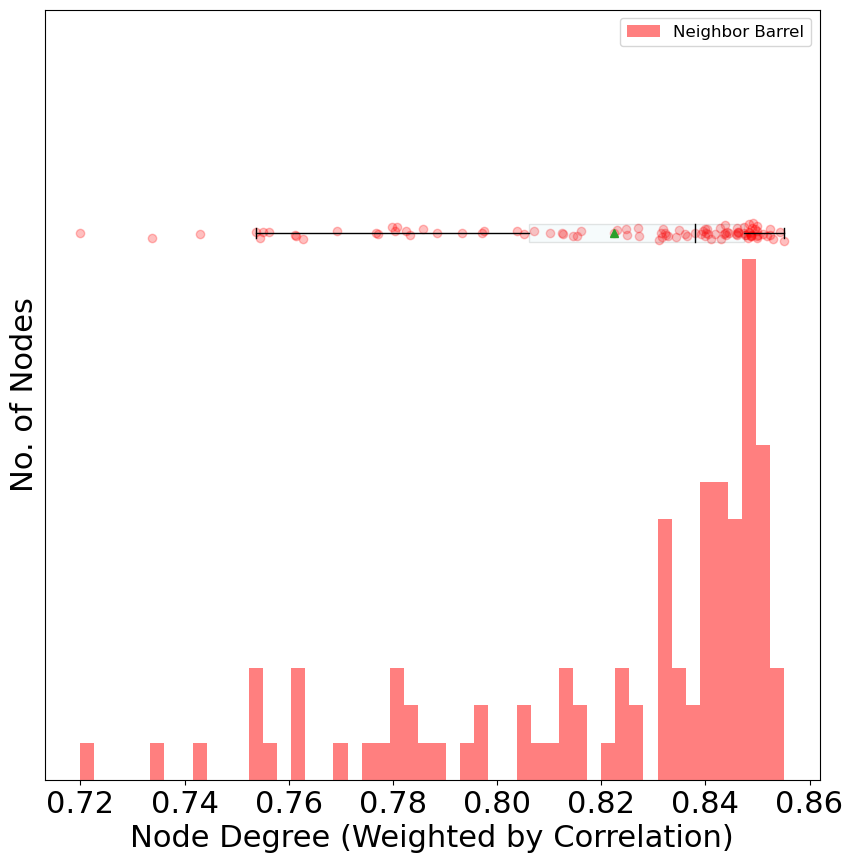

Date: 4/9/2025, Slice/Location: 4_2
[0.7065634817111921, 0.6713280789902674, 0.5490286579067133, 0.7077188492443983, 0.6585237686468857, 0.5660862158876401, 0.650037931253669, 0.611015446901687, 0.6673368631222998, 0.6228614512448546, 0.6532377541910198, 0.5894866300344718, 0.5707822694860586, 0.6703944760889569, 0.6558115615703475, 0.6970879107394081, 0.631520978481544, 0.7240053417450589, 0.689186389813522, 0.6562575383266407, 0.7091374953151098, 0.704270622821803, 0.5835880332225262, 0.7335732004390302, 0.6402006379783749, 0.7047433550405292, 0.5699873287502297, 0.6386613159038809, 0.7127982977505087, 0.6389210206108659, 0.6286092090395569, 0.7122121345820087, 0.7304909598024217, 0.6331380106278771, 0.6537578862006765, 0.708940858671013, 0.7056276572196519, 0.714634424006102, 0.5546949098522022, 0.6737099126029582, 0.7240650349425203, 0.6749050457543763, 0.7051345637500718, 0.7252596670209058, 0.686833800023853, 0.6975548574900762, 0.5896629882003803, 0.7387298549187757, 0.621163392

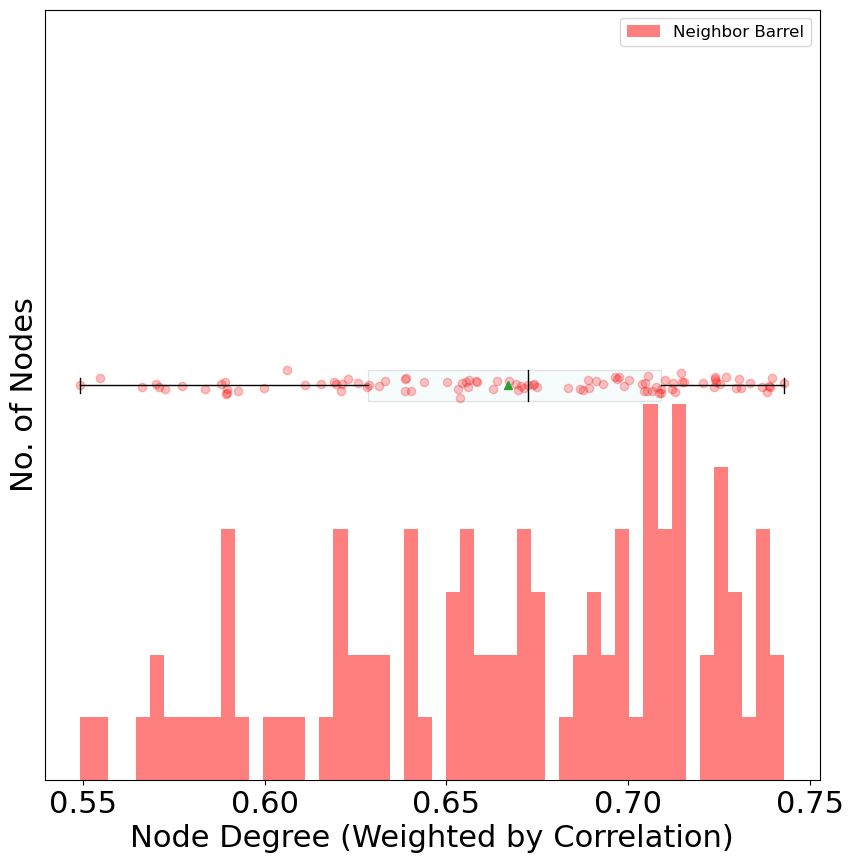

In [19]:
for date in node_degree_dist.keys():
    for slic_loc_id in node_degree_dist[date].keys():
        print(f"Date: {date}, Slice/Location: {slic_loc_id}")
        # plot the distribution of node degrees
        fig, ax = plt.subplots(figsize=(10, 10))
        #ax.set_xlim(0, 1)

        print(list(node_degree_dist[date][slic_loc_id][1].values()))

        ax.hist(list(node_degree_dist[date][slic_loc_id][1].values()),
                    bins=50, histtype='bar',
                    color='red', alpha=0.5, label='Neighbor Barrel',)
        plot_ylim = ax.get_ylim()[1]

        # plot scatter points for each node degree
        y_jitter = np.random.normal(0, 0.1, len(node_degree_dist[date][slic_loc_id][1].values()))
        ax.scatter(list(node_degree_dist[date][slic_loc_id][1].values()),
                    y_jitter + plot_ylim, color='red', alpha=0.25)

        # add horizontal boxplots 
        ax.boxplot([ 
                    list(node_degree_dist[date][slic_loc_id][1].values())],
                    positions=[ plot_ylim], 
                            widths=0.5, patch_artist=True,
                    boxprops=dict(facecolor='lightblue', alpha=0.1),
                    showfliers=False,
                    medianprops=dict(color='black'), showmeans=True, vert=False)

        ax.set_ylim(0, plot_ylim + 6)
        ax.legend(loc='upper right', fontsize=12)
        ax.set_yticks([])

        ax.set_xlabel('Node Degree (Weighted by Correlation)')
        ax.set_ylabel('No. of Nodes')
        date_formatted = date.replace('/', '-')
        plt.savefig(f"{output_fig_dir}/{date_formatted}_{slic_loc_id}_"
                    f"node_degree_distribution_barrel_cutoff_intrabarrel_pulse2.png")
        plt.show()

In [20]:
node_degree_dist_cutoff

{'12/23/2024': {'1_3': {0: {},
   1: {'52_48': 0.8767239019803388,
    '39_58': 0.8569443403694346,
    '57_51': 0.8720544408652005,
    '47_54': 0.8838407646017108,
    '43_49': 0.9008429712470819,
    '43_56': 0.8711092275106952,
    '54_51': 0.8860560357086414,
    '38_54': 0.872489378618418,
    '46_52': 0.8937926595261749,
    '45_42': 0.8226442533566274,
    '38_51': 0.883807613165771,
    '47_42': 0.803435205851519,
    '43_46': 0.8884632057138093,
    '50_61': 0.8276077956345944,
    '37_54': 0.867534748541233,
    '44_52': 0.895156347140687,
    '41_52': 0.8914721938828792,
    '46_44': 0.8429986766911058,
    '39_49': 0.894275556920276,
    '42_57': 0.8645724834882199,
    '50_56': 0.879577958952637,
    '39_55': 0.8713956850028794,
    '55_50': 0.8829789317373736,
    '40_56': 0.8808230782068068,
    '50_53': 0.8989970581426895,
    '49_45': 0.8380148427136002,
    '44_61': 0.8287608222569953,
    '42_52': 0.8930733490140782,
    '56_49': 0.8663249260818804,
    '40_52': 0.8

Date: 12/23/2024, Slice/Location: 1_3


NameError: name 'roi_file_barrel_0' is not defined

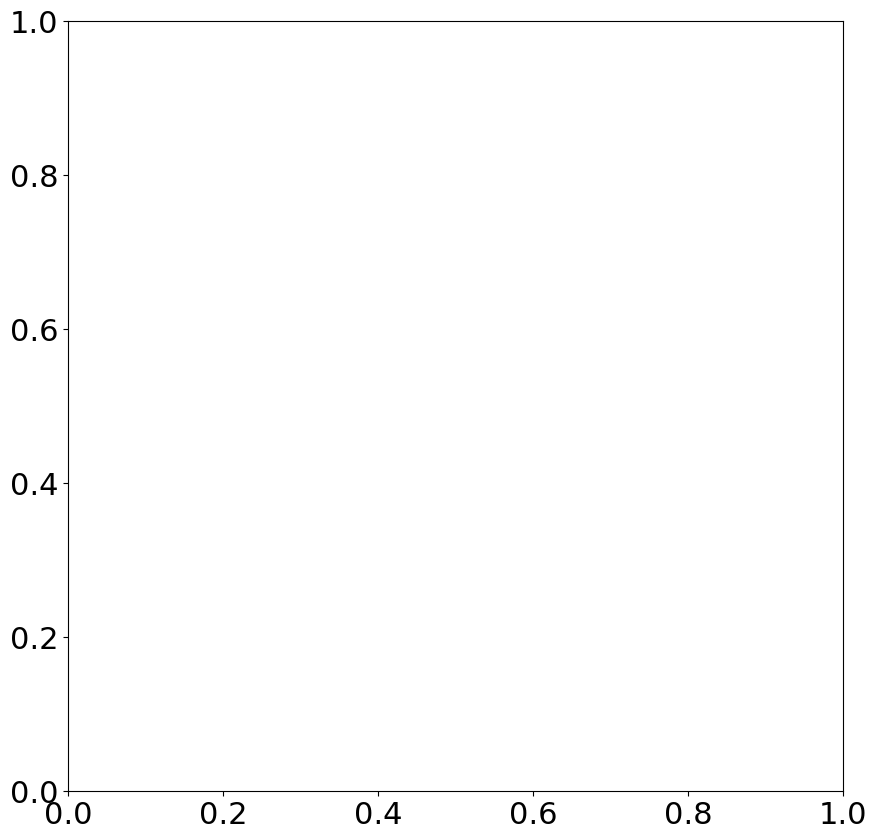

In [21]:
# node degree vs distance from center of barrel
for date in node_degree_dist_cutoff.keys():
    for slic_loc_id in node_degree_dist_cutoff[date].keys():
        print(f"Date: {date}, Slice/Location: {slic_loc_id}")
        # plot the distribution of node degrees
        fig, ax = plt.subplots(figsize=(10, 10))
        #ax.set_xlim(0, 1)

        # calculate center of the barrel from the roi points
        home_barrel = 0
        i_barrel = 1

        # get roi_file for home_barrel
        roi_file_barrel_1 = loc_df[loc_df['ROI_Set'].str.contains('rand_0')]['ROI_File'].values[0]
        
        # read the roi file (home_barrel)
        rois_0 = ROIFileReader(roi_file_barrel_0).get_roi_list()
        rois_0 = [LaminarROI(r, input_diode_numbers=True)
                for r in rois_0]
        rois_points0 = [roi.get_points() for roi in rois_0]
        
        xs, ys = [], []
        for roi in rois_points0:
            for px in roi:
                xs.append(px[0])
                ys.append(px[1])
        center = (np.mean(xs), np.mean(ys))

        # get the distance from the center of the barrel for each node
        dist_from_center = []
        for key in node_degree_dist_cutoff[date][slic_loc_id][i_barrel].keys():
            x, y = map(int, key.split('_'))
            dist_from_center.append(np.sqrt((x - center[0]) ** 2 
                                            + (y - center[1]) ** 2) *
                                            um_per_px)
        label = 'Home Barrel' if i_barrel == 0 else 'Neighbor Barrel'
        color = 'blue' if i_barrel == 0 else 'red'
        ax.scatter(dist_from_center, 
                    list(node_degree_dist_cutoff[date][slic_loc_id][i_barrel].values()), 
                    color=color, alpha=0.35, label=label)

        # linear regression for the node degree vs distance from center
        slope, intercept, r_value, p_value, std_err = linregress(
            dist_from_center, 
            list(node_degree_dist_cutoff[date][slic_loc_id][i_barrel].values()))
        print(f"Slope: {slope}, Intercept: {intercept}, R^2: {r_value**2}, p-value: {p_value}, Std Err: {std_err}")
        # plot the line of best fit
        x_fit = np.linspace(0, max(dist_from_center), 100)
        y_fit = slope * x_fit + intercept
        # plot only for the domain of the data
        x_fit = x_fit[x_fit <= max(dist_from_center)]
        ax.plot(x_fit, y_fit, color=color, linewidth=2)

        ax.set_xlabel('Distance from Home Barrel (um)')
        ax.set_ylabel('Node Degree (Weighted by Correlation)')
        ax.legend(loc='upper right', fontsize=12)
        
        date_formatted = date.replace('/', '-')
        plt.savefig(f"{output_fig_dir}/{date_formatted}_{slic_loc_id}_"
                    f"node_degree_vs_distance_from_center_barrel_cutoff_pulse2.png")
        plt.show()

No corr_matrices_by_slice for this date
No corr_matrices_by_slice for this date
No corr_matrices_by_slice for this date
No corr_matrices_by_slice for this date
No corr_matrices_by_slice for this date
No corr_matrices_by_slice for this date
Date:  12/23/2024 Slice:  1 Location:  3
Avg corr shape:  (26, 100, 100)
Clustering: [0.880390219004886, 0.8637002559493259, 0.878920197069167, 0.8863594021114621, 0.8973973297721994, 0.873718225427267, 0.8893481369889269, 0.8798808120507817, 0.8932641602010557, 0.8448276209328595, 0.8865501929985878, 0.8212058550424182, 0.8904321520002297, 0.8429263978528848, 0.8755312724033744, 0.894026769066851, 0.889074436941845, 0.8580401302079443, 0.892551449081331, 0.8700363926193945, 0.8828938981298121, 0.8763475441658284, 0.8865100639137916, 0.8794801145269728, 0.8944734539504615, 0.8488844730467496, 0.8490616180329142, 0.8916369018883626, 0.8761190522790229, 0.8871768824551062, 0.8625205406571269, 0.8875421121829484, 0.8776829008087369, 0.8565214153061014, 

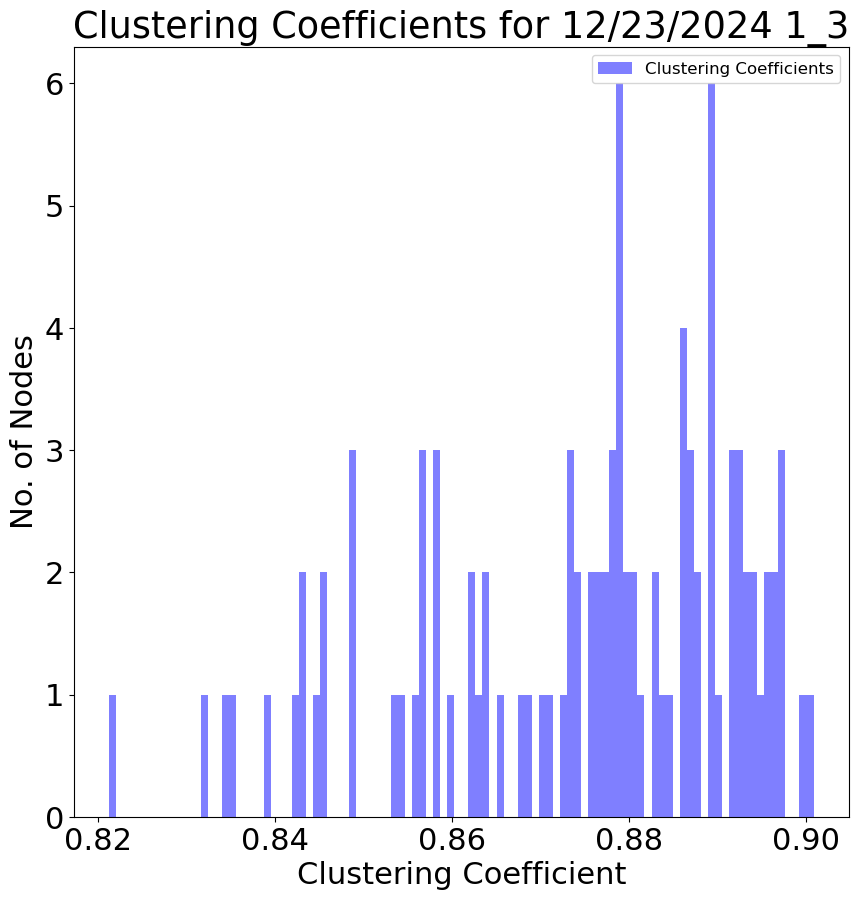

Modularity: 0.01374157240913082
Betweenness Centrality: {0: 0.0, 1: 0.0, 2: 0.0, 3: 0.0, 4: 0.0, 5: 0.0, 6: 0.0, 7: 0.0, 8: 0.0, 9: 0.0, 10: 0.0, 11: 0.0, 12: 0.0, 13: 0.0, 14: 0.0, 15: 0.0, 16: 0.0, 17: 0.0, 18: 0.0, 19: 0.0, 20: 0.0, 21: 0.0, 22: 0.0, 23: 0.0, 24: 0.0, 25: 0.0, 26: 0.0, 27: 0.0, 28: 0.0, 29: 0.0, 30: 0.0, 31: 0.0, 32: 0.0, 33: 0.0, 34: 0.0, 35: 0.0, 36: 0.0, 37: 0.0, 38: 0.0, 39: 0.0, 40: 0.0, 41: 0.0, 42: 0.0, 43: 0.0, 44: 0.0, 45: 0.0, 46: 0.0, 47: 0.0, 48: 0.0, 49: 0.0, 50: 0.0, 51: 0.0, 52: 0.0, 53: 0.0, 54: 0.0, 55: 0.0, 56: 0.0, 57: 0.0, 58: 0.0, 59: 0.0, 60: 0.0, 61: 0.0, 62: 0.0, 63: 0.0, 64: 0.0, 65: 0.0, 66: 0.0, 67: 0.0, 68: 0.0, 69: 0.0, 70: 0.0, 71: 0.0, 72: 0.0, 73: 0.0, 74: 0.0, 75: 0.0, 76: 0.0, 77: 0.0, 78: 0.0, 79: 0.0, 80: 0.0, 81: 0.0, 82: 0.0, 83: 0.0, 84: 0.0, 85: 0.0, 86: 0.0, 87: 0.0, 88: 0.0, 89: 0.0, 90: 0.0, 91: 0.0, 92: 0.0, 93: 0.0, 94: 0.0, 95: 0.0, 96: 0.0, 97: 0.0, 98: 0.0, 99: 0.0}


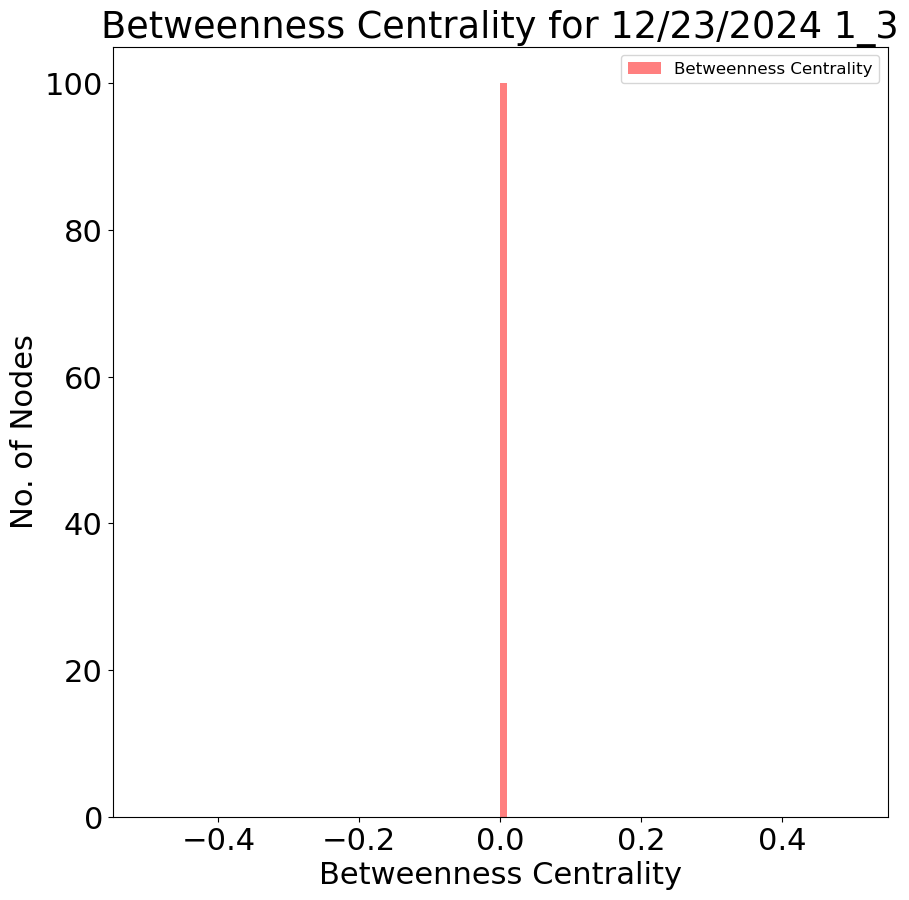

Date:  12/23/2024 Slice:  2 Location:  2
Avg corr shape:  (26, 100, 100)
Clustering: [0.5569812036400974, 0.547738335208008, 0.5546100547196406, 0.5323432954110926, 0.5749865999046232, 0.574164376861373, 0.5529155192900074, 0.5725208215798078, 0.5582069829461823, 0.5726728006721643, 0.5954439260514802, 0.5890934105378026, 0.5738326730398282, 0.5195943466947016, 0.5774950770663244, 0.566101619050067, 0.5866391410705127, 0.589187913209408, 0.5663657699220354, 0.5838699366491038, 0.5965216156559311, 0.5862024784567437, 0.5707634603897092, 0.5890130779400499, 0.5319369425264177, 0.573282179361398, 0.5988300851596358, 0.6007638304082803, 0.5720199568341325, 0.543567710717398, 0.48663201415702456, 0.5608738711090493, 0.5601410308895282, 0.577711019986601, 0.5655735390015996, 0.5555281133845177, 0.5711980141264708, 0.5846171302110573, 0.5782058796662, 0.5851215160601477, 0.58694720162735, 0.5667323460158664, 0.5889496948928961, 0.5636211693885234, 0.5780689612037211, 0.5621640027549273, 0.554

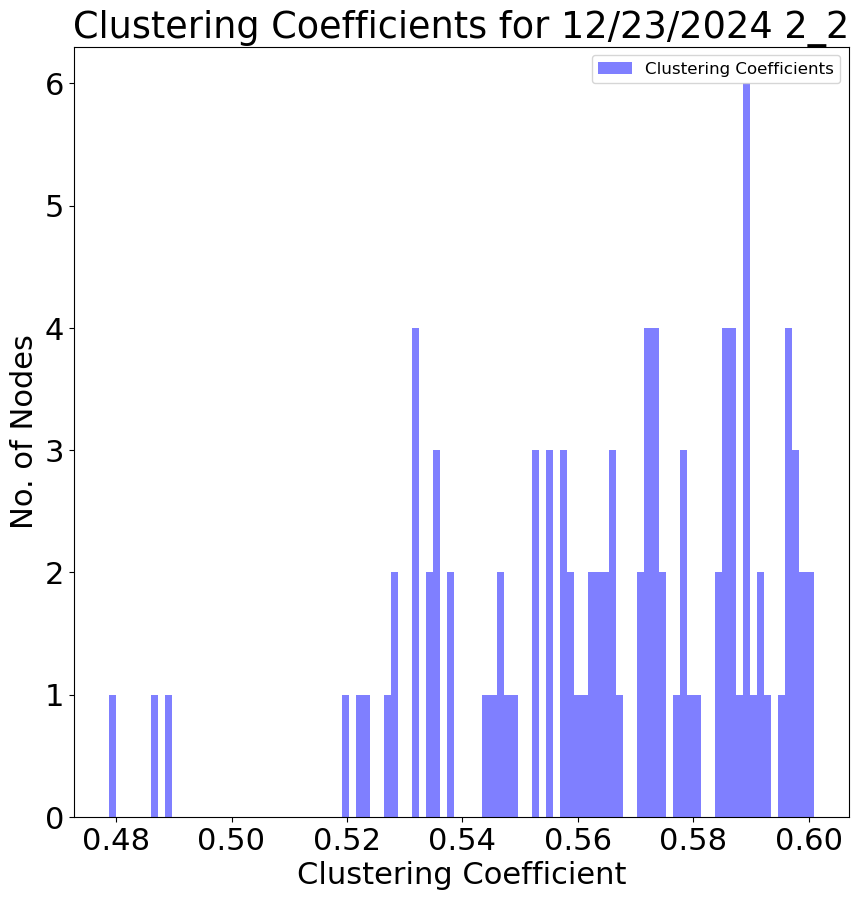

Modularity: 0.021846948162795504
Betweenness Centrality: {0: 0.0, 1: 0.0, 2: 0.0, 3: 0.0, 4: 0.0, 5: 0.0, 6: 0.0, 7: 0.0, 8: 0.00020614306328592042, 9: 0.0, 10: 0.0, 11: 0.0, 12: 0.0, 13: 0.0, 14: 0.00020614306328592042, 15: 0.0, 16: 0.0, 17: 0.0, 18: 0.0, 19: 0.0, 20: 0.0, 21: 0.0, 22: 0.0, 23: 0.0, 24: 0.0, 25: 0.0, 26: 0.0, 27: 0.0, 28: 0.0, 29: 0.0, 30: 0.006390434961863533, 31: 0.0, 32: 0.0, 33: 0.0, 34: 0.0, 35: 0.0, 36: 0.0, 37: 0.0, 38: 0.0, 39: 0.0, 40: 0.0, 41: 0.0, 42: 0.0, 43: 0.0, 44: 0.0, 45: 0.0, 46: 0.0, 47: 0.0, 48: 0.0, 49: 0.0, 50: 0.0, 51: 0.0, 52: 0.0, 53: 0.0, 54: 0.0, 55: 0.0, 56: 0.0, 57: 0.0, 58: 0.00020614306328592042, 59: 0.0, 60: 0.0, 61: 0.0, 62: 0.00041228612657184083, 63: 0.0, 64: 0.0, 65: 0.0, 66: 0.0, 67: 0.0, 68: 0.00041228612657184083, 69: 0.0, 70: 0.0, 71: 0.002473716759431045, 72: 0.0, 73: 0.0, 74: 0.0, 75: 0.0, 76: 0.0, 77: 0.0, 78: 0.0, 79: 0.0, 80: 0.0, 81: 0.0, 82: 0.008658008658008658, 83: 0.0, 84: 0.0, 85: 0.0, 86: 0.0, 87: 0.0, 88: 0.0, 89: 0

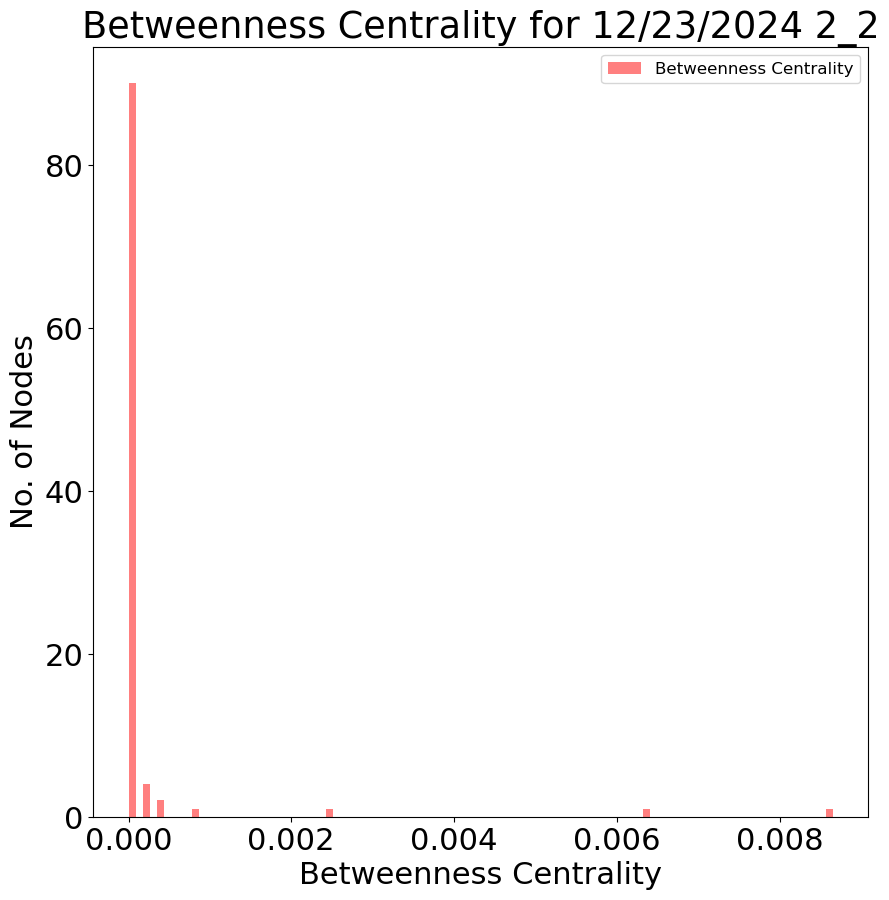

Date:  1/15/2025 Slice:  1 Location:  3
Avg corr shape:  (26, 100, 100)
Clustering: [0.3309470298307347, 0.3497062458032502, 0.35818409116501726, 0.35085274297318575, 0.35496389801033756, 0.35342411628956744, 0.3614885345133735, 0.30203276458189965, 0.35946694019713793, 0.3480665678489524, 0.3033874931308771, 0.33649809944564657, 0.34566696263216284, 0.3281927346663824, 0.3524872134024109, 0.381673433644283, 0.3075291857419154, 0.3404504165946054, 0.3500262930186106, 0.2932556604330649, 0.37796474252162104, 0.3389445395623161, 0.35488432108771406, 0.34156619935949273, 0.3249029467027185, 0.36942953026015923, 0.3874690249804895, 0.3471610319398152, 0.3570829553736255, 0.3621357870676501, 0.3119622059413453, 0.38628699124016663, 0.3659545119792564, 0.3460017145999032, 0.3239280900428239, 0.3576678169536249, 0.35484077841494405, 0.3504776420817168, 0.36002533897370353, 0.36411878567723444, 0.3311477246731427, 0.36251321618633875, 0.38962397456194764, 0.346106497408639, 0.3124829434697147,

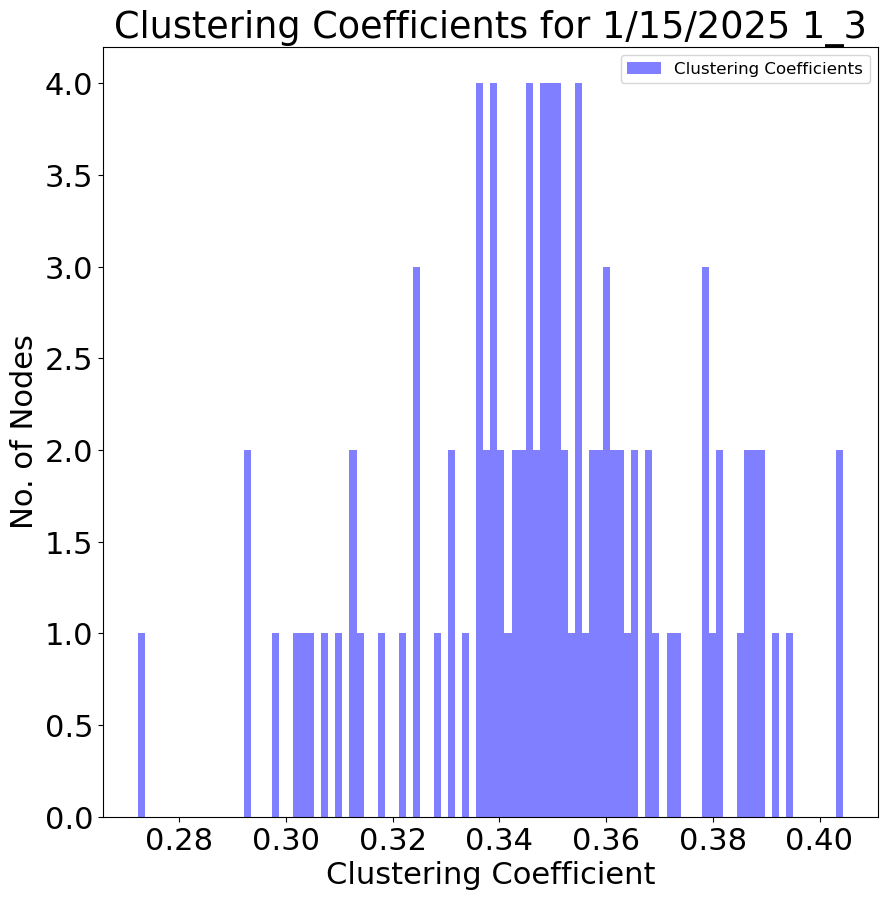

Modularity: 0.08139074034095942
Betweenness Centrality: {0: 0.00020614306328592042, 1: 0.00020614306328592042, 2: 0.0, 3: 0.0, 4: 0.0, 5: 0.0, 6: 0.0, 7: 0.00041228612657184083, 8: 0.0, 9: 0.0010307153164296021, 10: 0.010719439290867862, 11: 0.0, 12: 0.00020614306328592042, 13: 0.008864151721294579, 14: 0.0, 15: 0.0, 16: 0.009688723974438259, 17: 0.0, 18: 0.0, 19: 0.03896103896103896, 20: 0.0, 21: 0.0, 22: 0.0, 23: 0.0, 24: 0.0, 25: 0.0, 26: 0.0, 27: 0.0, 28: 0.0, 29: 0.0, 30: 0.0, 31: 0.0, 32: 0.0, 33: 0.0, 34: 0.035456606885178314, 35: 0.0, 36: 0.0, 37: 0.012368583797155224, 38: 0.0, 39: 0.0, 40: 0.0, 41: 0.0, 42: 0.0, 43: 0.0, 44: 0.0, 45: 0.00020614306328592042, 46: 0.0, 47: 0.033189033189033185, 48: 0.0, 49: 0.0, 50: 0.014636157493300349, 51: 0.0, 52: 0.00041228612657184083, 53: 0.0, 54: 0.0, 55: 0.0, 56: 0.0, 57: 0.00020614306328592042, 58: 0.0, 59: 0.0, 60: 0.0, 61: 0.0, 62: 0.0, 63: 0.0, 64: 0.0, 65: 0.00041228612657184083, 66: 0.011131725417439703, 67: 0.011750154607297465, 68

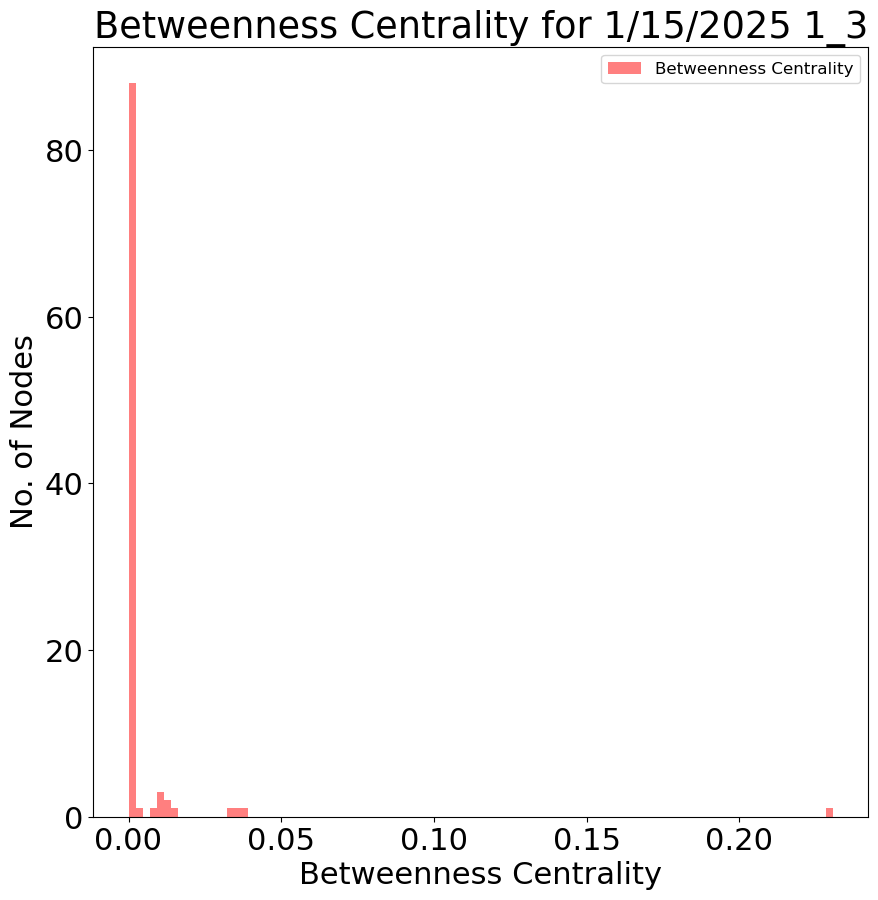

Date:  1/15/2025 Slice:  3 Location:  2
Avg corr shape:  (26, 100, 100)
Clustering: [0.509826774204777, 0.4898248588751407, 0.44092116955326244, 0.47687838792432924, 0.47892722673036753, 0.5149905527568945, 0.48710121041253657, 0.5109954012507251, 0.48664962992719873, 0.5237726520916907, 0.5027256855330265, 0.5002993298772757, 0.5004988379221903, 0.5125951388081569, 0.5031422081343586, 0.47292007755676174, 0.5096754385864197, 0.5199143501286495, 0.4765830832006433, 0.5116928233618523, 0.4956038703370231, 0.4597939449022887, 0.44931337606948635, 0.49816934319777867, 0.48443913510309233, 0.48632448550697716, 0.5130470301674478, 0.4860153890776435, 0.49343267836276095, 0.5099513228796371, 0.5197580266739695, 0.46972753666599887, 0.4939998972575227, 0.4931394039132007, 0.5009909256056837, 0.5212693151628118, 0.4834198353757779, 0.4534309520816382, 0.4909634461343292, 0.468598531751732, 0.517558779562398, 0.5168137258854579, 0.4473801376176976, 0.5256071219177423, 0.4949729125822978, 0.5140

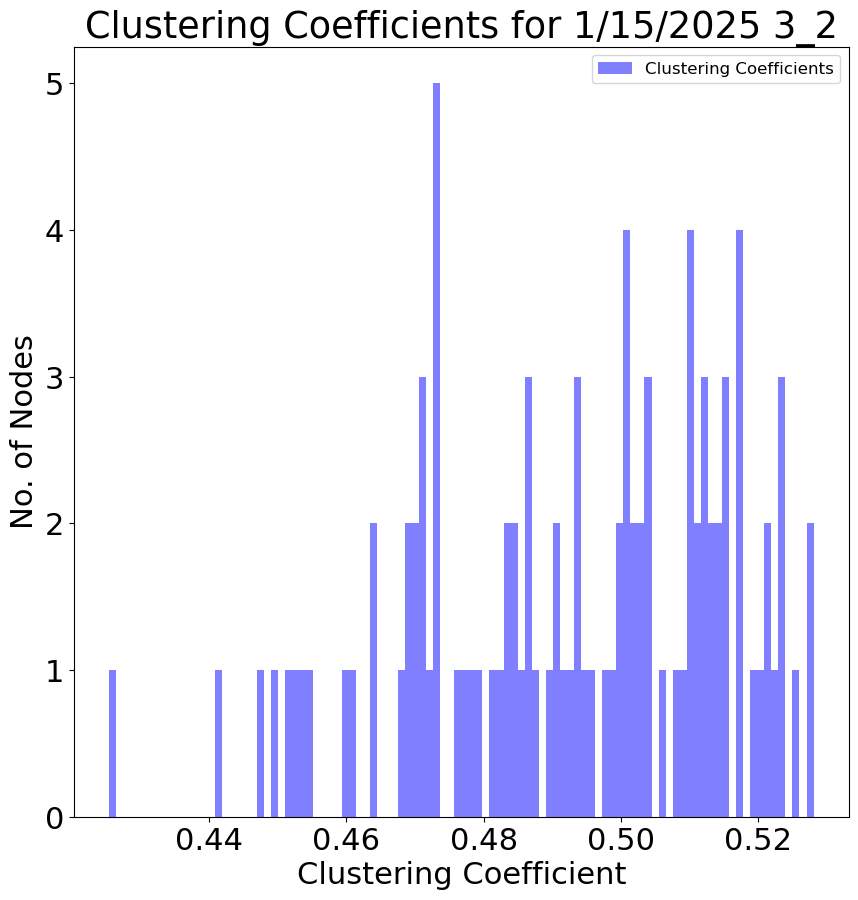

Modularity: 0.05569253601829725
Betweenness Centrality: {0: 0.0, 1: 0.0, 2: 0.0404040404040404, 3: 0.0, 4: 0.0, 5: 0.0, 6: 0.0, 7: 0.0, 8: 0.0, 9: 0.0, 10: 0.0, 11: 0.0, 12: 0.0, 13: 0.0, 14: 0.0, 15: 0.00041228612657184083, 16: 0.0, 17: 0.0, 18: 0.00041228612657184083, 19: 0.0, 20: 0.0, 21: 0.0008245722531436817, 22: 0.005772005772005772, 23: 0.0, 24: 0.0, 25: 0.0, 26: 0.0, 27: 0.0, 28: 0.0, 29: 0.0, 30: 0.0, 31: 0.0006184291898577612, 32: 0.0, 33: 0.0, 34: 0.0, 35: 0.0, 36: 0.0, 37: 0.012780869923727066, 38: 0.0, 39: 0.0, 40: 0.0, 41: 0.0, 42: 0.008658008658008658, 43: 0.0, 44: 0.0, 45: 0.0, 46: 0.0, 47: 0.0, 48: 0.0, 49: 0.0012368583797155224, 50: 0.0, 51: 0.0, 52: 0.0, 53: 0.0, 54: 0.02329416615130901, 55: 0.0, 56: 0.0037105751391465673, 57: 0.00041228612657184083, 58: 0.0, 59: 0.007215007215007215, 60: 0.0, 61: 0.0, 62: 0.0, 63: 0.0, 64: 0.0, 65: 0.0, 66: 0.0, 67: 0.0, 68: 0.0, 69: 0.0, 70: 0.0, 71: 0.00020614306328592042, 72: 0.0, 73: 0.00020614306328592042, 74: 0.0, 75: 0.0, 76:

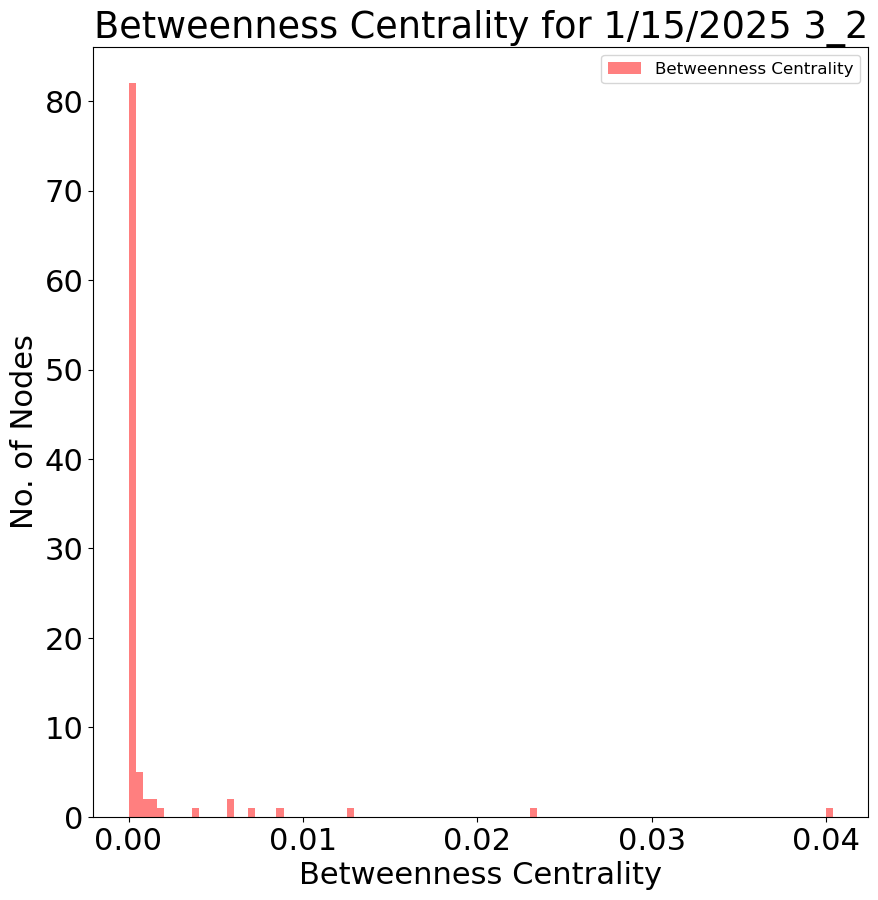

Date:  1/22/2025 Slice:  1 Location:  2
Avg corr shape:  (26, 100, 100)
Clustering: [0.5849751221784193, 0.527338485838232, 0.6451268353850769, 0.6216856490219455, 0.5938307132345028, 0.5464708422374402, 0.5891996566588057, 0.5502144577591891, 0.6163416557544696, 0.5596310820199479, 0.5754109959750712, 0.576404707403402, 0.5807904954035829, 0.6363139816132207, 0.5791741173629804, 0.6087975261163056, 0.6019222190753418, 0.6276664622889205, 0.5455812697750703, 0.6011402492739403, 0.646932140264655, 0.5782795335280065, 0.5789957866420141, 0.6103853407529506, 0.6120992793346587, 0.5936883787827647, 0.5564006674353041, 0.5860358601890082, 0.5546799753021514, 0.6227315521518181, 0.5869553598093376, 0.6229710302064992, 0.6516756618877393, 0.6179749225414979, 0.5557473788850692, 0.6015287903269606, 0.5513446404310232, 0.588776817848864, 0.6067531318889341, 0.5997528652506309, 0.5802956391771361, 0.5584921578332817, 0.6353274805615167, 0.6352257300242696, 0.5683015239262577, 0.6411666309652527,

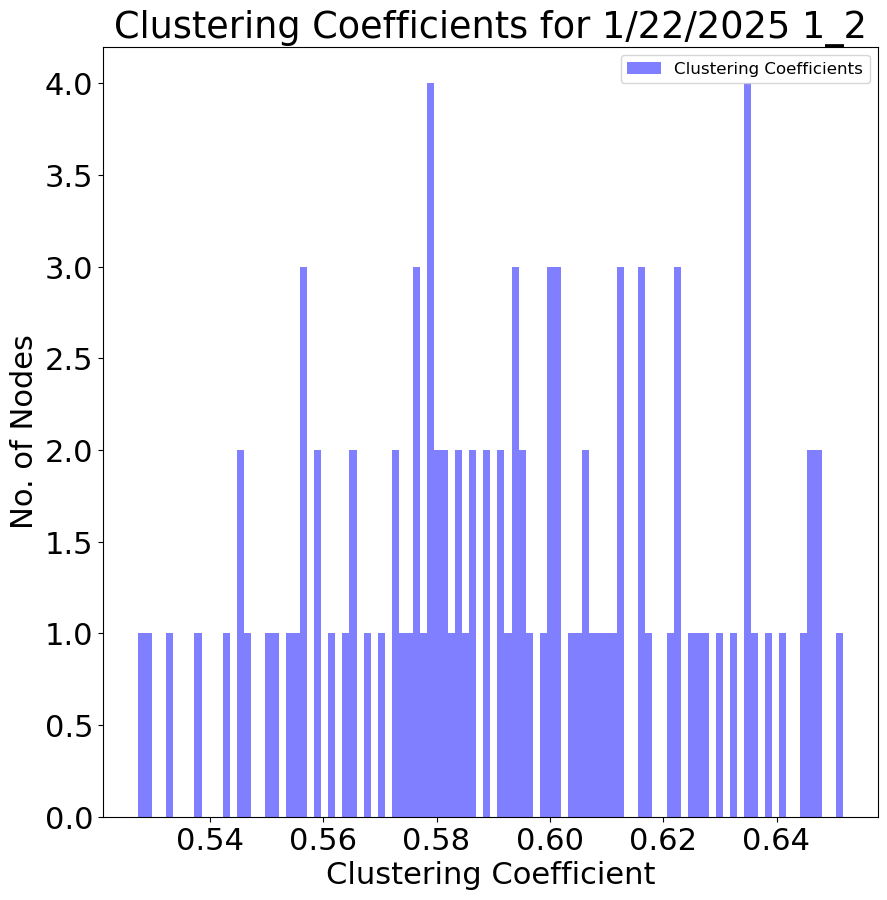

Modularity: 0.018829098929014396
Betweenness Centrality: {0: 0.0, 1: 0.0037105751391465673, 2: 0.0, 3: 0.0, 4: 0.0, 5: 0.0006184291898577612, 6: 0.0, 7: 0.0, 8: 0.0, 9: 0.0, 10: 0.0, 11: 0.0, 12: 0.0, 13: 0.0, 14: 0.0, 15: 0.0, 16: 0.0, 17: 0.0, 18: 0.0, 19: 0.0, 20: 0.0, 21: 0.0, 22: 0.0, 23: 0.0, 24: 0.0, 25: 0.0, 26: 0.0, 27: 0.0, 28: 0.0, 29: 0.0, 30: 0.0, 31: 0.0, 32: 0.0, 33: 0.0, 34: 0.0, 35: 0.0, 36: 0.0006184291898577612, 37: 0.0, 38: 0.0, 39: 0.0, 40: 0.0, 41: 0.00020614306328592042, 42: 0.0, 43: 0.0, 44: 0.0, 45: 0.0, 46: 0.0, 47: 0.0, 48: 0.0, 49: 0.0, 50: 0.0, 51: 0.0, 52: 0.0, 53: 0.0, 54: 0.0012368583797155224, 55: 0.0, 56: 0.0, 57: 0.0, 58: 0.0, 59: 0.0, 60: 0.0, 61: 0.0, 62: 0.0022675736961451248, 63: 0.0, 64: 0.0, 65: 0.0, 66: 0.0, 67: 0.0, 68: 0.0, 69: 0.0, 70: 0.0, 71: 0.0, 72: 0.0, 73: 0.0, 74: 0.0, 75: 0.0, 76: 0.0, 77: 0.0, 78: 0.0, 79: 0.0, 80: 0.0, 81: 0.0, 82: 0.0, 83: 0.0, 84: 0.0, 85: 0.0, 86: 0.0, 87: 0.0, 88: 0.0, 89: 0.0, 90: 0.0006184291898577612, 91: 0.

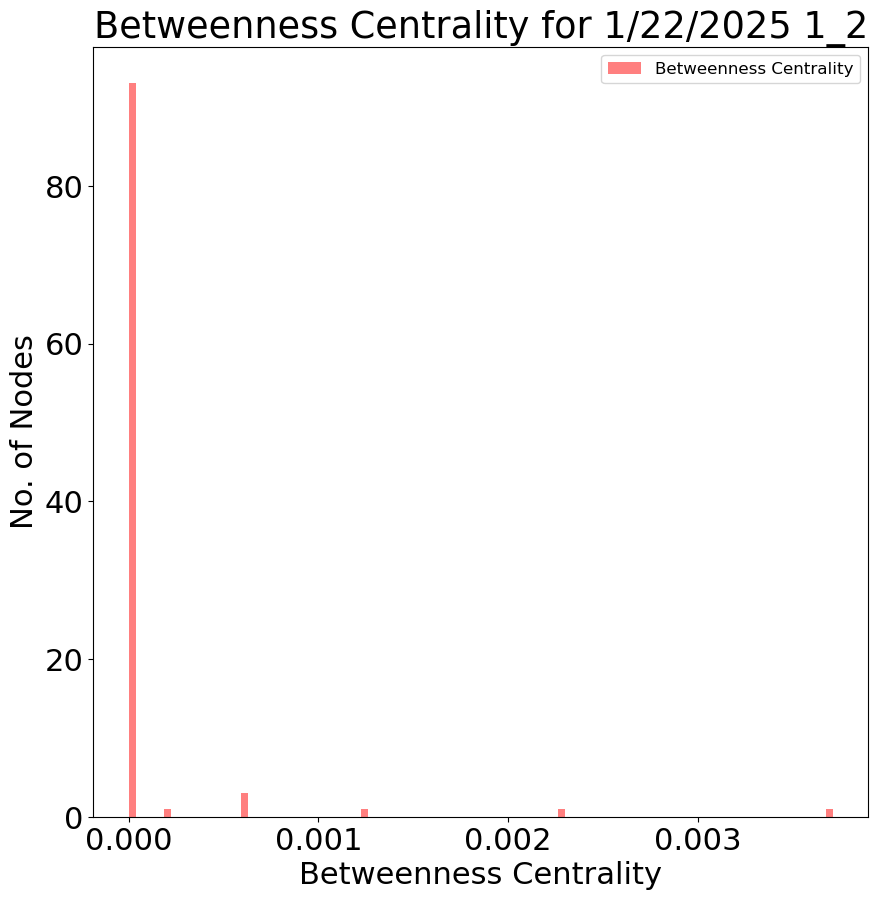

Date:  1/22/2025 Slice:  3 Location:  2
Avg corr shape:  (26, 100, 100)
Clustering: [0.34757584305936234, 0.34934215705613086, 0.33366196035321716, 0.40283326730632874, 0.36872041037998965, 0.40915193059992894, 0.19391293585956818, 0.370455954091415, 0.407689392828322, 0.2819577574652524, 0.3158193370895907, 0.2966654117780421, 0.31523552030705193, 0.402907924891729, 0.35267239469797207, 0.3475681186334644, 0.3093216382484693, 0.22608431527561076, 0.36884059267494806, 0.2507267722165146, 0.30366544287304703, 0.3207294624815989, 0.3268479776282267, 0.3785671766380062, 0.227979759926856, 0.3347809300355115, 0.4039955170232253, 0.32470966928905765, 0.2228169204035565, 0.41272204668262436, 0.32210494227060726, 0.375136722290011, 0.38900131429419743, 0.3927898274370119, 0.4101402086519731, 0.31694016955521265, 0.40630303144415986, 0.20132163732611813, 0.3655519606462459, 0.3951035983179791, 0.41229274363536034, 0.3464848499769464, 0.2528343320277311, 0.3241421367759278, 0.371569161916382, 0

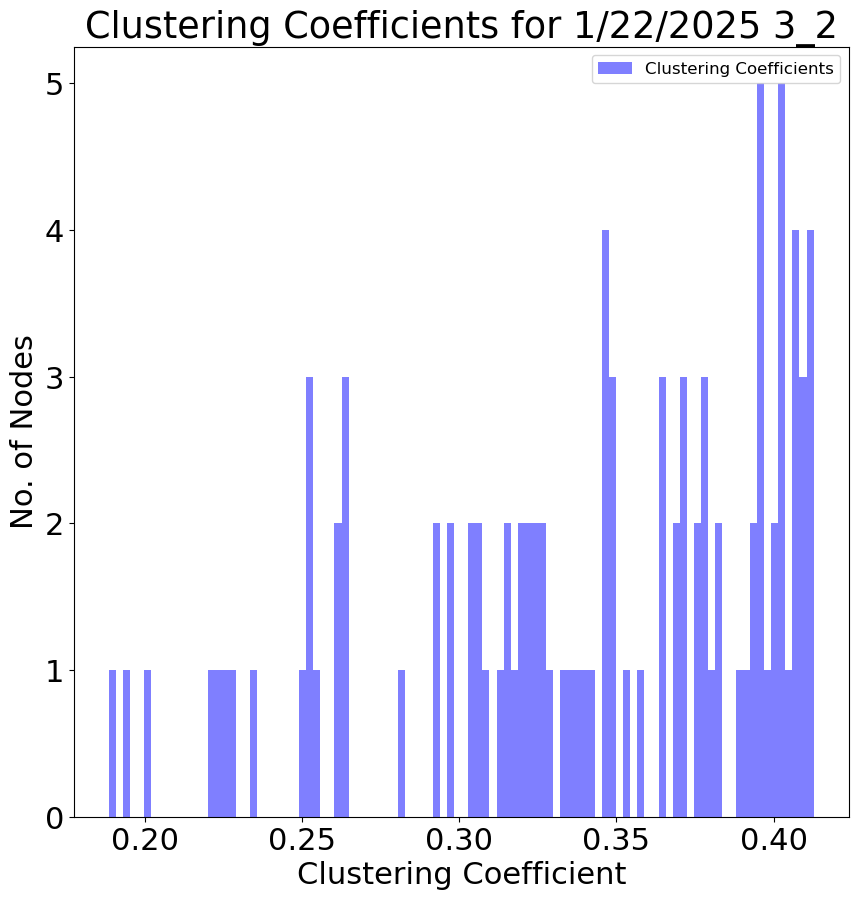

Modularity: 0.22898764276486994
Betweenness Centrality: {0: 0.0606060606060606, 1: 0.0, 2: 0.0, 3: 0.0, 4: 0.0, 5: 0.10781282209853638, 7: 0.02514945372088229, 8: 0.01834673263244692, 9: 0.01958359101216244, 10: 0.0, 11: 0.014017728303442589, 12: 0.047619047619047616, 13: 0.06596578025149454, 14: 0.06782106782106782, 15: 0.008658008658008658, 16: 0.0, 17: 0.0, 18: 0.0010307153164296021, 19: 0.0, 20: 0.0, 21: 0.0, 22: 0.0, 23: 0.0, 24: 0.42547928262213974, 25: 0.06493506493506493, 26: 0.0, 27: 0.0, 28: 0.0, 29: 0.15646258503401358, 30: 0.0, 31: 0.06349206349206349, 32: 0.0, 33: 0.0, 34: 0.0, 35: 0.016491445062873634, 36: 0.0, 37: 0.0, 38: 0.06699649556792414, 39: 0.18655947227375796, 40: 0.0, 41: 0.00515357658214801, 42: 0.02535559678416821, 43: 0.024324881467738608, 44: 0.0, 45: 0.183879612451041, 46: 0.13378684807256236, 47: 0.04432075860647289, 48: 0.0, 49: 0.0, 50: 0.0, 51: 0.021851164708307565, 52: 0.0, 53: 0.0, 54: 0.0018552875695732837, 55: 0.0, 56: 0.0045351473922902496, 57: 0.0

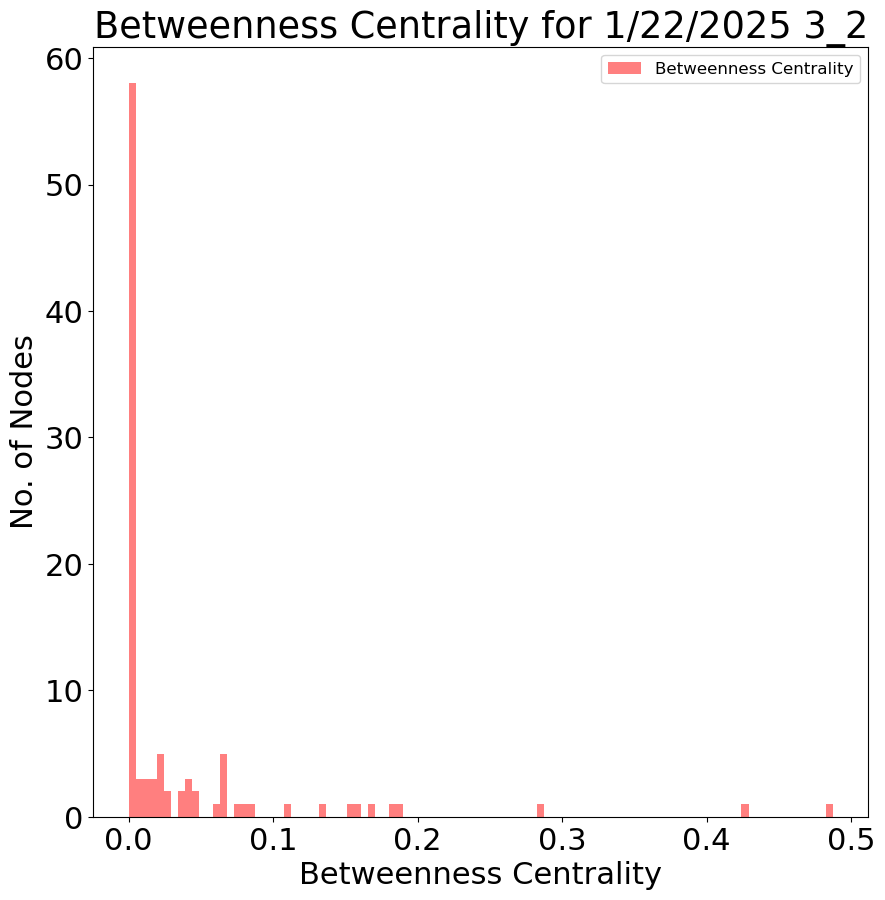

Date:  2/5/2025 Slice:  1 Location:  3
Avg corr shape:  (26, 100, 100)
Clustering: [0.5550603519171871, 0.6568494931325446, 0.6306415652845927, 0.6681701451496683, 0.5673407094937828, 0.6798433156603315, 0.6676792520934076, 0.6578512357861711, 0.6617580695209335, 0.633763349617391, 0.622184542593418, 0.6178292996827048, 0.6361433766382386, 0.5414069872109596, 0.643143921200242, 0.6340923858535857, 0.5959900289106586, 0.6039800792804405, 0.6432373423793157, 0.6524501331612149, 0.6703115025679528, 0.6307288667823905, 0.5612697212055908, 0.6256626630466197, 0.6734444138076263, 0.6206599109230068, 0.6682563746216648, 0.5928084875057976, 0.6574776853807174, 0.6110736921749199, 0.6657363700018971, 0.6509054527381609, 0.6793573550230817, 0.6689995442002332, 0.6545168232953757, 0.6198401465586598, 0.6526847377313341, 0.6704512858006243, 0.6512181963612239, 0.5831481083900332, 0.6412517932751398, 0.6238570216380193, 0.6666505068282452, 0.6528309534711674, 0.596910465981908, 0.5591475143162754, 

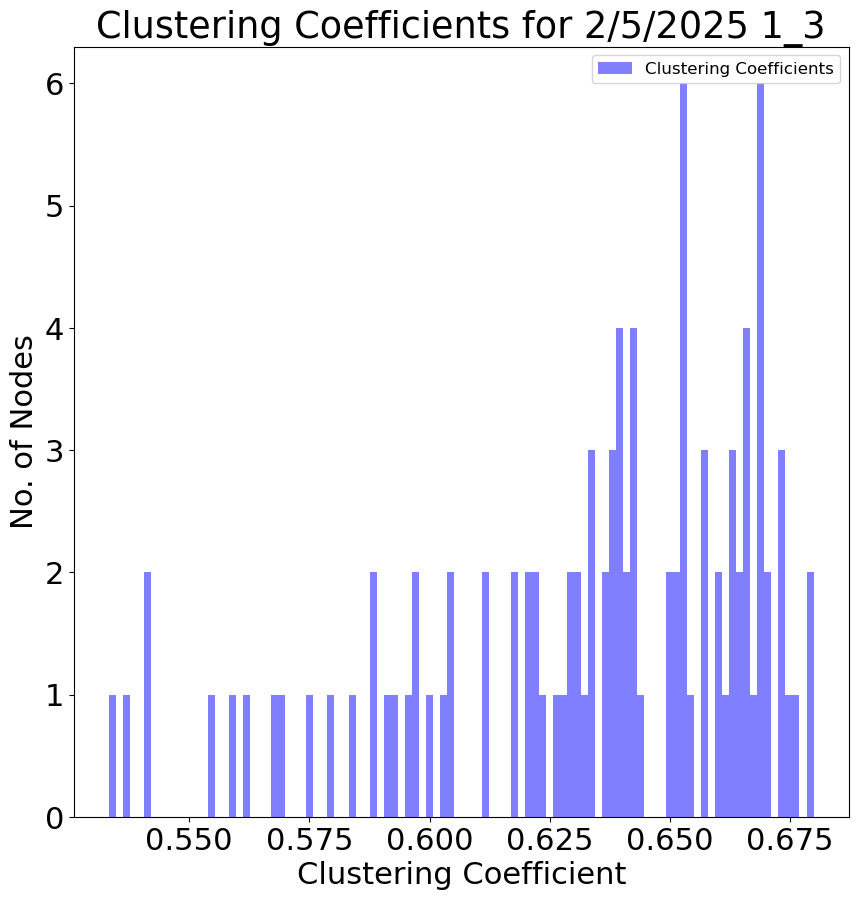

Modularity: 0.030611605078983306
Betweenness Centrality: {0: 0.00041228612657184083, 1: 0.0, 2: 0.0, 3: 0.0, 4: 0.0, 5: 0.0, 6: 0.0, 7: 0.0, 8: 0.0, 9: 0.0010307153164296021, 10: 0.0, 11: 0.0, 12: 0.00020614306328592042, 13: 0.0016491445062873633, 14: 0.0, 15: 0.0, 16: 0.0, 17: 0.0, 18: 0.0, 19: 0.0, 20: 0.0, 21: 0.0, 22: 0.0, 23: 0.0, 24: 0.0, 25: 0.0, 26: 0.0, 27: 0.0, 28: 0.0, 29: 0.0, 30: 0.0, 31: 0.0, 32: 0.0, 33: 0.0, 34: 0.0, 35: 0.0, 36: 0.0, 37: 0.0, 38: 0.0, 39: 0.0, 40: 0.0006184291898577612, 41: 0.0, 42: 0.0, 43: 0.0, 44: 0.0, 45: 0.0016491445062873633, 46: 0.0006184291898577612, 47: 0.0, 48: 0.0, 49: 0.0, 50: 0.0, 51: 0.0, 52: 0.0, 53: 0.0, 54: 0.0, 55: 0.0, 56: 0.0, 57: 0.0, 58: 0.0, 59: 0.0, 60: 0.0, 61: 0.0, 62: 0.0, 63: 0.0, 64: 0.022881880024737167, 65: 0.0, 66: 0.0, 67: 0.0, 68: 0.0, 69: 0.0, 70: 0.0, 71: 0.0, 72: 0.0, 73: 0.0, 74: 0.0, 75: 0.0, 76: 0.0, 77: 0.00041228612657184083, 78: 0.0, 79: 0.0, 80: 0.0, 81: 0.0, 82: 0.0, 83: 0.0, 84: 0.0, 85: 0.0, 86: 0.0, 87: 0

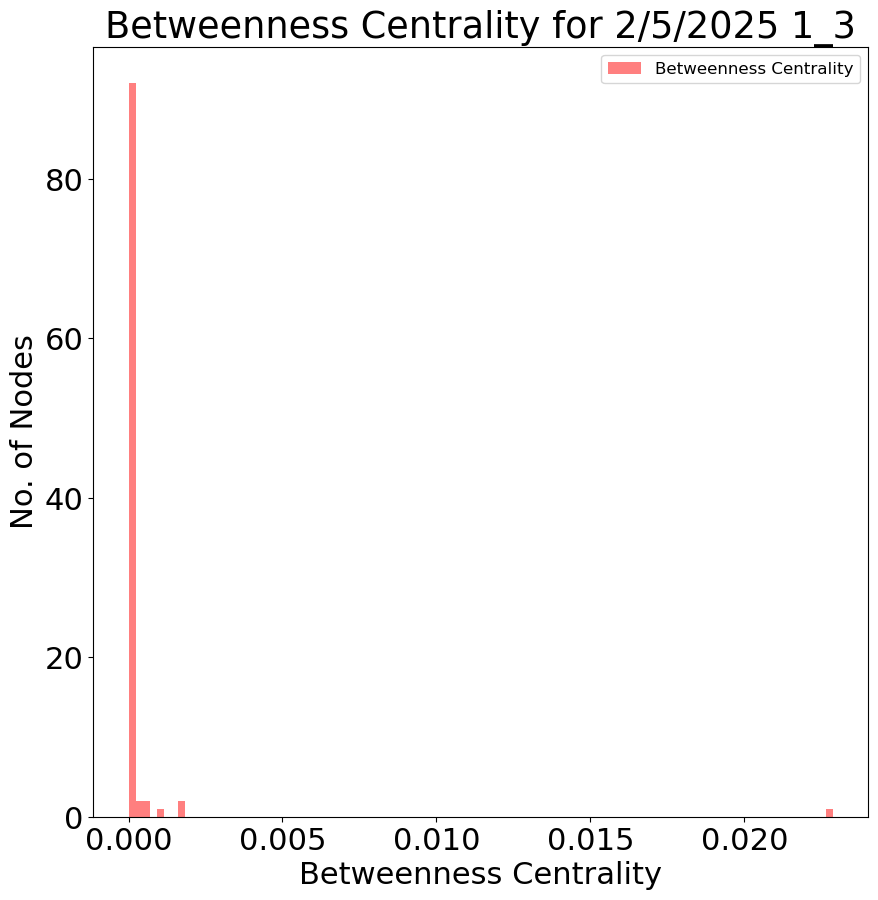

Date:  2/5/2025 Slice:  2 Location:  2
Avg corr shape:  (26, 100, 100)
Clustering: [0.8399485732147471, 0.8390134682496011, 0.8680922803409263, 0.8558406524706216, 0.8564957640833168, 0.8392908890288638, 0.85714251051728, 0.8841315754674424, 0.8532770095664847, 0.8749638753747601, 0.8665500654478311, 0.8794585438233927, 0.7625022695542383, 0.863333793548866, 0.8391073647192951, 0.8419930921654823, 0.8619845448949262, 0.8454342805191515, 0.8832451863897095, 0.746606019595677, 0.8774633833522298, 0.8593610831412906, 0.8563063171639048, 0.8672992743768436, 0.8563885242961624, 0.8525370004549359, 0.8723461745999355, 0.8781778772546068, 0.8760685054009016, 0.873718859192615, 0.8629308783884376, 0.8696999992691059, 0.8538017327917498, 0.8572670436419174, 0.8673017901479539, 0.8607721672606387, 0.8649174404897484, 0.8562238427465717, 0.876129388132038, 0.8723135485832343, 0.8817960183829259, 0.8702809089770327, 0.8770635516376768, 0.8600041523208076, 0.858571911975563, 0.8703608231237453, 0.8

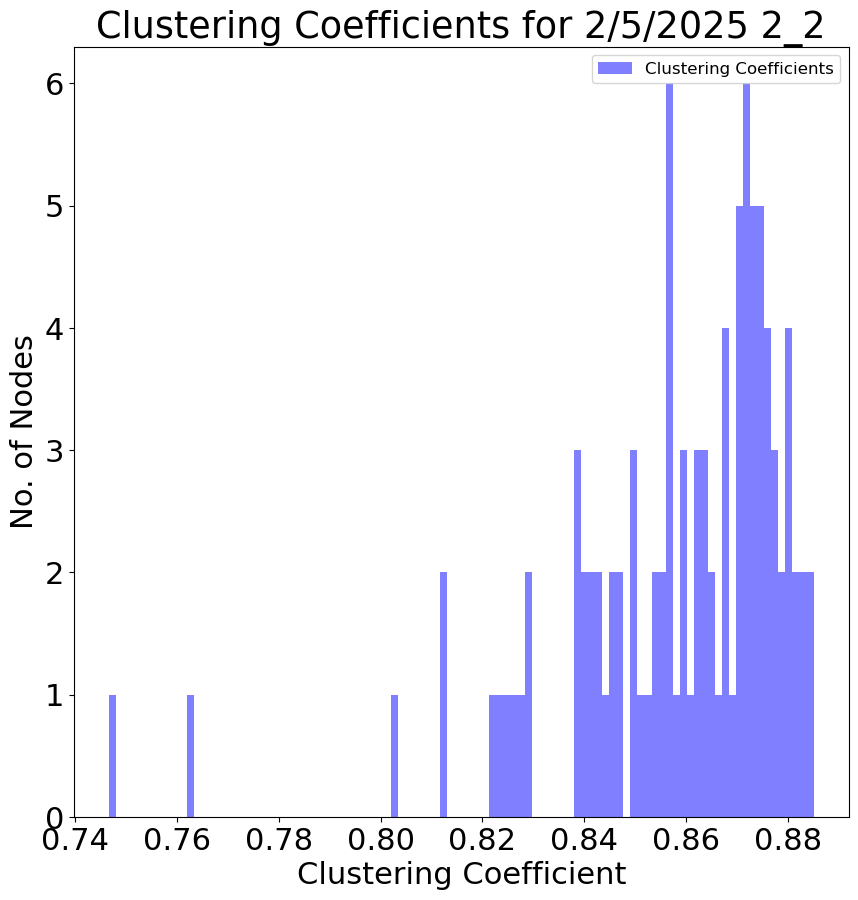

Modularity: 0.01669628073077689
Betweenness Centrality: {0: 0.0, 1: 0.0, 2: 0.0, 3: 0.0, 4: 0.0, 5: 0.0, 6: 0.0, 7: 0.0, 8: 0.0, 9: 0.0, 10: 0.0, 11: 0.0, 12: 0.0, 13: 0.0, 14: 0.0, 15: 0.0, 16: 0.0, 17: 0.0, 18: 0.0, 19: 0.0, 20: 0.0, 21: 0.0, 22: 0.0, 23: 0.0, 24: 0.0, 25: 0.0, 26: 0.0, 27: 0.0, 28: 0.0, 29: 0.0, 30: 0.0, 31: 0.0, 32: 0.0, 33: 0.0, 34: 0.0, 35: 0.0, 36: 0.0, 37: 0.0, 38: 0.0, 39: 0.0, 40: 0.0, 41: 0.0, 42: 0.0, 43: 0.0, 44: 0.0, 45: 0.0, 46: 0.0, 47: 0.0, 48: 0.0, 49: 0.0, 50: 0.0, 51: 0.0, 52: 0.0, 53: 0.0, 54: 0.0, 55: 0.0, 56: 0.0, 57: 0.0, 58: 0.0, 59: 0.0, 60: 0.0, 61: 0.0, 62: 0.0, 63: 0.0, 64: 0.0, 65: 0.0, 66: 0.0, 67: 0.0, 68: 0.0, 69: 0.0, 70: 0.0, 71: 0.0, 72: 0.0, 73: 0.0, 74: 0.0, 75: 0.0, 76: 0.0, 77: 0.0, 78: 0.0, 79: 0.0, 80: 0.0, 81: 0.0, 82: 0.0, 83: 0.0, 84: 0.0, 85: 0.0, 86: 0.0, 87: 0.0, 88: 0.0, 89: 0.0, 90: 0.0, 91: 0.0, 92: 0.0, 93: 0.0, 94: 0.0, 95: 0.0, 96: 0.0, 97: 0.0, 98: 0.0, 99: 0.0}


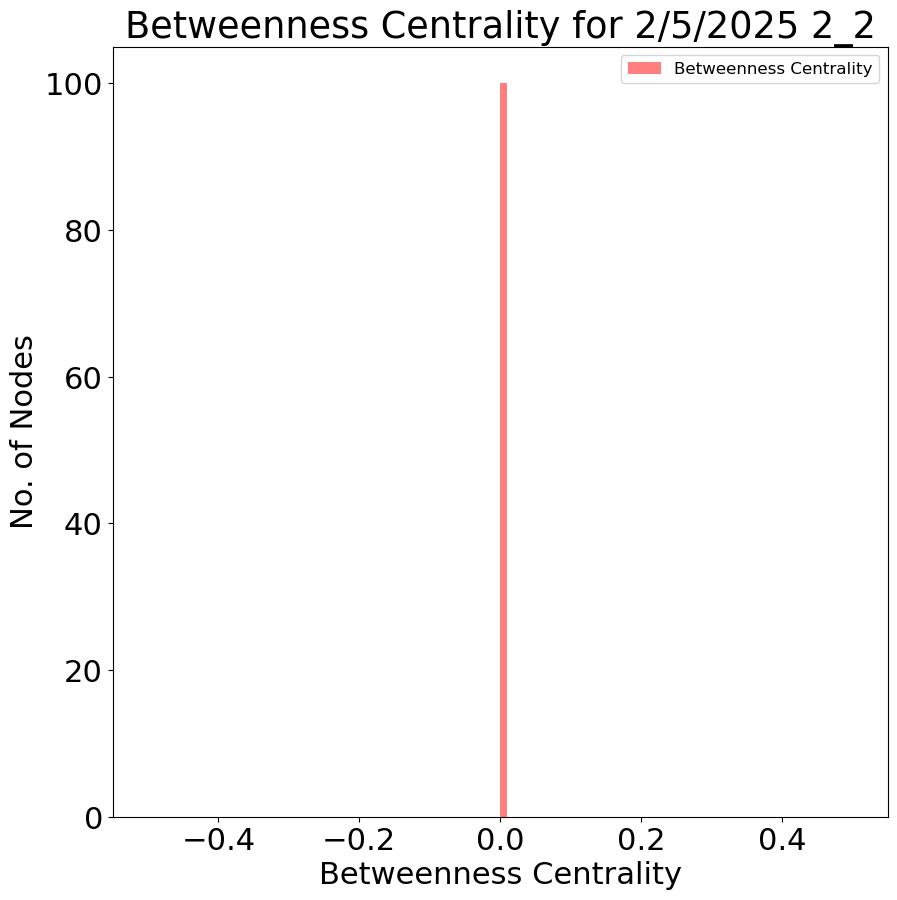

Date:  4/16/2025 Slice:  1 Location:  1
Avg corr shape:  (26, 100, 100)
Clustering: [0.8209684864818994, 0.8012512341671455, 0.808856079682221, 0.8124582759965788, 0.7796526562775036, 0.8114101575750353, 0.8276819645052943, 0.7970409197864881, 0.7852249063087712, 0.7846349787627227, 0.7998545187543046, 0.8063291506110654, 0.8264585411559283, 0.8071777273464535, 0.8071507088522103, 0.7910086087635703, 0.8079190044509047, 0.8075896438792417, 0.829789590386624, 0.776186227059673, 0.8234366486346365, 0.7650541957964805, 0.8062749404950175, 0.7907827105838237, 0.8170807581952347, 0.7826216681895746, 0.8013504109468771, 0.8169309341416926, 0.7915363742853827, 0.7974052926481493, 0.8190925807542807, 0.8219100084918762, 0.8030846141934889, 0.8156389278165829, 0.827844315291604, 0.8200953534876635, 0.7751608913420198, 0.8152650864978901, 0.8036527450267551, 0.8323441197456778, 0.815299463632494, 0.7926087665784619, 0.809029144601643, 0.8062881886757364, 0.8137808494063281, 0.8234270016552275, 0

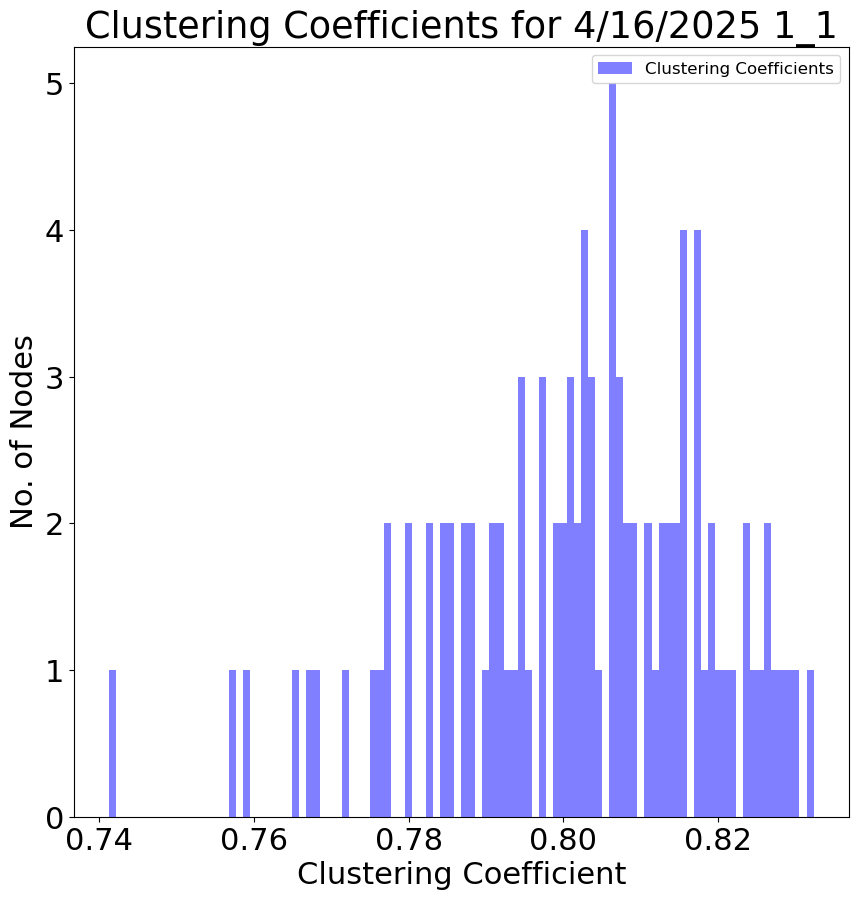

Modularity: 0.011900548896759872
Betweenness Centrality: {0: 0.0, 1: 0.0, 2: 0.0, 3: 0.0, 4: 0.0, 5: 0.0, 6: 0.0, 7: 0.0, 8: 0.0, 9: 0.0, 10: 0.0, 11: 0.0, 12: 0.0, 13: 0.0, 14: 0.0, 15: 0.0, 16: 0.0, 17: 0.0, 18: 0.0, 19: 0.0, 20: 0.0, 21: 0.0, 22: 0.0, 23: 0.0, 24: 0.0, 25: 0.0, 26: 0.0, 27: 0.0, 28: 0.0, 29: 0.0, 30: 0.0, 31: 0.0, 32: 0.0, 33: 0.0, 34: 0.0, 35: 0.0, 36: 0.0, 37: 0.0, 38: 0.0, 39: 0.0, 40: 0.0, 41: 0.0, 42: 0.0, 43: 0.0, 44: 0.0, 45: 0.0, 46: 0.0, 47: 0.0, 48: 0.0, 49: 0.0, 50: 0.0, 51: 0.0, 52: 0.0, 53: 0.0, 54: 0.0, 55: 0.0, 56: 0.0, 57: 0.0, 58: 0.0, 59: 0.0, 60: 0.0, 61: 0.0, 62: 0.0, 63: 0.0, 64: 0.0, 65: 0.0, 66: 0.0, 67: 0.0, 68: 0.0, 69: 0.0, 70: 0.0, 71: 0.0, 72: 0.0, 73: 0.0, 74: 0.0, 75: 0.0, 76: 0.0, 77: 0.0, 78: 0.0, 79: 0.0, 80: 0.0, 81: 0.0, 82: 0.0, 83: 0.0, 84: 0.0, 85: 0.0, 86: 0.0, 87: 0.0, 88: 0.0, 89: 0.0, 90: 0.0, 91: 0.0, 92: 0.0, 93: 0.0, 94: 0.0, 95: 0.0, 96: 0.0, 97: 0.0, 98: 0.0, 99: 0.0}


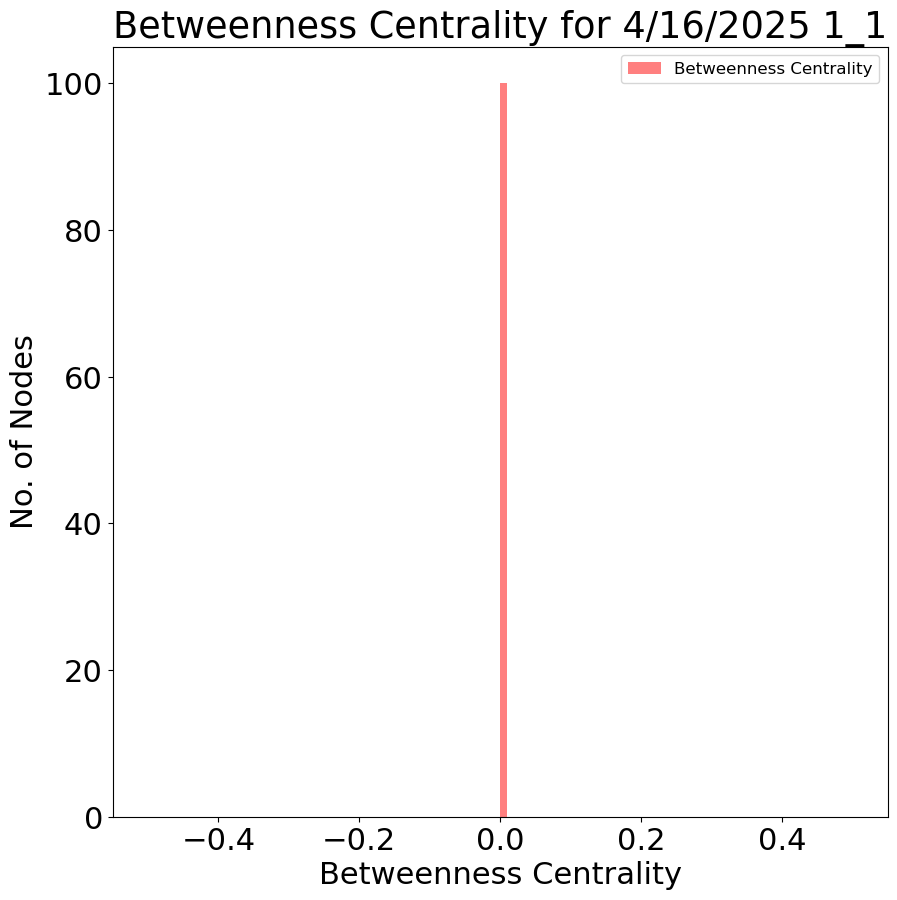

Date:  4/16/2025 Slice:  2 Location:  2
Avg corr shape:  (12, 100, 100)
Clustering: [0.8078616976330713, 0.82119259789857, 0.8128099869562331, 0.7907236098082782, 0.8303695042826552, 0.8304656116919915, 0.8229649682951283, 0.796223122317055, 0.8084662875435058, 0.7420826235243256, 0.8160501548399227, 0.8021607133728462, 0.8211531258273443, 0.8158743077574838, 0.7867571556403746, 0.7687323057788839, 0.8150077385967791, 0.8156554110770065, 0.7509810470301284, 0.7990067560727601, 0.7619402980014537, 0.7622229533324653, 0.8101636813214773, 0.8106300364633087, 0.8198357236858075, 0.7864294408272521, 0.8079996911550852, 0.7466284014278918, 0.7809709107466097, 0.820248569097689, 0.8233390481241177, 0.8260039229191841, 0.8033328320028451, 0.7506117128055653, 0.8049921393247939, 0.7628885178582266, 0.8126081693068369, 0.7786618817932466, 0.8066671514846786, 0.8101802814653701, 0.7259951235957401, 0.7045470506722713, 0.8196339760242961, 0.8035096488910876, 0.8205603993405292, 0.8002786515528753,

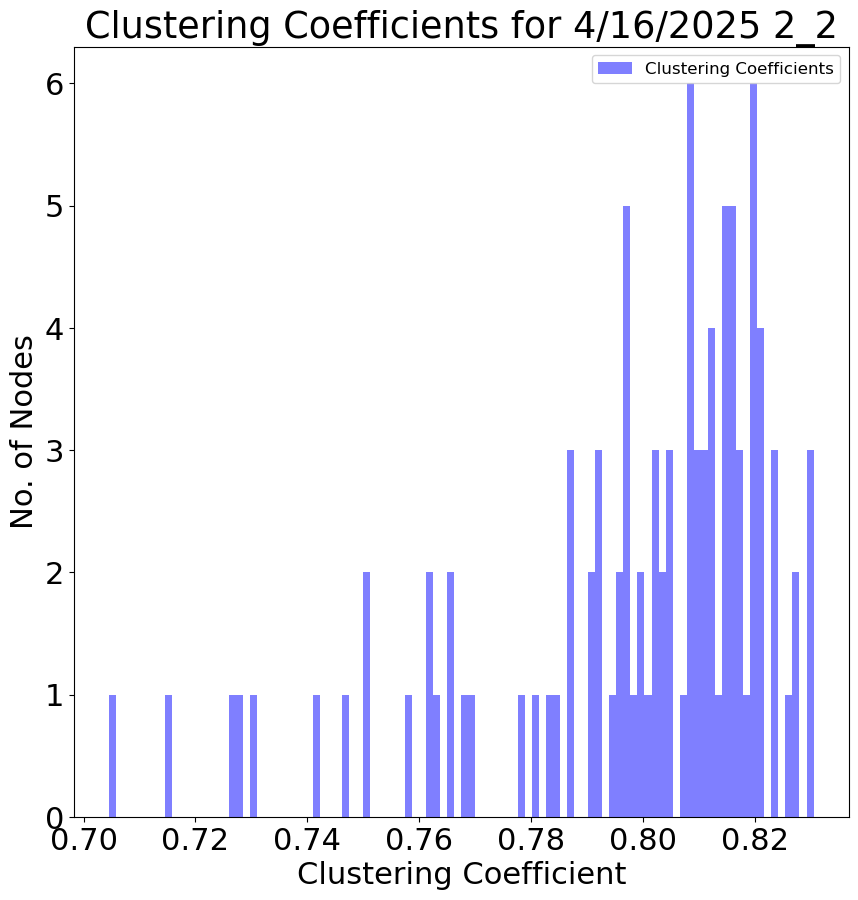

Modularity: 0.004172142141318461
Betweenness Centrality: {0: 0.0, 1: 0.0, 2: 0.0, 3: 0.0, 4: 0.0, 5: 0.0, 6: 0.0, 7: 0.0, 8: 0.0, 9: 0.0, 10: 0.0, 11: 0.0, 12: 0.0, 13: 0.0, 14: 0.0, 15: 0.0, 16: 0.0, 17: 0.0, 18: 0.0, 19: 0.0, 20: 0.0, 21: 0.0, 22: 0.0, 23: 0.0, 24: 0.0, 25: 0.0, 26: 0.0, 27: 0.0, 28: 0.0, 29: 0.0, 30: 0.0, 31: 0.0, 32: 0.0, 33: 0.0, 34: 0.0, 35: 0.0, 36: 0.0, 37: 0.0, 38: 0.0, 39: 0.0, 40: 0.0, 41: 0.0, 42: 0.0, 43: 0.0, 44: 0.0, 45: 0.0, 46: 0.0, 47: 0.0, 48: 0.0, 49: 0.0, 50: 0.0, 51: 0.0, 52: 0.0, 53: 0.0, 54: 0.0, 55: 0.0, 56: 0.0, 57: 0.0, 58: 0.0, 59: 0.0, 60: 0.0, 61: 0.0, 62: 0.0, 63: 0.0, 64: 0.0, 65: 0.0, 66: 0.0, 67: 0.0, 68: 0.0, 69: 0.0, 70: 0.0, 71: 0.0, 72: 0.0, 73: 0.0, 74: 0.0, 75: 0.0, 76: 0.0, 77: 0.0, 78: 0.0, 79: 0.0, 80: 0.0, 81: 0.0, 82: 0.0, 83: 0.0, 84: 0.0, 85: 0.0, 86: 0.0, 87: 0.0, 88: 0.0, 89: 0.0, 90: 0.0, 91: 0.0, 92: 0.0, 93: 0.0, 94: 0.0, 95: 0.0, 96: 0.0, 97: 0.0, 98: 0.0, 99: 0.0}


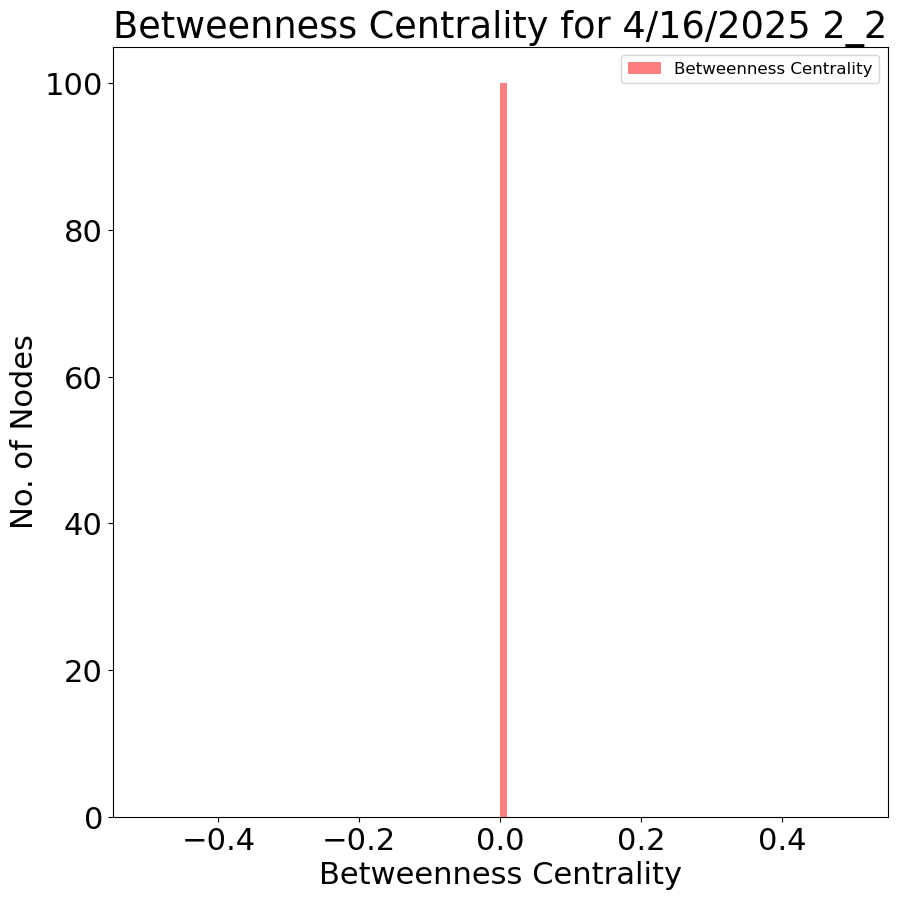

No corr_matrices_by_slice for this date/slice/location
Date:  4/9/2025 Slice:  1 Location:  2
Avg corr shape:  (16, 100, 100)
Clustering: [0.8395835603932793, 0.8569981063896742, 0.8617453376469876, 0.8058185722825157, 0.8313913872894397, 0.8513291041930513, 0.7930096841453432, 0.8575473072892037, 0.8249710626108353, 0.8360509664249675, 0.8411215417833855, 0.8445821847731318, 0.8380676584628649, 0.8476232556793779, 0.8158087009728938, 0.8484969049426849, 0.826742142296293, 0.8226515957867094, 0.8346434749634263, 0.8501249198109241, 0.8342710631417656, 0.8374822871075448, 0.8605400400137945, 0.8254101663672969, 0.8484896485165185, 0.8237076340948087, 0.8259637586972126, 0.8320390937481712, 0.8334932781700883, 0.847248845627593, 0.8192523095735563, 0.8261073435728157, 0.8576345759693974, 0.8178053007397639, 0.8180322018254584, 0.8432522747287029, 0.8570889761197247, 0.8467343472283985, 0.8304793639616909, 0.8390235997727488, 0.816581632712612, 0.8223463692099432, 0.844233643014121, 0.835

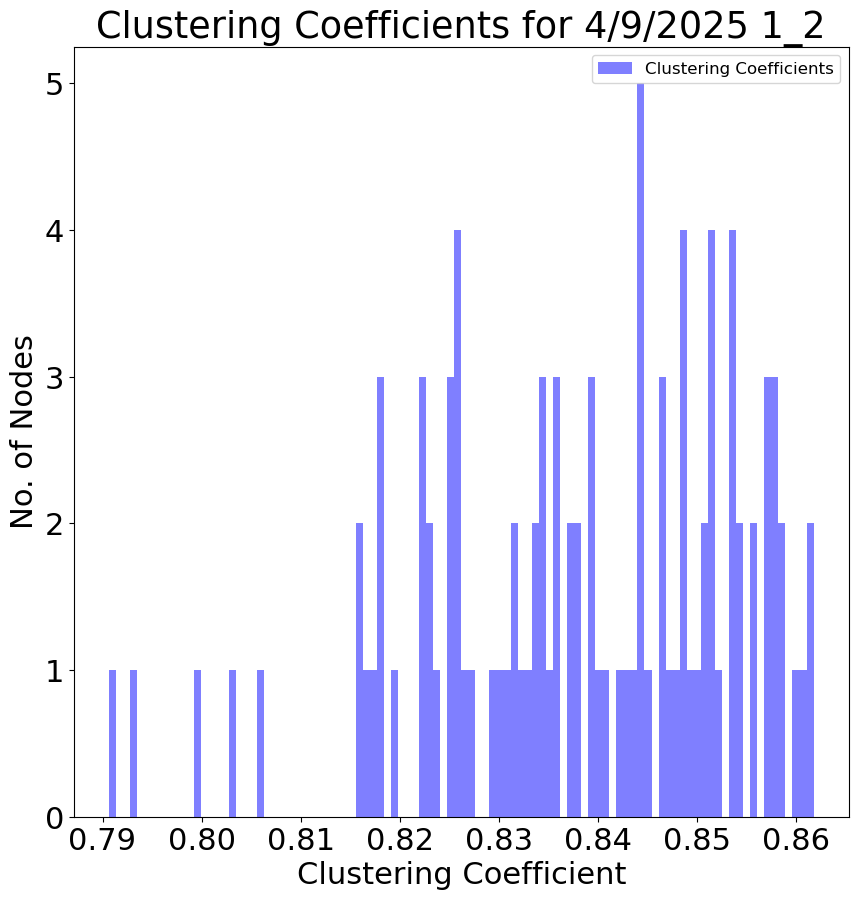

Modularity: 0.004547273921552589
Betweenness Centrality: {0: 0.0, 1: 0.0, 2: 0.0, 3: 0.0, 4: 0.0, 5: 0.0, 6: 0.0, 7: 0.0, 8: 0.0, 9: 0.0, 10: 0.0, 11: 0.0, 12: 0.0, 13: 0.0, 14: 0.0, 15: 0.0, 16: 0.0, 17: 0.0, 18: 0.0, 19: 0.0, 20: 0.0, 21: 0.0, 22: 0.0, 23: 0.0, 24: 0.0, 25: 0.0, 26: 0.0, 27: 0.0, 28: 0.0, 29: 0.0, 30: 0.0, 31: 0.0, 32: 0.0, 33: 0.0, 34: 0.0, 35: 0.0, 36: 0.0, 37: 0.0, 38: 0.0, 39: 0.0, 40: 0.0, 41: 0.0, 42: 0.0, 43: 0.0, 44: 0.0, 45: 0.0, 46: 0.0, 47: 0.0, 48: 0.0, 49: 0.0, 50: 0.0, 51: 0.0, 52: 0.0, 53: 0.0, 54: 0.0, 55: 0.0, 56: 0.0, 57: 0.0, 58: 0.0, 59: 0.0, 60: 0.0, 61: 0.0, 62: 0.0, 63: 0.0, 64: 0.0, 65: 0.0, 66: 0.0, 67: 0.0, 68: 0.0, 69: 0.0, 70: 0.0, 71: 0.0, 72: 0.0, 73: 0.0, 74: 0.0, 75: 0.0, 76: 0.0, 77: 0.0, 78: 0.0, 79: 0.0, 80: 0.0, 81: 0.0, 82: 0.0, 83: 0.0, 84: 0.0, 85: 0.0, 86: 0.0, 87: 0.0, 88: 0.0, 89: 0.0, 90: 0.0, 91: 0.0, 92: 0.0, 93: 0.0, 94: 0.0, 95: 0.0, 96: 0.0, 97: 0.0, 98: 0.0, 99: 0.0}


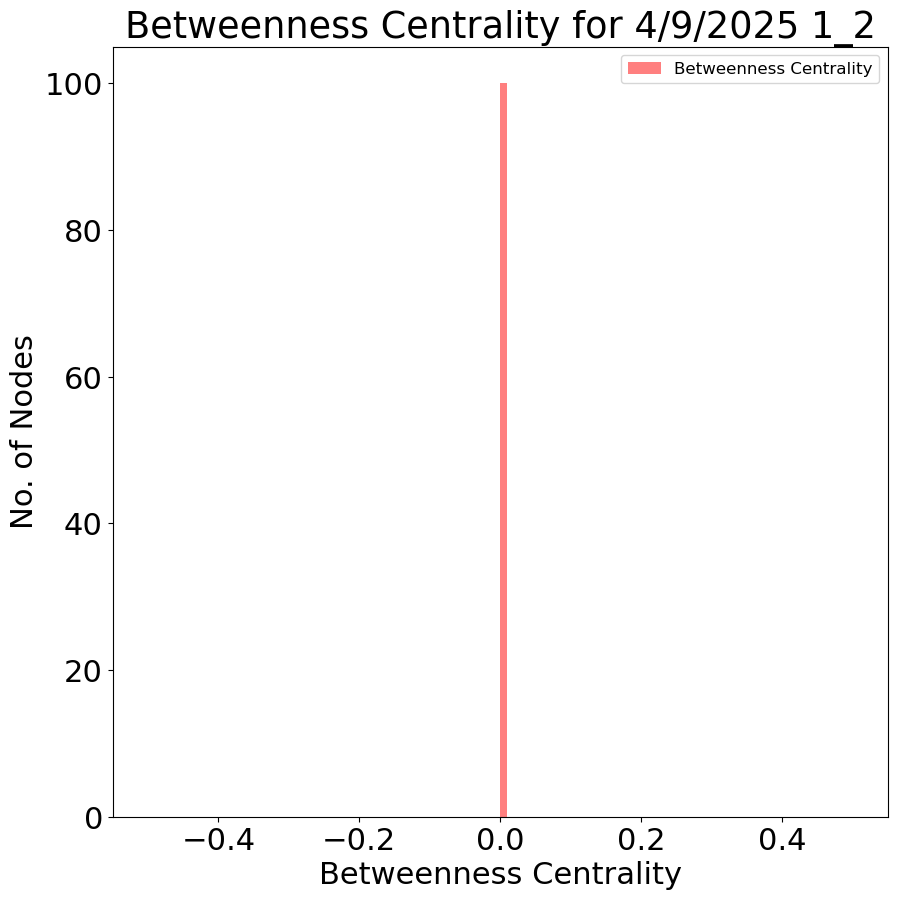

Date:  4/9/2025 Slice:  2 Location:  2
Avg corr shape:  (24, 100, 100)
Clustering: [0.8025413141186656, 0.8262927784885761, 0.8299386791023693, 0.8114830567828113, 0.8305429061898708, 0.7926093867102224, 0.8082070769095712, 0.7919927532660007, 0.8184202224303303, 0.7930418024491481, 0.8315088231630997, 0.7802382256478217, 0.831789725241047, 0.7811055327939319, 0.7711417313879025, 0.7617215500714156, 0.8025187693720277, 0.8328856047183362, 0.7790606285768434, 0.8084318941112558, 0.829105561572064, 0.8313670672215601, 0.8312919017413124, 0.8273393723833333, 0.7921068637862847, 0.7899200445870296, 0.8361925283489453, 0.8155626981577502, 0.833704953720228, 0.8028098174935167, 0.8302438682081501, 0.8312609279805421, 0.8328886760179091, 0.8325619705310967, 0.8010055943810583, 0.8144845255662723, 0.8320219398207768, 0.8297724582162008, 0.8295568810058191, 0.8279099722792513, 0.8306330483489636, 0.8191567853624144, 0.8052834302645355, 0.8197457140987868, 0.8204356682376224, 0.8262773565994459,

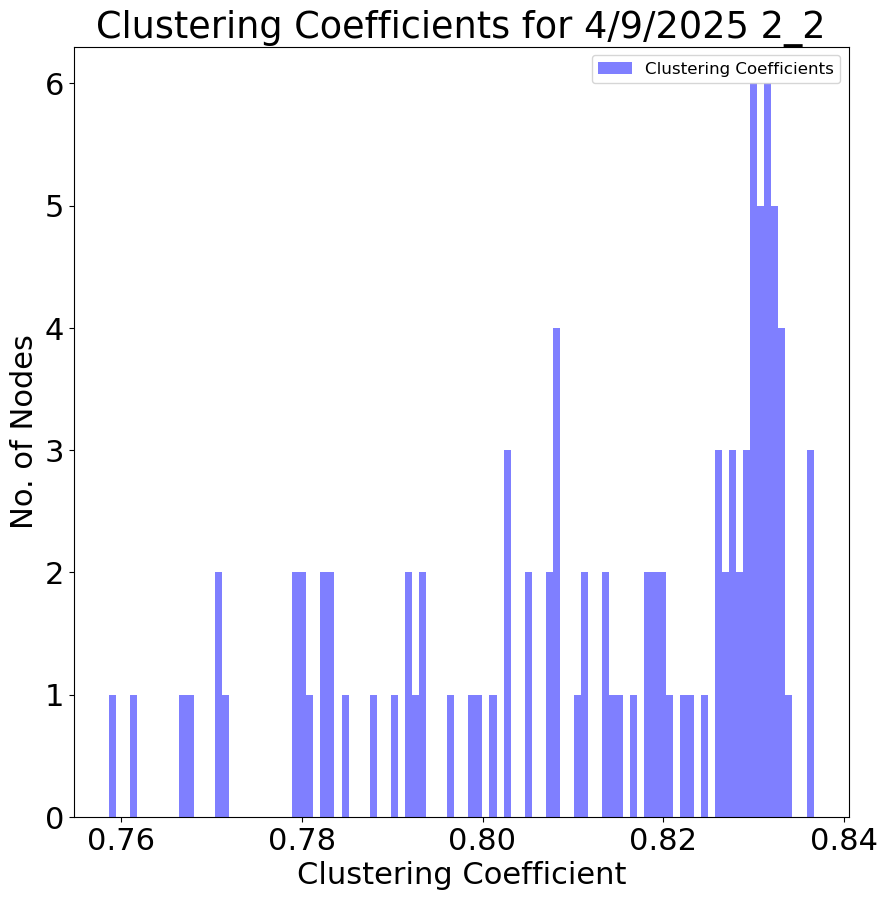

Modularity: 0.008984609495483381
Betweenness Centrality: {0: 0.0, 1: 0.0, 2: 0.0, 3: 0.0, 4: 0.0, 5: 0.0, 6: 0.0, 7: 0.0, 8: 0.0, 9: 0.0, 10: 0.0, 11: 0.0, 12: 0.0, 13: 0.0, 14: 0.0, 15: 0.0, 16: 0.0, 17: 0.0, 18: 0.0, 19: 0.0, 20: 0.0, 21: 0.0, 22: 0.0, 23: 0.0, 24: 0.0, 25: 0.0, 26: 0.0, 27: 0.0, 28: 0.0, 29: 0.0, 30: 0.0, 31: 0.0, 32: 0.0, 33: 0.0, 34: 0.0, 35: 0.0, 36: 0.0, 37: 0.0, 38: 0.0, 39: 0.0, 40: 0.0, 41: 0.0, 42: 0.0, 43: 0.0, 44: 0.0, 45: 0.0, 46: 0.0, 47: 0.0, 48: 0.0, 49: 0.0, 50: 0.0, 51: 0.0, 52: 0.0, 53: 0.0, 54: 0.0, 55: 0.0, 56: 0.0, 57: 0.0, 58: 0.0, 59: 0.0, 60: 0.0, 61: 0.0, 62: 0.0, 63: 0.0, 64: 0.0, 65: 0.0, 66: 0.0, 67: 0.0, 68: 0.0, 69: 0.0, 70: 0.0, 71: 0.0, 72: 0.0, 73: 0.0, 74: 0.0, 75: 0.0, 76: 0.0, 77: 0.0, 78: 0.0, 79: 0.0, 80: 0.0, 81: 0.0, 82: 0.0, 83: 0.0, 84: 0.0, 85: 0.0, 86: 0.0, 87: 0.0, 88: 0.0, 89: 0.0, 90: 0.0, 91: 0.0, 92: 0.0, 93: 0.0, 94: 0.0, 95: 0.0, 96: 0.0, 97: 0.0, 98: 0.0, 99: 0.0}


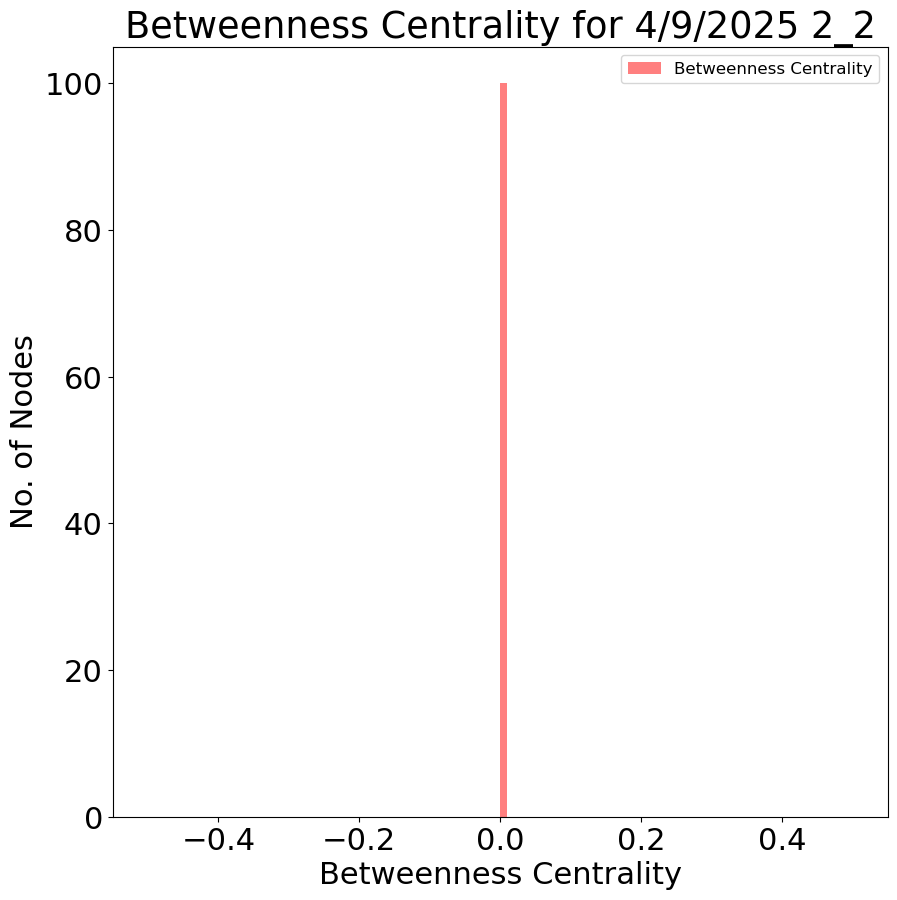

Date:  4/9/2025 Slice:  3 Location:  2
Avg corr shape:  (26, 100, 100)
Clustering: [0.8499983541094287, 0.867572527549703, 0.8575879776428725, 0.867582149005468, 0.8711753751840758, 0.8705229597383304, 0.8739526440326633, 0.856474590419313, 0.8703277467719619, 0.8674362727727888, 0.8698005765779677, 0.8617500739276186, 0.8602188383807514, 0.8679924688451351, 0.8048570843609864, 0.8421110039928144, 0.866296051015336, 0.8532713002609813, 0.8125348897540186, 0.8677899185243629, 0.8627740869945044, 0.8683512255608453, 0.8732728007399666, 0.8676510728065178, 0.815100284061571, 0.8694559291665356, 0.8339394437753561, 0.8355954948164371, 0.8335113285609724, 0.8687238657413628, 0.8638103801402041, 0.8679681723404084, 0.8680798993403083, 0.8688193987330144, 0.8455199903291928, 0.8685418374833203, 0.8194557449176814, 0.8491469918886089, 0.8443906425872093, 0.7900446191034748, 0.8629873496407692, 0.8647101098689126, 0.8669461721885373, 0.866726654960779, 0.869755521516279, 0.8432165057205111, 0.8

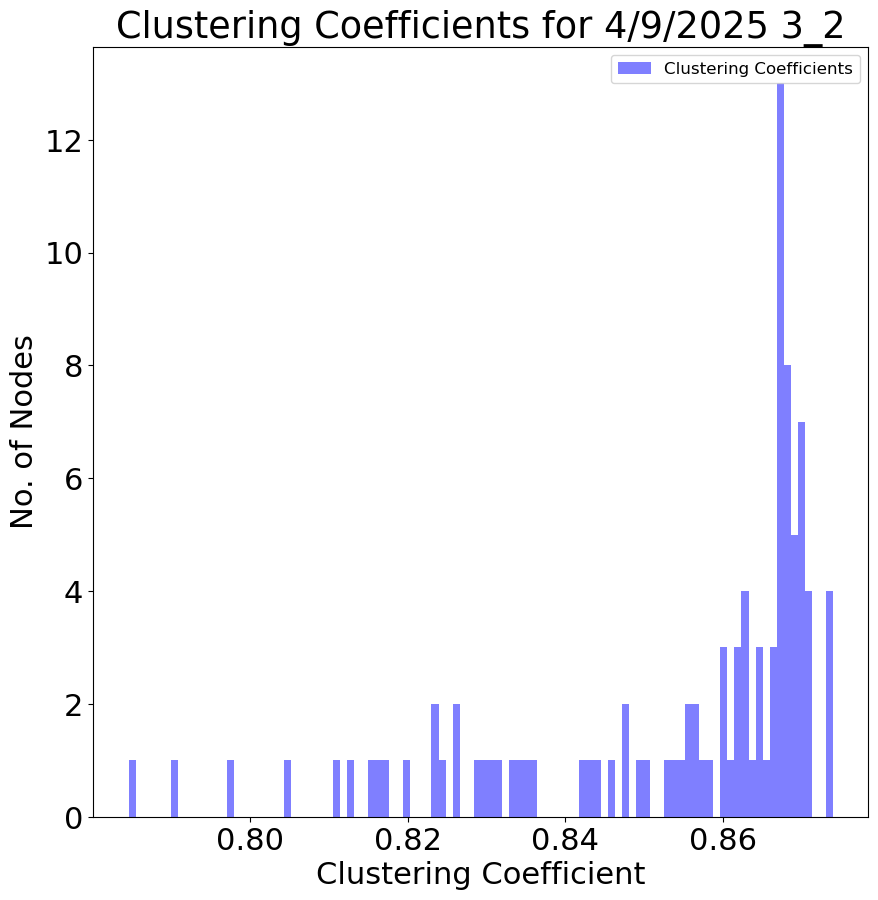

Modularity: 0.004735247607854681
Betweenness Centrality: {0: 0.0, 1: 0.0, 2: 0.0, 3: 0.0, 4: 0.0, 5: 0.0, 6: 0.0, 7: 0.0, 8: 0.0, 9: 0.0, 10: 0.0, 11: 0.0, 12: 0.0, 13: 0.0, 14: 0.0, 15: 0.0, 16: 0.0, 17: 0.0, 18: 0.0, 19: 0.0, 20: 0.0, 21: 0.0, 22: 0.0, 23: 0.0, 24: 0.0, 25: 0.0, 26: 0.0, 27: 0.0, 28: 0.0, 29: 0.0, 30: 0.0, 31: 0.0, 32: 0.0, 33: 0.0, 34: 0.0, 35: 0.0, 36: 0.0, 37: 0.0, 38: 0.0, 39: 0.0, 40: 0.0, 41: 0.0, 42: 0.0, 43: 0.0, 44: 0.0, 45: 0.0, 46: 0.0, 47: 0.0, 48: 0.0, 49: 0.0, 50: 0.0, 51: 0.0, 52: 0.0, 53: 0.0, 54: 0.0, 55: 0.0, 56: 0.0, 57: 0.0, 58: 0.0, 59: 0.0, 60: 0.0, 61: 0.0, 62: 0.0, 63: 0.0, 64: 0.0, 65: 0.0, 66: 0.0, 67: 0.0, 68: 0.0, 69: 0.0, 70: 0.0, 71: 0.0, 72: 0.0, 73: 0.0, 74: 0.0, 75: 0.0, 76: 0.0, 77: 0.0, 78: 0.0, 79: 0.0, 80: 0.0, 81: 0.0, 82: 0.0, 83: 0.0, 84: 0.0, 85: 0.0, 86: 0.0, 87: 0.0, 88: 0.0, 89: 0.0, 90: 0.0, 91: 0.0, 92: 0.0, 93: 0.0, 94: 0.0, 95: 0.0, 96: 0.0, 97: 0.0, 98: 0.0, 99: 0.0}


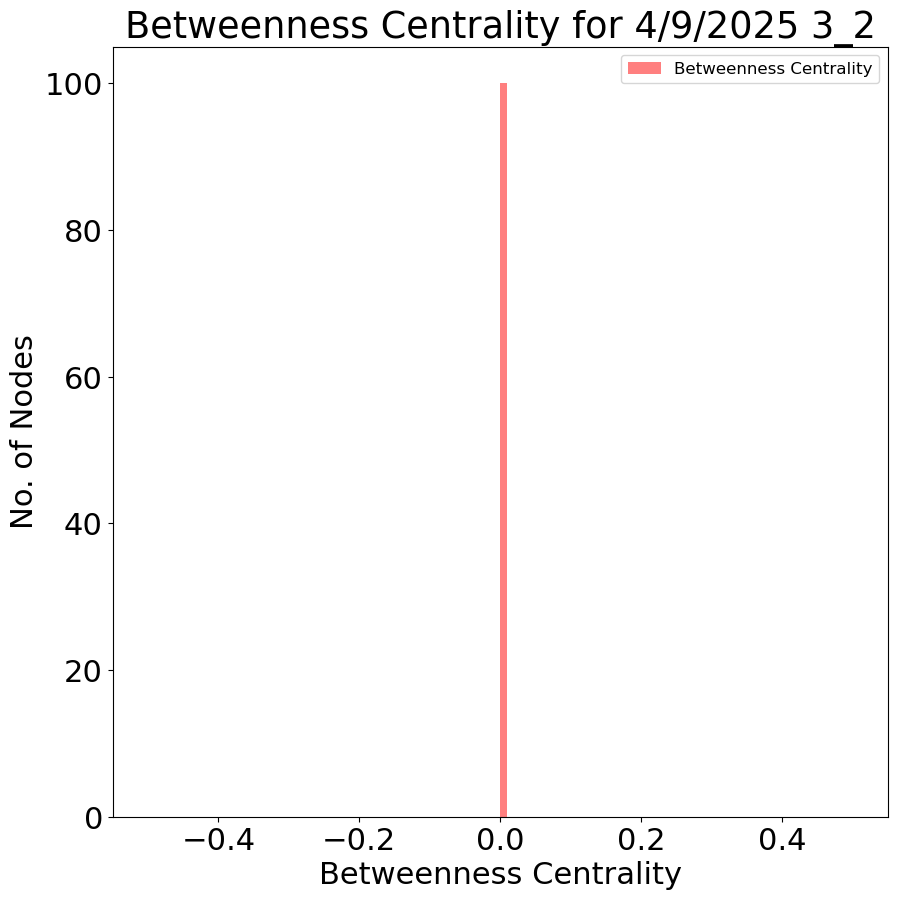

Date:  4/9/2025 Slice:  4 Location:  2
Avg corr shape:  (26, 100, 100)
Clustering: [0.7499163381031934, 0.721635247349834, 0.6482693979666421, 0.7499302693444758, 0.7192542201370724, 0.6610681535620179, 0.7174378803120981, 0.689808856788011, 0.7237998447999149, 0.7030203039011023, 0.7168597171625992, 0.6605593951017954, 0.6609278870481253, 0.7256606483486925, 0.7159096042956243, 0.7411701566390896, 0.7036462787032457, 0.7600130463072727, 0.7344699414845541, 0.7180554356538087, 0.7444724141783399, 0.7463603649980267, 0.6549905828030993, 0.7626446520099085, 0.7091668851616555, 0.7481726176825035, 0.6560799600339072, 0.6960227416031187, 0.751556406159217, 0.7065107669607575, 0.698057507460459, 0.7475481492282589, 0.754037776461475, 0.6930385637948193, 0.7252911334227881, 0.743100365756636, 0.7427296799271885, 0.7550548362614995, 0.650689279716439, 0.7294104982293339, 0.7577598437706858, 0.7170595563739423, 0.7429571276436491, 0.7593174762065585, 0.7289243983798012, 0.7434868422539676, 0.6

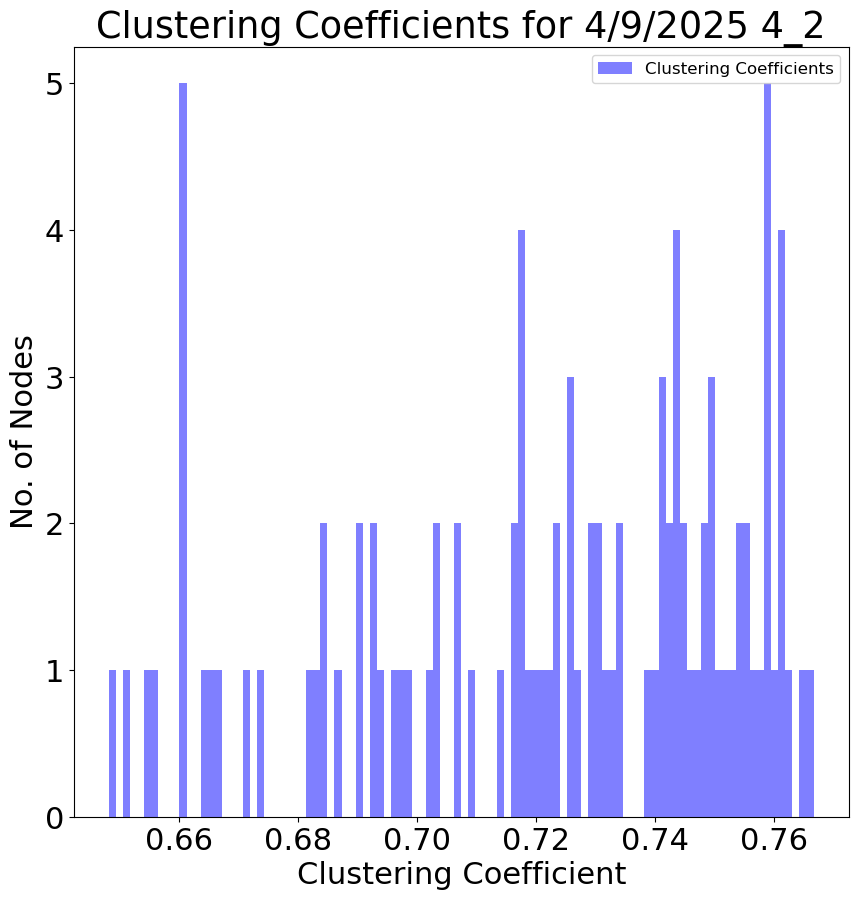

Modularity: 0.01313252415218404
Betweenness Centrality: {0: 0.0, 1: 0.0, 2: 0.0, 3: 0.0, 4: 0.0, 5: 0.0, 6: 0.0, 7: 0.0, 8: 0.0, 9: 0.0, 10: 0.0, 11: 0.0, 12: 0.0, 13: 0.0, 14: 0.0, 15: 0.0, 16: 0.0, 17: 0.0, 18: 0.0, 19: 0.0, 20: 0.0, 21: 0.0, 22: 0.0, 23: 0.0, 24: 0.0, 25: 0.0, 26: 0.0, 27: 0.0, 28: 0.0, 29: 0.0, 30: 0.0, 31: 0.0, 32: 0.0, 33: 0.0, 34: 0.0, 35: 0.0, 36: 0.0, 37: 0.0, 38: 0.0, 39: 0.0, 40: 0.0, 41: 0.0, 42: 0.0, 43: 0.0, 44: 0.0, 45: 0.0, 46: 0.0, 47: 0.0, 48: 0.0, 49: 0.0, 50: 0.0, 51: 0.0, 52: 0.0, 53: 0.0, 54: 0.0, 55: 0.0, 56: 0.0, 57: 0.0, 58: 0.0, 59: 0.0, 60: 0.0, 61: 0.0, 62: 0.0, 63: 0.0, 64: 0.0, 65: 0.0, 66: 0.0, 67: 0.0, 68: 0.0, 69: 0.0, 70: 0.0, 71: 0.0, 72: 0.0, 73: 0.0, 74: 0.0, 75: 0.0, 76: 0.0, 77: 0.0, 78: 0.0, 79: 0.0, 80: 0.0, 81: 0.0, 82: 0.0, 83: 0.0, 84: 0.0, 85: 0.0, 86: 0.0, 87: 0.0, 88: 0.0, 89: 0.0, 90: 0.0, 91: 0.0, 92: 0.0, 93: 0.0, 94: 0.0, 95: 0.0, 96: 0.0, 97: 0.0, 98: 0.0, 99: 0.0}


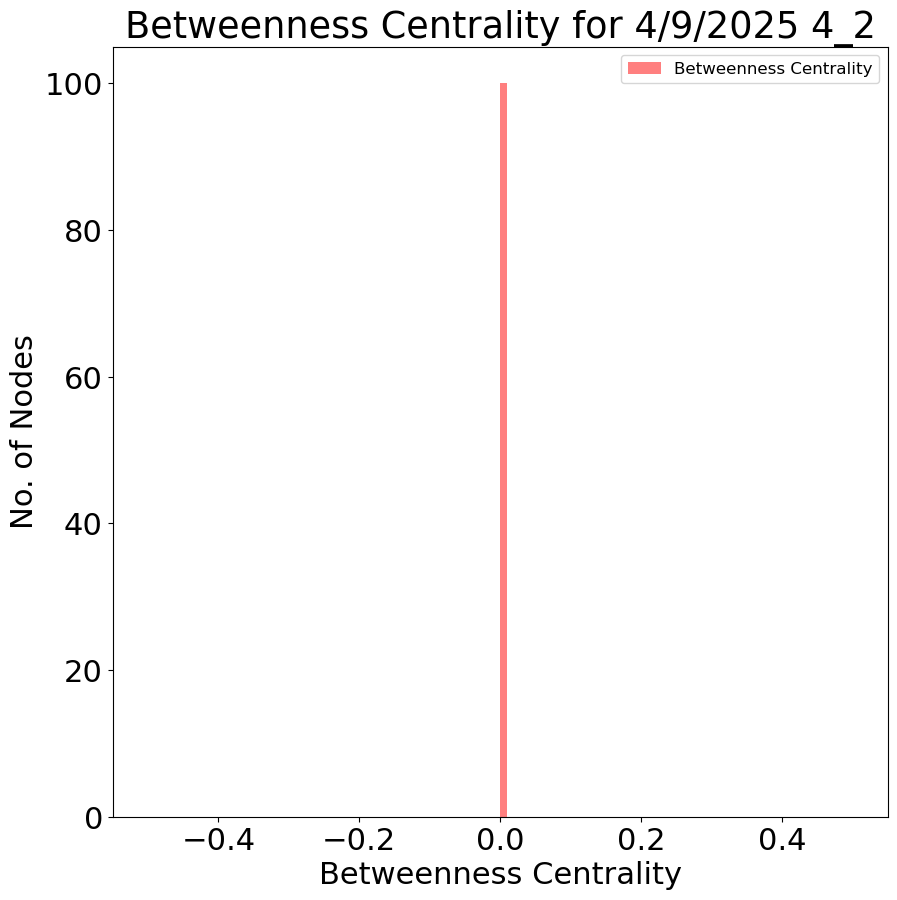

In [ ]:
# measure of betweeness centrality for each node
# betweeness centrality is the number of shortest paths that pass through a node


for date in ppr_df['Date'].unique():
    date_df = ppr_df[ppr_df['Date'] == date]
    if date not in corr_matrices_by_slice:
        print("No corr_matrices_by_slice for this date")
        continue
    for slic in date_df['Slice'].unique():
        slic_df = date_df[date_df['Slice'] == slic]
        for loc in slic_df['Location'].unique():
            loc_df = slic_df[slic_df['Location'] == loc]
            slic_loc_id = f"{slic}_{loc}"
            if slic_loc_id not in corr_matrices_by_slice[date]:
                print("No corr_matrices_by_slice for this date/slice/location")
                continue

            print("Date: ", date, "Slice: ", slic, "Location: ", loc)

            ppr_barrel_subset = ppr_barrel_df[(ppr_barrel_df['Date'] == date) &
                    (ppr_barrel_df['Slice'] == slic) &
                    (ppr_barrel_df['Location'] == loc)]
            if len(ppr_barrel_subset) == 0:
                print("No ppr_barrel_df for this date/slice/location")
                continue
            
            # now get the correlation matrix for this date/slice/location
            avg_corr = []
            # corr_matrices_by_slice[date][slic_loc_id][ipi][control_or_ppr_type][lag][i]
            for ipi in corr_matrices_by_slice[date][slic_loc_id].keys():
                for control_or_ppr_type in corr_matrices_by_slice[date][slic_loc_id][ipi].keys():
                    try:
                        avg_corr.append(corr_matrices_by_slice[date][slic_loc_id][ipi][control_or_ppr_type][optimal_lag])
                    except IndexError:
                        print("IndexError: ", ipi, control_or_ppr_type, optimal_lag, i_slice)
                        print('len(corr_matrices_by_slice[date][slic_loc_id][ipi][control_or_ppr_type][optimal_lag]): ',
                            len(corr_matrices_by_slice[date][slic_loc_id][ipi][control_or_ppr_type][optimal_lag])) # 
                        continue
            avg_corr = np.array([ac[1] for ac in avg_corr])
            avg_corr = np.array(avg_corr).reshape(-1, 100, 100)
            print("Avg corr shape: ", avg_corr.shape)
            avg_corr = np.mean(avg_corr, axis=0)

            if avg_corr.shape[0] < 10:
                print("Avg corr shape is too small: ", avg_corr.shape)
                continue

            G = nx.Graph()
            # avg_corr is a adjacency matrix, convert to edges in G
            for i in range(avg_corr.shape[0]):
                for j in range(i + 1, avg_corr.shape[1]):
                    if avg_corr[i, j] > 0:
                        G.add_edge(i, j, weight=avg_corr[i, j])

            # histogram of clustering
            clustering_coeffs = list(nx.clustering(G, weight='weight').values())
            print("Clustering:", clustering_coeffs)
            fig, ax = plt.subplots(figsize=(10, 10))
            ax.hist(clustering_coeffs, bins=100, color='blue', alpha=0.5, label='Clustering Coefficients')
            ax.set_xlabel('Clustering Coefficient')
            ax.set_ylabel('No. of Nodes')
            ax.set_title(f"Clustering Coefficients for {date} {slic_loc_id}")
            plt.legend(loc='upper right', fontsize=12)
            date_formatted = date.replace('/', '-')
            plt.savefig(f"{output_fig_dir}/{date_formatted}_{slic_loc_id}_"
                        f"clustering_distribution_barrel_cutoff_intrabarrel.png")
            plt.show()


            # calculate modularity
            # partition the graph into communities
            partition = nx.community.louvain_communities(G, weight='weight')
            modularity = nx.community.modularity(G, partition)
            print(f"Modularity: {modularity}")

            # betweenness centrality
            betweenness_centrality = nx.betweenness_centrality(G, weight='weight')
            print("Betweenness Centrality:", betweenness_centrality)
            # plot the betweenness centrality
            fig, ax = plt.subplots(figsize=(10, 10))
            ax.hist(list(betweenness_centrality.values()), bins=100, color='red', alpha=0.5, label='Betweenness Centrality')
            ax.set_xlabel('Betweenness Centrality')
            ax.set_ylabel('No. of Nodes')
            ax.set_title(f"Betweenness Centrality for {date} {slic_loc_id}")
            plt.legend(loc='upper right', fontsize=12)
            date_formatted = date.replace('/', '-')
            plt.savefig(f"{output_fig_dir}/{date_formatted}_{slic_loc_id}_"
                        f"betweenness_centrality_barrel_cutoff_intrabarrel.png")
            plt.show()

            
            

## 